<a href="https://colab.research.google.com/github/abharathkumarr/RAG-with-compute-optimization/blob/main/Retrieval_Augmented_Generation_with_Compute_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**1. Take 2 random poems recently written, scrape at least 20 pushcart nominated poems (see last assignment)**

## **Install & Import Statements**

In [ ]:
!pip install google-auth google-auth-oauthlib google-auth-httplib2 google-api-python-client

In [ ]:
!pip3 install nltk
!pip3 install sentence-transformers
!pip3 install contractions
!pip3 install pandas
!pip install gensim
!pip install pyLDAvis
!pip install spacy
!pip install requests
!pip install beautifulsoup4
!pip install lxml

  Using cached typing_extensions-4.11.0-py3-none-any.whl (34 kB)
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.7.1
    Uninstalling typing_extensions-4.7.1:
      Successfully uninstalled typing_extensions-4.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 2.2.2 which is incompatible.
fastapi-cli 0.0.3 requires typer>=0.12.3, but you have typer 0.9.4 which is incompatible.


In [ ]:
!pip uninstall -y numpy

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4


In [ ]:
pip install --upgrade --force-reinstall pandas

  Using cached pandas-2.2.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.0 MB)
  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Using cached python_dateutil-2.9.0.post0-py2.py3-none-any.whl (229 kB)
  Using cached pytz-2024.1-py2.py3-none-any.whl (505 kB)
  Using cached tzdata-2024.1-py2.py3-none-any.whl (345 kB)
  Using cached six-1.16.0-py2.py3-none-any.whl (11 kB)
  Attempting uninstall: pytz
    Found existing installation: pytz 2024.1
    Uninstalling pytz-2024.1:
      Successfully uninstalled pytz-2024.1
  Attempting uninstall: tzdata
    Found existing installation: tzdata 2024.1
    Uninstalling tzdata-2024.1:
      Successfully uninstalled tzdata-2024.1
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: python-dateutil
    Found existing installation: python-dateutil 2.9.0.post0
    Uninstalling

In [ ]:
import sys
print("Python version:", sys.version)

import pandas as pd
print("Pandas version:", pd.__version__)

Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
Pandas version: 2.2.2


In [ ]:
pip install --upgrade numpy

In [ ]:
import requests
import pandas as pd
import bs4 as bs
import urllib.request
import json
import contractions
import re
import nltk
from nltk.tokenize import word_tokenize

In [ ]:
from sentence_transformers import SentenceTransformer, util

In [ ]:
from nltk.corpus import stopwords
from transformers import pipeline
from spacy import displacy
import os
#from google.colab import drive
import pyLDAvis
import gensim
import spacy
import gensim.corpora as corpora
from gensim.models import CoherenceModel
import pyLDAvis.gensim_models as gensimvis
from gensim.utils import simple_preprocess
import pickle

2024-05-19 12:26:18.896376: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-19 12:26:18.896431: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-19 12:26:18.897838: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-19 12:26:18.906431: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-19 12:26:20.181942: W tensorflow/comp

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [ ]:
import warnings
warnings.filterwarnings('ignore', 'Calling')
warnings.filterwarnings('ignore', 'For a faster implementation')
warnings.filterwarnings('ignore', 'In')
warnings.filterwarnings('ignore', 'SelectableGroups dict interface')
warnings.filterwarnings('ignore', '`np')
warnings.filterwarnings('ignore', 'SelectableGroups')

In [ ]:
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

# **Scrape gold standard pushcart nominated poems**

In [ ]:
def clean_txt(text):
    text=text.replace(u'\xa0', u' ').replace(r'\r',u'\n').replace(r'\n', ' ').replace('\n', ' ').replace('\t', ' ')
    text = contractions.fix(text)
    text = text.strip().lower()
    text = re.sub(r"'", ' ', text)
    filters='!"\'#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n<'
    translate_dict = dict((i, " ") for i in filters)
    translate_map = str.maketrans(translate_dict)
    text = text.translate(translate_map)
    text = ' '.join([w for w in text.split() if len(w)>1])
    text = re.sub(' +', ' ', text)
    text = ''.join(text)
    print(text)
    return text

**Get poet names**

In [ ]:
import requests
from bs4 import BeautifulSoup

url = 'https://iowapoetry.com/pushcart2023.htm'
response = requests.get(url)
soup = BeautifulSoup(response.text, 'html.parser')

poems = soup.find_all('h1')
poets = []

for poem in poems:
    poets.append(poem.text.strip())

**Get poem titles**

In [ ]:
import requests
from bs4 import BeautifulSoup

url = 'https://iowapoetry.com/pushcart2023.htm'
response = requests.get(url)
soup = BeautifulSoup(response.text, 'html.parser')

poems = soup.find_all('b')
titles = []

for poem in poems:
    titles.append(poem.text.strip())

**Get contents of each poem**

In [ ]:
import requests
from bs4 import BeautifulSoup

url = "https://iowapoetry.com/pushcart2023.htm"
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')

poem_contents = []
current_poem = ""

for font in soup.find_all('font', {'face': 'fantasy'}):
    for p in font.find_all('p'):
        text = p.text.strip()
        if text.isupper():
            if current_poem:
                poem_contents.append(current_poem)
            current_poem = text
        else:
            current_poem += "\n" + text

if current_poem:
    poem_contents.append(current_poem)

print(poem_contents)


['LOUISA, AGE 6, AT REST\nLouisa alighting into place \rAlways dazzles me.\nShe twists with surpassing grace\rInto an inverted curtsey.\rHer arms smoothly interlace,\rAs she gets all topsy-turvy.\rUntil, in sudden about-face,\nShe folds her knees,\rAnd flees.', 'SOFIA\nI cannot disremember\rthree carefree boys\rdragging a bear cub\rthrough Macedonia Square -\ra ring through its\rbloodied\rnose.', 'NICHOLAS II\nThe ghost of the Tsar walks.\rHe passes some Jews and Gypsies.\rOne curses him; another throws a rock.\rBad angels fold their wings and watch.\nChoirs sang at his birth,\rArmies moved at his command.\rGod rang the bells\rWhen he walked into cathedrals.\rBut now he hears the noise from out the east\rAnd sees the fire in the western sky.\nDeath crowned him at his birth,\rHis cousins glittered throughout Europe.\rHe seldom followed good advice\rAnd did not ask permission.\rHe lost a navy in a foreign sea\rAnd an army gone at Tannenberg,\rBut still he played the emperor.\rMagnificenc

In [ ]:
poem_contents[0]

'LOUISA, AGE 6, AT REST\nLouisa alighting into place \rAlways dazzles me.\nShe twists with surpassing grace\rInto an inverted curtsey.\rHer arms smoothly interlace,\rAs she gets all topsy-turvy.\rUntil, in sudden about-face,\nShe folds her knees,\rAnd flees.'

**Data cleaning and preprocessing**

In [ ]:
no_caps_poems = []
for poem in poem_contents:
    no_caps = ' '.join(word for word in poem.split() if not word.isupper())
    no_caps_poems.append(no_caps)

print(no_caps_poems)

['6, Louisa alighting into place Always dazzles me. She twists with surpassing grace Into an inverted curtsey. Her arms smoothly interlace, As she gets all topsy-turvy. Until, in sudden about-face, She folds her knees, And flees.', 'cannot disremember three carefree boys dragging a bear cub through Macedonia Square - a ring through its bloodied nose.', 'The ghost of the Tsar walks. He passes some Jews and Gypsies. One curses him; another throws a rock. Bad angels fold their wings and watch. Choirs sang at his birth, Armies moved at his command. God rang the bells When he walked into cathedrals. But now he hears the noise from out the east And sees the fire in the western sky. Death crowned him at his birth, His cousins glittered throughout Europe. He seldom followed good advice And did not ask permission. He lost a navy in a foreign sea And an army gone at Tannenberg, But still he played the emperor. Magnificence is blind and deaf, And death took all his dynasty.', 'boy green shouldere

In [ ]:
poems = []
for poem in no_caps_poems:
  poems.append(clean_txt(poem))

louisa alighting into place always dazzles me she twists with surpassing grace into an inverted curtsey her arms smoothly interlace as she gets all topsy turvy until in sudden about face she folds her knees and flees
cannot disremember three carefree boys dragging bear cub through macedonia square ring through its bloodied nose
the ghost of the tsar walks he passes some jews and gypsies one curses him another throws rock bad angels fold their wings and watch choirs sang at his birth armies moved at his command god rang the bells when he walked into cathedrals but now he hears the noise from out the east and sees the fire in the western sky death crowned him at his birth his cousins glittered throughout europe he seldom followed good advice and did not ask permission he lost navy in foreign sea and an army gone at tannenberg but still he played the emperor magnificence is blind and deaf and death took all his dynasty
boy green shouldered grows like corn endlessly and over night there is

In [ ]:
df_1 = pd.DataFrame({'Poet': poets, 'Title': titles, 'Poem': poems})

In [ ]:
df_1

,Poet,Title,Poem
0,Christopher Hunter,"LOUISA, AGE 6, AT REST",louisa alighting into place always dazzles me ...
1,Susan J Koch,SOFIA,cannot disremember three carefree boys draggin...
2,John Mitchell,NICHOLAS II,the ghost of the tsar walks he passes some jew...
3,Alise Palmer,BELTANE,boy green shouldered grows like corn endlessly...
4,Rose Postma,ON TELLING MY MOTHER I AM PREGNANT AGAIN,my mother who spent the day after my birth try...


In [ ]:
import requests
from bs4 import BeautifulSoup

# Define the URL to scrape
url = "https://www.rattle.com/info/news/"

# Send a GET request to the URL and get the HTML content
response = requests.get(url)
html_content = response.content

# Parse the HTML content using BeautifulSoup
soup = BeautifulSoup(html_content, "html.parser")

# Print href attributes of the first few <a> tags to inspect their structure
for link in soup.find_all('a', href=True)[:10]:  # Adjust the slice as needed
    print(link['href'])

https://www.rattle.com/
#content
https://www.rattle.com/
https://www.rattle.com/the-wild-animal-by-michael-hettich/
https://www.rattle.com/slow-walk-by-charlotte-innes/
https://www.rattle.com/insult-to-injury-by-george-bilgere/
https://www.rattle.com/wetness-an-assay-by-jane-hirshfield/
https://www.rattle.com/the-minstrel-cycle-by-craig-van-rooyen/
https://www.rattle.com/fresh-by-rasma-haidri/
https://www.rattle.com/mothers-day-unsonnet-by-dante-di-stefano/


In [ ]:
import requests
from bs4 import BeautifulSoup
import re

# Define the URL to scrape
url = "https://www.rattle.com/info/news/"

# Send a GET request to the URL and get the HTML content
response = requests.get(url)
html_content = response.content

# Parse the HTML content using BeautifulSoup
soup = BeautifulSoup(html_content, "html.parser")

# Define the list of poem titles to search for
poem_titles = [
    "Ocean Ancient and Evolving", "Outside Quang Tri City, 1968", "This Again",
    "They Ask If I’ve Seen the News", "Leaf Removal", "Time Travel for Beginners"
]

# Normalize and create flexible search patterns
poem_patterns = [re.escape(title.lower().replace(' ', '-')) for title in poem_titles]
pattern = re.compile('|'.join(poem_patterns))

poem_links = []
for link in soup.find_all('a', href=True):
    if pattern.search(link['href'].lower()):
        poem_links.append(link['href'])
        print("Matched and added:", link['href'])  # Debugging statement to check what gets added

# Print the list of poem links
print("All matched links:", poem_links)

Matched and added: https://www.rattle.com/ocean-ancient-and-evolving-by-kat-lehmann/
Matched and added: https://www.rattle.com/this-again-by-bob-hicok/
All matched links: ['https://www.rattle.com/ocean-ancient-and-evolving-by-kat-lehmann/', 'https://www.rattle.com/this-again-by-bob-hicok/']


In [ ]:
poem_links.append('https://roadrunner.lasierra.edu/planting-seeds-in-a-desert/')
poem_links.append('https://roadrunner.lasierra.edu/a-case-is-a-wave/')
poem_links.append('https://roadrunner.lasierra.edu/departure/')
poem_links.append('https://roadrunner.lasierra.edu/astronaut/')
poem_links.append('https://roadrunner.lasierra.edu/color-wheel/')

In [ ]:
poets = []
titles = []
poem_texts = []

for link in poem_links:
    poem_response = requests.get(link)
    poem_html_content = poem_response.content
    poem_soup = BeautifulSoup(poem_html_content, 'html.parser')

    poet_tag = poem_soup.find('a', {'rel': 'author'})
    poet = poet_tag.text.strip() if poet_tag else "not found"

    title_tag = poem_soup.find('h1', {'class': 'entry-title'})
    title = title_tag.text.strip() if title_tag else "not found"

    poem_text_tag = poem_soup.find('div', {'class': 'entry-content'})
    poem_text = poem_text_tag.text.strip() if poem_text_tag else "not found"

    poets.append(poet)
    titles.append(title)
    poem_texts.append(poem_text)

df_2 = pd.DataFrame({'Poet': poets, 'Title': titles, 'Poem': poem_texts})

In [ ]:
df_2 = df_2[df_2.Poem != 'not found']  # Remove rows with "not found" in the "Poem" column
df_2[['Poet', 'Title', 'Poem']] = df_2.Poem.str.split('\n', n=2, expand=True)  # Split "Poem" column into three columns
df_2 = df_2[['Poet', 'Title', 'Poem']]  # Rearrange the columns
df_2.reset_index(drop=True, inplace=True)  # Reset the index

In [ ]:
# Select last 5 rows
df_ = df_2[-5:]

In [ ]:
df_

,Poet,Title,Poem
2,← Issue 7,,\n\n\n\nPlanting Seeds in the Desert\n\nby Kar...
3,← Issue 7,,\n\n\n\nA Case is a Wave\n\nby Brook McClurg \...
4,← Issue 8,,\n\n\n\nDeparture\n\nby Rachael Quisel\n\n5It’...
5,← Issue 7,,\n\n\n\nAstronaut\n\nby Navami Shenoy \n\nI cr...
6,← Issue 7,,\n\n\n\nColor Wheel \n\nby Divya Mehrish \n\nI...


In [ ]:
# split the Poem column into Title, Poet, and Poem columns
df_[['Title', 'Poet', 'Poem']] = df_['Poem'].str.split('\n\n', n=2, expand=True)
df_['Poet'] = df_['Poet'].str.strip()

/tmp/ipykernel_17570/2904840169.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_[['Title', 'Poet', 'Poem']] = df_['Poem'].str.split('\n\n', n=2, expand=True)
/tmp/ipykernel_17570/2904840169.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_['Poet'] = df_['Poet'].str.strip()


In [ ]:
df_

,Poet,Title,Poem
2,,,Planting Seeds in the Desert\n\nby Kari Despai...
3,,,A Case is a Wave\n\nby Brook McClurg \n\ncusto...
4,,,Departure\n\nby Rachael Quisel\n\n5It’s the fi...
5,,,Astronaut\n\nby Navami Shenoy \n\nI craned ove...
6,,,Color Wheel \n\nby Divya Mehrish \n\nI can dif...


In [ ]:
df_ = df_[df_.Poem != 'not found']  # Remove rows with "not found" in the "Poem" column
df_[['Title', 'Poet','Poem']] = df_.Poem.str.split('\n\n', n=2, expand=True)  # Split "Poem" column into three columns
df_ = df_[['Title', 'Poet', 'Poem']]  # Rearrange the columns
df_ .reset_index(drop=True, inplace=True)  # Reset the index


In [ ]:
df_['Poet'] = df_['Poet'].str[2:]

In [ ]:
df_2 = df_2.drop(index=df_2.index[-5:])

In [ ]:
df_ = df_.reindex(columns=['Title', 'Poet', 'Poem'])

In [ ]:
df_2 = pd.concat([df_2, df_], ignore_index=True)

In [ ]:
df = pd.concat([df_1, df_2], ignore_index=True)

In [ ]:
df.to_csv('pushcart_poems.csv', index=False)

## **Extracting POS of Gold standard pushcart nominated poems**

1.   List item
2.   List item



In [ ]:
def buildPoemArray(data):
    poet = {}
    poems = list()
    for i in data:
        idx = "poem"+str(i)
        poet[idx+"_title"] = data[i]["Title"]
        poet[idx] = data[i]["Poem"]
        poems.append(idx)
    poet['poems_array'] = poems
    print(poet)
    return poet

**Extracting verbs, nouns, adjectives and adverbs**

In [ ]:
def extractAllPOS(poet):
    global_vrb = set()
    global_nns = set()
    global_adj = set()
    global_adv = set()
    for key in poet['poems_array']:
        text = poet[key]
        word_list = word_tokenize(text)
        pos_value = nltk.pos_tag(word_list)
        poet["pos_"+key] = pos_value

        vrb = set([word for (word, pos) in pos_value if (pos.startswith('VB'))])
        nns = set([word for (word, pos) in pos_value if (pos.startswith('NN'))])
        adj = set([word for (word, pos) in pos_value if (pos.startswith('JJ'))])
        adv = set([word for (word, pos) in pos_value if (pos.startswith('RB'))])

        poet["verbs_"+key] = list(vrb)
        poet["nouns_"+key] = list(nns)
        poet["adjectives_"+key] = list(adj)
        poet["adverbs_"+key] = list(adv)

        global_vrb = set.union(global_vrb, vrb)
        global_nns = set.union(global_nns, nns)
        global_adj = set.union(global_adj, adj)
        global_adv = set.union(global_adv, adv)
    print("verbs : ", global_vrb)
    print("nouns : ", global_nns)
    print("adjective : ", global_adj)
    print("adverb : ", global_adv)
    poet["all_verbs"] = list(global_vrb)
    poet["all_nouns"] = list(global_nns)
    poet["all_adjectives"] = list(global_adj)
    poet["all_adverbs"] = list(global_adv)


In [ ]:
def getPOS(file_name, df):
    pos = ""
    if os.path.exists(file_name):
        with open(file_name, 'r') as file:
            pos = json.load(file)
    else:
        pos = buildPoemArray(json.loads(df.to_json(orient="index")))
        extractAllPOS(pos)
        print("file: ", file_name)
        with open(file_name, 'w') as file:
            json.dump(pos, file)
    print("pos : ", pos)
    return pos

In [ ]:
def getJSON(file_name, df_name_1, df_1):
    pos_json = ""
    if os.path.exists(file_name):
        with open(file_name, 'r') as file:
            pos_json = json.load(file)
    else:
        pos_json = {
            df_name_1 : df_1
        }
        print("file: ", file_name)
        with open(file_name, 'w') as file:
            json.dump(pos_json, file)
    print("pos json : ", pos_json)
    return pos_json

In [ ]:
store_loc = "/content/sample_data/"

In [ ]:
file_name = store_loc + "goldstd_POS" + ".json"
gold_pos = getPOS(file_name, df)

pos :  {'poem0_title': 'LOUISA, AGE 6, AT REST', 'poem0': 'louisa alighting into place always dazzles me she twists with surpassing grace into an inverted curtsey her arms smoothly interlace as she gets all topsy turvy until in sudden about face she folds her knees and flees', 'poem1_title': 'SOFIA', 'poem1': 'cannot disremember three carefree boys dragging bear cub through macedonia square ring through its bloodied nose', 'poem2_title': 'NICHOLAS II', 'poem2': 'the ghost of the tsar walks he passes some jews and gypsies one curses him another throws rock bad angels fold their wings and watch choirs sang at his birth armies moved at his command god rang the bells when he walked into cathedrals but now he hears the noise from out the east and sees the fire in the western sky death crowned him at his birth his cousins glittered throughout europe he seldom followed good advice and did not ask permission he lost navy in foreign sea and an army gone at tannenberg but still he played the emp

In [ ]:
file_name = store_loc + "POS_gold_poems" + ".json"
pos_json = getJSON(file_name, "gold_pos" ,gold_pos)

pos json :  {'gold_pos': {'poem0_title': 'LOUISA, AGE 6, AT REST', 'poem0': 'louisa alighting into place always dazzles me she twists with surpassing grace into an inverted curtsey her arms smoothly interlace as she gets all topsy turvy until in sudden about face she folds her knees and flees', 'poem1_title': 'SOFIA', 'poem1': 'cannot disremember three carefree boys dragging bear cub through macedonia square ring through its bloodied nose', 'poem2_title': 'NICHOLAS II', 'poem2': 'the ghost of the tsar walks he passes some jews and gypsies one curses him another throws rock bad angels fold their wings and watch choirs sang at his birth armies moved at his command god rang the bells when he walked into cathedrals but now he hears the noise from out the east and sees the fire in the western sky death crowned him at his birth his cousins glittered throughout europe he seldom followed good advice and did not ask permission he lost navy in foreign sea and an army gone at tannenberg but still

In [ ]:
df_pos = pd.DataFrame(pos_json)

In [ ]:
from operator import index
df_pos.index

Index(['poem0_title', 'poem0', 'poem1_title', 'poem1', 'poem2_title', 'poem2',
       'poem3_title', 'poem3', 'poem4_title', 'poem4', 'poem5_title', 'poem5',
       'poem6_title', 'poem6', 'poem7_title', 'poem7', 'poem8_title', 'poem8',
       'poem9_title', 'poem9', 'poem10_title', 'poem10', 'poem11_title',
       'poem11', 'poems_array', 'pos_poem0', 'verbs_poem0', 'nouns_poem0',
       'adjectives_poem0', 'adverbs_poem0', 'pos_poem1', 'verbs_poem1',
       'nouns_poem1', 'adjectives_poem1', 'adverbs_poem1', 'pos_poem2',
       'verbs_poem2', 'nouns_poem2', 'adjectives_poem2', 'adverbs_poem2',
       'pos_poem3', 'verbs_poem3', 'nouns_poem3', 'adjectives_poem3',
       'adverbs_poem3', 'pos_poem4', 'verbs_poem4', 'nouns_poem4',
       'adjectives_poem4', 'adverbs_poem4', 'pos_poem5', 'verbs_poem5',
       'nouns_poem5', 'adjectives_poem5', 'adverbs_poem5', 'pos_poem6',
       'verbs_poem6', 'nouns_poem6', 'adjectives_poem6', 'adverbs_poem6',
       'pos_poem7', 'verbs_poem7', 'nouns_

In [ ]:
df_pos.reset_index()

,index,gold_pos
0,poem0_title,"LOUISA, AGE 6, AT REST"
1,poem0,louisa alighting into place always dazzles me ...
2,poem1_title,SOFIA
3,poem1,cannot disremember three carefree boys draggin...
4,poem2_title,NICHOLAS II
...,...,...
84,adverbs_poem11,"[Perhaps, first, gold, ve, just, never, more, ..."
85,all_verbs,"[mean, counting, help, criticize, cooked, asso..."
86,all_nouns,"[stove, anyone, wafts, nomad, somewhere, alcoh..."
87,all_adjectives,"[anterior, Sweet-smelling, recent, strong, lis..."


# **Scrape Non Gold standard poems**

In [ ]:
import requests
from bs4 import BeautifulSoup

url = "https://www.poemhunter.com/unknown-unpopular/"
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')

poem_titles = []
for link in soup.find_all('div', class_='phlText'):
    if len(poem_titles) == 15:
      break
    poem_titles.append(link.find('span').text.strip())

print(poem_titles)

['Too Young To Die', 'Life Is Too Short', 'No Where To Run', 'Who I Am?', 'Hopeless Life', 'My Life', 'Unemployment I Hate You']


In [ ]:
import requests
from bs4 import BeautifulSoup

url = 'https://www.poemhunter.com/unknown-unpopular/'

response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')

poem_links = []

for div in soup.find_all('div', class_='phBoxContinue txtc purpleLink'):
    if len(poem_links) == 15:
        break
    link = div.find('a')['href']
    poem_links.append(link)

print(poem_links)


['/poem/too-young-to-die-2/', '/poem/life-is-too-short-3/', '/poem/no-where-to-run-2/', '/poem/who-i-am-40/', '/poem/hopeless-life-2/', '/poem/my-life-169/', '/poem/unemployment-i-hate-you/']


In [ ]:
poem_contents = []
for link in poem_links:
    response = requests.get("https://www.poemhunter.com" + link)
    soup = BeautifulSoup(response.content, 'html.parser')
    poem = soup.find('div', class_='phContent phcText')
    content = poem.find('p').text.strip()
    poem_contents.append({'poem': content})

print(poem_contents)

[{'poem': "Please God don't take me yet \rI am still Young.\rYes I am too young to die.\rI have dreams to fulfill. \rI hope to be a father of kids one day.\rPlease God help me to get rid of this\rDisease.\r You are my last resort no one else \rOther than you, I have tried numerous\rDoctors but no one can ever cure me.\rMy mother does not have money to\rTake me to private hospitals and\rExpensive doctors. \r Here I am helpless, but I will never \rAttempt suicide no matter what. \rIt is this disease that make me\rLonely for all my life. \rIt is this disease that make me \rSo angry all the time. \r It is this disease that holds my life.\rIt is this disease that makes me\rFeel so inferior. \rIt is this disease that makes me \rTo lose hope and patiency. \r It is this disease that makes me lose\rConfidence. \rI always isolate my self because I don't \rEven know whether this disease is \rContagious or not.\r This disease is in my mouth maybe I\rWill know it one day.\rPlease God only one favou

In [ ]:
list(poem_contents[3].values())

["I am whatever you say I am\rIf I wasn't I wouldn't say I am.\rThere is nothing special about me.\rI am just an ordinary guy.\rIts just me, myself & I."]

In [ ]:
poems = []
for poem in poem_contents:
  poems.append(list(poem.values()))

In [ ]:
def clean_txt(text):
    text=text.replace(u'\xa0', u' ').replace(r'\r',u'\n').replace(r'\n', ' ').replace('\n', ' ').replace('\t', ' ')
    text = contractions.fix(text)
    text = text.strip().lower()
    text = re.sub(r"'", ' ', text)
    filters='!"\'#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n<'
    translate_dict = dict((i, " ") for i in filters)
    translate_map = str.maketrans(translate_dict)
    text = text.translate(translate_map)
    text = ' '.join([w for w in text.split() if len(w)>1])
    text = re.sub(' +', ' ', text)
    text = ''.join(text)
    print(text)
    return text

**Data cleaning and preprocessing**

In [ ]:
final_poems = []
for poem in poems:
  final_poems.append(clean_txt(poem[0]))

please god do not take me yet am still young yes am too young to die have dreams to fulfill hope to be father of kids one day please god help me to get rid of this disease you are my last resort no one else other than you have tried numerous doctors but no one can ever cure me my mother does not have money to take me to private hospitals and expensive doctors here am helpless but will never attempt suicide no matter what it is this disease that make me lonely for all my life it is this disease that make me so angry all the time it is this disease that holds my life it is this disease that makes me feel so inferior it is this disease that makes me to lose hope and patiency it is this disease that makes me lose confidence always isolate my self because do not even know whether this disease is contagious or not this disease is in my mouth maybe will know it one day please god only one favour if you can cure me this disease it will be better than drinking water
am hungry to the extent that

In [ ]:
df = pd.DataFrame({'Title': poem_titles, 'Poem': final_poems})

In [ ]:
df.to_csv('unpopular_poems.csv', index=False)

## **Extract POS for Non gold standard poems**

In [ ]:
file_name = store_loc + "nongoldstd_POS" + ".json"
non_gold_pos = getPOS(file_name, df)

pos :  {'poem0_title': 'Too Young To Die', 'poem0': 'please god do not take me yet am still young yes am too young to die have dreams to fulfill hope to be father of kids one day please god help me to get rid of this disease you are my last resort no one else other than you have tried numerous doctors but no one can ever cure me my mother does not have money to take me to private hospitals and expensive doctors here am helpless but will never attempt suicide no matter what it is this disease that make me lonely for all my life it is this disease that make me so angry all the time it is this disease that holds my life it is this disease that makes me feel so inferior it is this disease that makes me to lose hope and patiency it is this disease that makes me lose confidence always isolate my self because do not even know whether this disease is contagious or not this disease is in my mouth maybe will know it one day please god only one favour if you can cure me this disease it will be be

In [ ]:
file_name = store_loc + "POS_non_gold_poems" + ".json"
non_gold_pos_json = getJSON(file_name, "non_gold_pos" ,non_gold_pos)

pos json :  {'non_gold_pos': {'poem0_title': 'Too Young To Die', 'poem0': 'please god do not take me yet am still young yes am too young to die have dreams to fulfill hope to be father of kids one day please god help me to get rid of this disease you are my last resort no one else other than you have tried numerous doctors but no one can ever cure me my mother does not have money to take me to private hospitals and expensive doctors here am helpless but will never attempt suicide no matter what it is this disease that make me lonely for all my life it is this disease that make me so angry all the time it is this disease that holds my life it is this disease that makes me feel so inferior it is this disease that makes me to lose hope and patiency it is this disease that makes me lose confidence always isolate my self because do not even know whether this disease is contagious or not this disease is in my mouth maybe will know it one day please god only one favour if you can cure me this

In [ ]:
df_pos_ng = pd.DataFrame(non_gold_pos_json)

In [ ]:
df_pos_ng.reset_index()

,index,non_gold_pos
0,poem0_title,Too Young To Die
1,poem0,please god do not take me yet am still young y...
2,poem1_title,Life Is Too Short
3,poem1,am hungry to the extent that cannot feel like ...
4,poem2_title,No Where To Run
5,poem2,am outcast no friends no family only strangers...
6,poem3_title,Who I Am?
7,poem3,am whatever you say am if was not would not sa...
8,poem4_title,Hopeless Life
9,poem4,wake up early in the morning not because its t...


## **Analysis and Visualization of POS distribution between Gold standard and Non Gold standard poems**

Distribution of all POS in gold standard and non gold standard poems

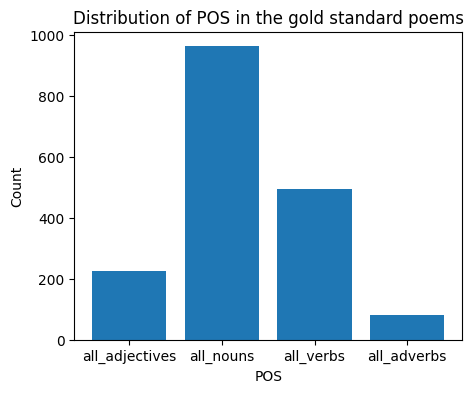

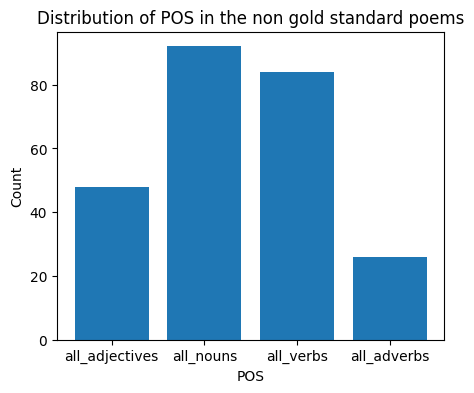

In [ ]:
import matplotlib.pyplot as plt

selected_row = df_pos.loc[['all_adjectives','all_nouns', 'all_verbs', 'all_adverbs']]
bar_values = [len(selected_row.loc['all_adjectives']['gold_pos']),
              len(selected_row.loc['all_nouns']['gold_pos']),
              len(selected_row.loc['all_verbs']['gold_pos']),
              len(selected_row.loc['all_adverbs']['gold_pos'])]
fig = plt.figure(figsize=(5, 4))
plt.bar(selected_row.index, bar_values)
plt.xlabel('POS')
plt.ylabel('Count')
plt.title('Distribution of POS in the gold standard poems')
plt.show()

import matplotlib.pyplot as plt

selected_row = df_pos_ng.loc[['all_adjectives','all_nouns', 'all_verbs', 'all_adverbs']]
bar_values = [len(selected_row.loc['all_adjectives']['non_gold_pos']),
              len(selected_row.loc['all_nouns']['non_gold_pos']),
              len(selected_row.loc['all_verbs']['non_gold_pos']),
              len(selected_row.loc['all_adverbs']['non_gold_pos'])]

fig = plt.figure(figsize=(5, 4))
plt.bar(selected_row.index, bar_values)
plt.xlabel('POS')
plt.ylabel('Count')
plt.title('Distribution of POS in the non gold standard poems')
plt.show()

**Distribution POS in individual gold standard poems**

In [ ]:
print(df_pos.index)

Index(['poem0_title', 'poem0', 'poem1_title', 'poem1', 'poem2_title', 'poem2',
       'poem3_title', 'poem3', 'poem4_title', 'poem4', 'poem5_title', 'poem5',
       'poem6_title', 'poem6', 'poem7_title', 'poem7', 'poem8_title', 'poem8',
       'poem9_title', 'poem9', 'poem10_title', 'poem10', 'poem11_title',
       'poem11', 'poems_array', 'pos_poem0', 'verbs_poem0', 'nouns_poem0',
       'adjectives_poem0', 'adverbs_poem0', 'pos_poem1', 'verbs_poem1',
       'nouns_poem1', 'adjectives_poem1', 'adverbs_poem1', 'pos_poem2',
       'verbs_poem2', 'nouns_poem2', 'adjectives_poem2', 'adverbs_poem2',
       'pos_poem3', 'verbs_poem3', 'nouns_poem3', 'adjectives_poem3',
       'adverbs_poem3', 'pos_poem4', 'verbs_poem4', 'nouns_poem4',
       'adjectives_poem4', 'adverbs_poem4', 'pos_poem5', 'verbs_poem5',
       'nouns_poem5', 'adjectives_poem5', 'adverbs_poem5', 'pos_poem6',
       'verbs_poem6', 'nouns_poem6', 'adjectives_poem6', 'adverbs_poem6',
       'pos_poem7', 'verbs_poem7', 'nouns_

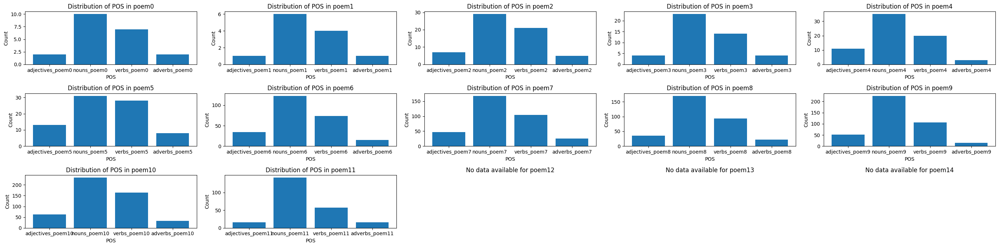

In [ ]:
import matplotlib.pyplot as plt

# Create a list of poem names
poem_names = ['poem' + str(i) for i in range(15)]  # Adjusted to the range that you have data for

# Create a 3x5 grid of subplots
fig, axs = plt.subplots(3, 5, figsize=(28, 7))
axs = axs.flatten()  # Flatten the array of axes for easier indexing

# Loop through each subplot and plot the bar graph for POS data
for i, ax in enumerate(axs):
    pos_types = ['adjectives', 'nouns', 'verbs', 'adverbs']
    indices = [pos + '_' + poem_names[i] for pos in pos_types if pos + '_' + poem_names[i] in df_pos.index]
    if indices:
        # Only proceed if indices are found
        bar_values = [len(df_pos.loc[index]['gold_pos']) if 'gold_pos' in df_pos.loc[index] and isinstance(df_pos.loc[index]['gold_pos'], list) else 0 for index in indices]
        ax.bar(indices, bar_values)
        ax.set_xlabel('POS')
        ax.set_ylabel('Count')
        ax.set_title(f'Distribution of POS in {poem_names[i]}')
    else:
        ax.set_title(f'No data available for {poem_names[i]}')
        ax.axis('off')  # Turn off axis if no data is available

# Adjust the spacing between subplots and show the plot
plt.tight_layout()
plt.show()


**Distribution POS in individual non gold standard poems**

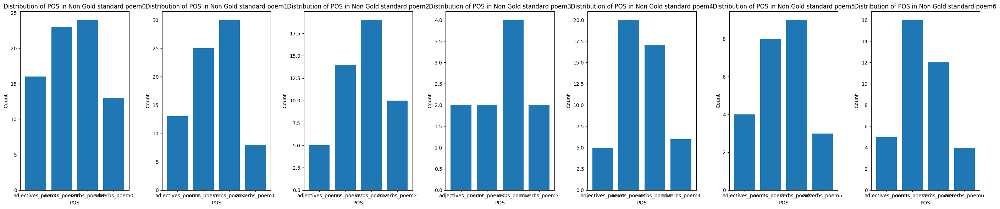

In [ ]:
# create a list of poem names

poem_names = ['poem0', 'poem1', 'poem2', 'poem3', 'poem4','poem5', 'poem6', 'poem7', 'poem8', 'poem9','poem10', 'poem11', 'poem12', 'poem13', 'poem14']

# create a 2x5 grid of subplots
fig, axs = plt.subplots(1, 7, figsize=(28, 6))

for i, ax in enumerate(axs):
    # get the selected row and bar values for the current poem for non-gold standard data
    selected_row = df_pos_ng.loc[['adjectives_' + poem_names[i], 'nouns_' + poem_names[i], 'verbs_' + poem_names[i], 'adverbs_' + poem_names[i]]]
    bar_values = [len(selected_row.loc['adjectives_' + poem_names[i]]['non_gold_pos']),
                  len(selected_row.loc['nouns_' + poem_names[i]]['non_gold_pos']),
                  len(selected_row.loc['verbs_' + poem_names[i]]['non_gold_pos']),
                  len(selected_row.loc['adverbs_' + poem_names[i]]['non_gold_pos'])]
    # plot the bar graph on the current subplot
    ax.bar(selected_row.index, bar_values)
    ax.set_xlabel('POS')
    ax.set_ylabel('Count')
    ax.set_title('Distribution of POS in Non Gold standard ' + poem_names[i])

# adjust the spacing between subplots and show the plot
plt.tight_layout()
plt.show()

**Results based on the above Analysis :**

1. In Gold standard poems, Nouns are the part of speech that are predominent in the poem

2. In Non-Gold standard poems, Verbs are the most significant parts of speech

**Distribution of each POS in every gold standard and non gold standard poems**

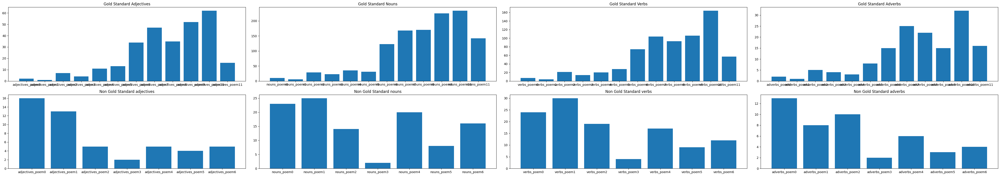

In [ ]:
import matplotlib.pyplot as plt

# Ensure df_pos has the correct indices, use try-except or conditional checks
fig = plt.figure(figsize=(45, 8))

# List of POS types and subplot titles for easier management
pos_types = ['adjectives', 'nouns', 'verbs', 'adverbs']
subplot_titles = ['Gold Standard Adjectives', 'Gold Standard Nouns', 'Gold Standard Verbs', 'Gold Standard Adverbs']
df_ng = df_pos_ng  # Assuming df_pos_ng is defined and structured similarly to df_pos

for i, pos_type in enumerate(pos_types):
    ax = fig.add_subplot(2, 4, i + 1)
    indices = [f'{pos_type}_poem{j}' for j in range(15) if f'{pos_type}_poem{j}' in df_pos.index]
    if indices:
        selected_row = df_pos.loc[indices]
        bar_values = [len(selected_row.loc[index]['gold_pos']) if 'gold_pos' in selected_row.loc[index] and isinstance(selected_row.loc[index]['gold_pos'], list) else 0 for index in indices]
        ax.bar(indices, bar_values)
        ax.set_title(subplot_titles[i])
    else:
        ax.set_title(f"No data for {pos_type}")
        ax.axis('off')  # Turn off axis if no data is available

# Assuming df_pos_ng structured similarly and holds non-gold standard data
for i, pos_type in enumerate(pos_types):
    ax = fig.add_subplot(2, 4, i + 5)
    indices = [f'{pos_type}_poem{j}' for j in range(7) if f'{pos_type}_poem{j}' in df_ng.index]  # Only for 0-6
    if indices:
        selected_row = df_ng.loc[indices]
        bar_values = [len(selected_row.loc[index]['non_gold_pos']) if 'non_gold_pos' in selected_row.loc[index] and isinstance(selected_row.loc[index]['non_gold_pos'], list) else 0 for index in indices]
        ax.bar(indices, bar_values)
        ax.set_title(f"Non Gold Standard {pos_type}")
    else:
        ax.set_title(f"No data for Non-Gold {pos_type}")
        ax.axis('off')  # Turn off axis if no data is available

plt.tight_layout()
plt.show()


# **Exploratory Data Analysis for Gold and Non-gold standard poems**

In [ ]:
df_gold_poems = pd.read_csv('/content/pushcart_poems.csv')

In [ ]:
df_non_gold_poems = pd.read_csv('/content/unpopular_poems.csv')

In [ ]:
df_gold_poems

,Poet,Title,Poem
0,Christopher Hunter,"LOUISA, AGE 6, AT REST",louisa alighting into place always dazzles me ...
1,Susan J Koch,SOFIA,cannot disremember three carefree boys draggin...
2,John Mitchell,NICHOLAS II,the ghost of the tsar walks he passes some jew...
3,Alise Palmer,BELTANE,boy green shouldered grows like corn endlessly...
4,Rose Postma,ON TELLING MY MOTHER I AM PREGNANT AGAIN,my mother who spent the day after my birth try...
5,Kat Lehmann,OCEAN ANCIENT AND EVOLVING,"\n\n \n \n—from Rattle #79, Spring 20..."
6,Bob Hicok,THIS AGAIN,The recommendation from some website quoted on...
7,Kari Despain,Planting Seeds in the Desert,At the table in front of my large sliding glas...
8,Brook McClurg,A Case is a Wave,"custody : A protective care, but often neither..."
9,Rachael Quisel,Departure,5It’s the first time I remember seeing my fath...


In [ ]:
df_non_gold_poems

,Title,Poem
0,Too Young To Die,please god do not take me yet am still young y...
1,Life Is Too Short,am hungry to the extent that cannot feel like ...
2,No Where To Run,am outcast no friends no family only strangers...
3,Who I Am?,am whatever you say am if was not would not sa...
4,Hopeless Life,wake up early in the morning not because its t...
5,My Life,have done things should not have done have gon...
6,Unemployment I Hate You,was at varsity in my comfort zone never knew t...


## **Document term matrix**

In [ ]:
# We are going to create a document-term matrix using CountVectorizer, and exclude common English stop words
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
data_cv = cv.fit_transform(df_gold_poems.Poem)
data_dtm = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_dtm.index = df_gold_poems.Title
data_dtm

data_dtm.to_pickle("dtm.pkl")
df_gold_poems.to_pickle('data_df.pkl')
pickle.dump(cv, open("cv.pkl", "wb"))

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
ng_data_cv = cv.fit_transform(df_non_gold_poems.Poem)
ng_data_dtm = pd.DataFrame(ng_data_cv.toarray(), columns=cv.get_feature_names_out())
ng_data_dtm.index = df_non_gold_poems.Title
ng_data_dtm
ng_data_dtm.to_pickle("ngdtm.pkl")
df_non_gold_poems.to_pickle('ng_data_df.pkl')
pickle.dump(cv, open("ng_cv.pkl", "wb"))

## **Visualizations**

In [ ]:
import pandas as pd

data = pd.read_pickle('dtm.pkl')
data = data.transpose()
data.head()

Title,"LOUISA, AGE 6, AT REST",SOFIA,NICHOLAS II,BELTANE,ON TELLING MY MOTHER I AM PREGNANT AGAIN,OCEAN ANCIENT AND EVOLVING,THIS AGAIN,Planting Seeds in the Desert,A Case is a Wave,Departure,Astronaut,Color Wheel
10my,0,0,0,0,0,0,0,0,0,1,0,0
12at,0,0,0,0,0,0,0,0,0,1,0,0
14the,0,0,0,0,0,0,0,0,0,1,0,0
15my,0,0,0,0,0,0,0,0,0,1,0,0
16when,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
import pandas as pd

data_ng = pd.read_pickle('ngdtm.pkl')
data_ng = data_ng.transpose()
data_ng.head()

Title,Too Young To Die,Life Is Too Short,No Where To Run,Who I Am?,Hopeless Life,My Life,Unemployment I Hate You
ago,0,0,1,0,0,0,0
alive,0,1,0,0,0,0,0
angry,1,0,0,0,0,0,0
apart,0,0,1,0,0,0,0
ashamed,0,0,0,0,0,0,1


In [ ]:
poems = list(data.columns)
poems

['LOUISA, AGE 6, AT REST',
 'SOFIA',
 'NICHOLAS II',
 'BELTANE',
 'ON TELLING MY MOTHER I AM PREGNANT AGAIN',
 'OCEAN ANCIENT AND EVOLVING',
 'THIS AGAIN',
 'Planting Seeds in the Desert',
 'A Case is a Wave',
 'Departure',
 'Astronaut',
 'Color Wheel\xa0']

In [ ]:
ng_poems = list(data_ng.columns)

In [ ]:
unique_list = []
for poem in data.columns:
    uniques = data[poem].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

data_words = pd.DataFrame(list(zip(poems, unique_list)), columns=['poem', 'unique_words'])
data_unique_sort = data_words.sort_values(by='unique_words')
data_unique_sort

,poem,unique_words
1,SOFIA,11
0,"LOUISA, AGE 6, AT REST",20
3,BELTANE,38
2,NICHOLAS II,57
5,OCEAN ANCIENT AND EVOLVING,58
4,ON TELLING MY MOTHER I AM PREGNANT AGAIN,62
11,Color Wheel,195
6,THIS AGAIN,196
8,A Case is a Wave,256
7,Planting Seeds in the Desert,287


In [ ]:
unique_list = []
for poem in data_ng.columns:
    uniques = data_ng[poem].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

ng_data_words = pd.DataFrame(list(zip(ng_poems, unique_list)), columns=['poem', 'unique_words'])
ng_data_unique_sort = ng_data_words.sort_values(by='unique_words')
ng_data_unique_sort

,poem,unique_words
3,Who I Am?,5
5,My Life,17
6,Unemployment I Hate You,28
2,No Where To Run,31
4,Hopeless Life,32
0,Too Young To Die,50
1,Life Is Too Short,60


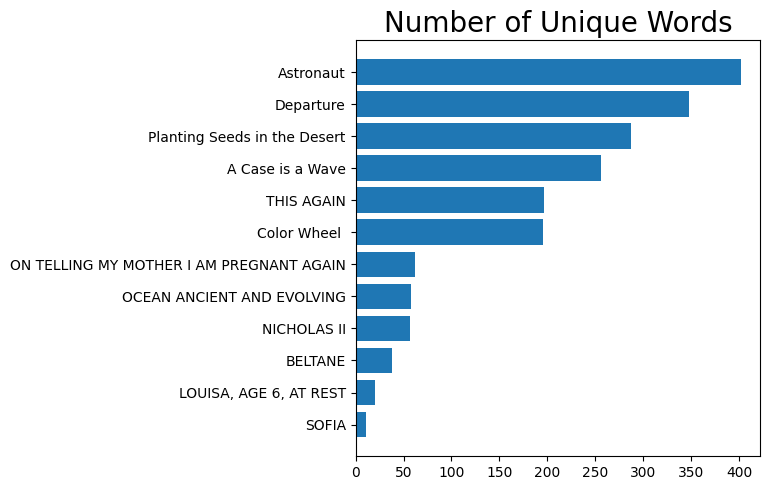

In [ ]:
# Let's plot our findings
import numpy as np

fig = plt.figure(figsize=(12, 5)) # create a figure with width 10 inches and height 5 inches

y_pos = np.arange(len(data_words))

plt.subplot(1, 2, 1)
plt.barh(y_pos, data_unique_sort.unique_words, align='center')
plt.yticks(y_pos, data_unique_sort.poem)
plt.title('Number of Unique Words', fontsize=20)

plt.tight_layout()
plt.show()

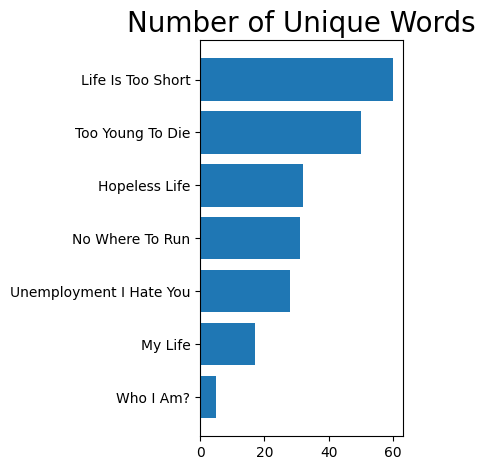

In [ ]:
# Let's plot our findings
import numpy as np

y_pos = np.arange(len(ng_data_words))

plt.subplot(1, 2, 1)
plt.barh(y_pos, ng_data_unique_sort.unique_words, align='center')
plt.yticks(y_pos, ng_data_unique_sort.poem)
plt.title('Number of Unique Words', fontsize=20)

plt.tight_layout()
plt.show()

In [ ]:
# Find the top 30 words by each poem
top_dict = {}
for c in poems:
    top = data[c].sort_values(ascending=False).head(30)
    top_dict[c]= list(zip(top.index, top.values))

In [ ]:
# Find the top 30 words by each poem
top_dict_ng = {}
for c in data_ng.columns:
    top = data_ng[c].sort_values(ascending=False).head(30)
    top_dict_ng[c]= list(zip(top.index, top.values))

In [ ]:
# Print the top 10 words in each poem
for poem, top_words in top_dict.items():
    print(poem)
    print(', '.join([word for word, count in top_words[0:10]]))
    print('---')

LOUISA, AGE 6, AT REST
dazzles, arms, sudden, smoothly, face, surpassing, grace, curtsey, alighting, turvy
---
SOFIA
bloodied, cub, nose, carefree, dragging, boys, macedonia, disremember, square, bear
---
NICHOLAS II
death, birth, deaf, watch, gone, good, moved, passes, ask, command
---
BELTANE
like, fills, green, curious, surrounding, episodes, color, shouldered, wants, home
---
ON TELLING MY MOTHER I AM PREGNANT AGAIN
like, pain, birth, tell, waiting, canadian, tip, letters, reveal, trying
---
OCEAN ANCIENT AND EVOLVING
write, haiku, explain, let, stays, single, grammatical, preposition, summer, really
---
THIS AGAIN
human, lost, hate, kind, don, jews, want, love, thing, know
---
Planting Seeds in the Desert
mother, review, carrots, tell, garden, handful, old, years, come, wake
---
A Case is a Wave
visitors, prisoner, inmate, brother, visitor, watch, prison, corrections, sister, like
---
Departure
father, says, don, hand, mother, white, like, writing, face, hands
---
Astronaut
home, 

In [ ]:
# Print the top 10 words in each poem
for poem, top_words in top_dict_ng.items():
    print(poem)
    print(', '.join([word for word, count in top_words[0:10]]))
    print('---')

Too Young To Die
disease, god, makes, doctors, day, cure, hope, know, life, young
---
Life Is Too Short
away, life, days, feel, everyday, streets, people, couple, stomach, stab
---
No Where To Run
home, family, touch, strangers, school, place, visit, new, old, mates
---
Who I Am?
just, say, special, guy, ordinary, mouth, moved, moving, nepositism, new
---
Hopeless Life
self, disgust, dew, stress, cold, clothes, hopeless, hospital, morning, time
---
My Life
gone, things, hell, brother, second, occasions, sister, loser, bad, deserve
---
Unemployment I Hate You
unemployment, dreams, hate, poverty, knew, know, corruption, cronyism, depression, disaster
---


In [ ]:
from collections import Counter

# Let's first pull out the top 30 words for each Poem
words = []
for poem in poems:
    top = [word for (word, count) in top_dict[poem]]
    for t in top:
        words.append(t)

In [ ]:
# Let's aggregate this list and identify the most common words along with how many routines they occur in
Counter(words).most_common()

[('like', 5),
 ('ask', 4),
 ('mother', 4),
 ('birth', 3),
 ('did', 3),
 ('home', 3),
 ('don', 3),
 ('review', 3),
 ('time', 3),
 ('father', 3),
 ('arms', 2),
 ('face', 2),
 ('place', 2),
 ('psychiatrist', 2),
 ('psychiatric', 2),
 ('protective', 2),
 ('promised', 2),
 ('promise', 2),
 ('pursedher', 2),
 ('watch', 2),
 ('moved', 2),
 ('jews', 2),
 ('color', 2),
 ('hands', 2),
 ('tell', 2),
 ('want', 2),
 ('ice', 2),
 ('parts', 2),
 ('just', 2),
 ('make', 2),
 ('come', 2),
 ('plants', 2),
 ('house', 2),
 ('door', 2),
 ('writing', 2),
 ('say', 2),
 ('dazzles', 1),
 ('sudden', 1),
 ('smoothly', 1),
 ('surpassing', 1),
 ('grace', 1),
 ('curtsey', 1),
 ('alighting', 1),
 ('turvy', 1),
 ('topsy', 1),
 ('twists', 1),
 ('interlace', 1),
 ('inverted', 1),
 ('knees', 1),
 ('flees', 1),
 ('gets', 1),
 ('folds', 1),
 ('louisa', 1),
 ('radishes', 1),
 ('raiders', 1),
 ('rains', 1),
 ('radio', 1),
 ('rake', 1),
 ('bloodied', 1),
 ('cub', 1),
 ('nose', 1),
 ('carefree', 1),
 ('dragging', 1),
 ('boys',

In [ ]:
# If more than half of the poems have it as a top word, exclude it from the list
add_stop_words = [word for word, count in Counter(words).most_common() if count > 6]
add_stop_words

[]

In [ ]:
# Let's update our document-term matrix with the new list of stop words
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Read in cleaned data
data_clean = pd.read_pickle('data_df.pkl')

In [ ]:
# Let's update our document-term matrix with the new list of stop words
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Read in cleaned data
data_clean_ng = pd.read_pickle('ng_data_df.pkl')

In [ ]:
# Add new stop words
#stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate document-term matrix
cv = CountVectorizer(stop_words=add_stop_words)

In [ ]:
data_cv = cv.fit_transform(data_clean.Poem)

In [ ]:
data_stop = pd.DataFrame(data_cv.toarray(), columns=cv.get_feature_names_out())
data_stop.index = data_clean.index

# Pickle it for later use
import pickle
pickle.dump(cv, open("cv_stop.pkl", "wb"))
data_stop.to_pickle("dtm_stop.pkl")

In [ ]:
# Let's make some word clouds!
# Terminal / Anaconda Prompt: conda install -c conda-forge wordcloud
from wordcloud import WordCloud

wc = WordCloud(stopwords=None, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

In [ ]:
dc = data_clean[['Title','Poem']]

In [ ]:
# Create a sample dataframe
dc = dc.reset_index(drop=True)

# Print the resulting dataframe
print(dc)

# Set the 'Title' column as the new index
dc = dc.set_index('Title')

# Print the resulting dataframe
print(dc)


                                       Title  \
0                     LOUISA, AGE 6, AT REST   
1                                      SOFIA   
2                                NICHOLAS II   
3                                    BELTANE   
4   ON TELLING MY MOTHER I AM PREGNANT AGAIN   
5                 OCEAN ANCIENT AND EVOLVING   
6                                 THIS AGAIN   
7               Planting Seeds in the Desert   
8                           A Case is a Wave   
9                                  Departure   
10                                 Astronaut   
11                              Color Wheel    

                                                 Poem  
0   louisa alighting into place always dazzles me ...  
1   cannot disremember three carefree boys draggin...  
2   the ghost of the tsar walks he passes some jew...  
3   boy green shouldered grows like corn endlessly...  
4   my mother who spent the day after my birth try...  
5   \n\n       \n    \n—from Rattle #79

## **Word cloud to represent most popular terms in each gold-standard poem**

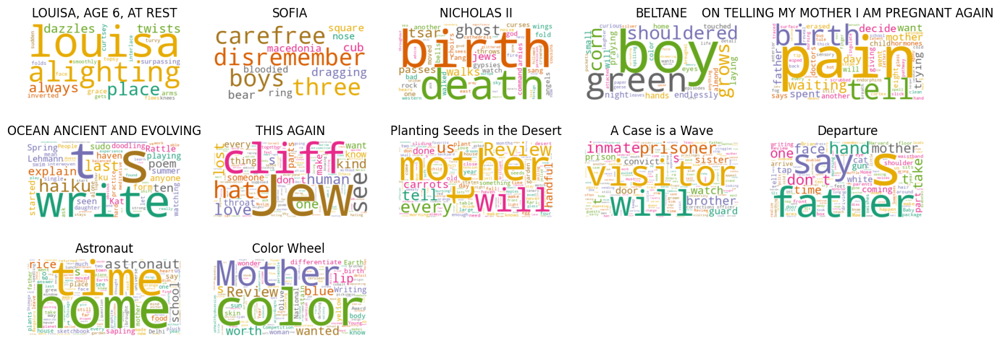

In [ ]:
# Reset the output dimensions
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [16, 6]

#poems = ['OIL SPILL','THE BURNING OF THE WHALES','THE BUFFALO','FEVER','LISTENING TO DVORAK\'S HUMORESQUE', 'SOPRANO FROM THE JUNIOR \nCHOIR AT THE PROTEST', 'THE FATES', 'I TELL MY SON TO COVER \n HIMSELF IN SOMEONE ELSE', 'A QUESTION OF TIME', 'NINETY-NINE']
# Create subplots for each comedian
for index, poem in enumerate(poems):
    wc.generate(dc.Poem[poem])

    plt.subplot(3, 5, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(poems[index])

plt.show()

## **Word cloud to represent most popular terms in each non-gold standard poem**

                     Title                                               Poem
0         Too Young To Die  please god do not take me yet am still young y...
1        Life Is Too Short  am hungry to the extent that cannot feel like ...
2          No Where To Run  am outcast no friends no family only strangers...
3                Who I Am?  am whatever you say am if was not would not sa...
4            Hopeless Life  wake up early in the morning not because its t...
5                  My Life  have done things should not have done have gon...
6  Unemployment I Hate You  was at varsity in my comfort zone never knew t...
                                                                      Poem
Title                                                                     
Too Young To Die         please god do not take me yet am still young y...
Life Is Too Short        am hungry to the extent that cannot feel like ...
No Where To Run          am outcast no friends no family only strangers...
W

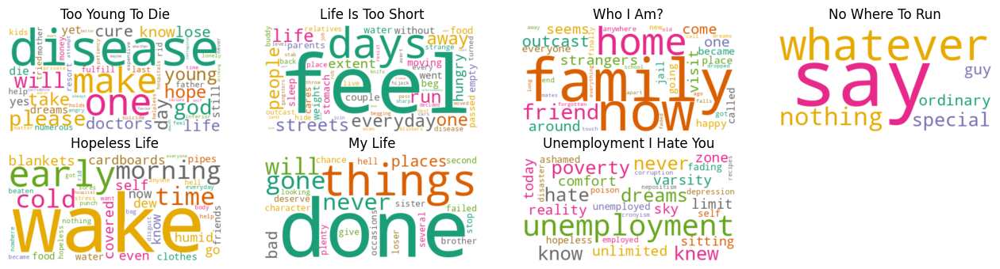

In [ ]:
# Reset the output dimensions
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Add new stop words
#stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate document-term matrix
cv_ng = CountVectorizer(stop_words=add_stop_words)

data_cv_ng = cv.fit_transform(data_clean_ng.Poem)

data_stop_ng = pd.DataFrame(data_cv_ng.toarray(), columns=cv.get_feature_names_out())
data_stop_ng.index = data_clean_ng.index

# Pickle it for later use
import pickle
pickle.dump(cv_ng, open("cv_stop_ng.pkl", "wb"))
data_stop_ng.to_pickle("dtm_stop_ng.pkl")

wc_ng = WordCloud(stopwords=None, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42)

dc_ng = data_clean_ng[['Title','Poem']]

# Create a sample dataframe
dc_ng = dc_ng.reset_index(drop=True)

# Print the resulting dataframe
print(dc_ng)

# Set the 'Title' column as the new index
dc_ng = dc_ng.set_index('Title')

# Print the resulting dataframe
print(dc_ng)


plt.rcParams['figure.figsize'] = [16, 6]

poems_ng = ['Too Young To Die', 'Life Is Too Short', 'Who I Am?', 'No Where To Run', 'Hopeless Life', 'My Life', 'Unemployment I Hate You']

# Create subplots for each comedian
for index, poem in enumerate(data_ng.columns):
    wc.generate(dc_ng.Poem[poem])

    plt.subplot(3, 4, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(poems_ng[index])

plt.show()

## **Topic Analysis for the gold standard poems**


Topic Modelling Gold standard Poem

In [ ]:
import pandas as pd
import pickle

data = pd.read_pickle('dtm.pkl')
data

,10my,12at,14the,15my,16when,18bruce,2016,2022,2023,517,...,yelling,yellow,yield,young,younger,youth,zest,zoomed,zucchini,zusak
Title,,,,,,,,,,,,,,,,,,,,,
"LOUISA, AGE 6, AT REST",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SOFIA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
NICHOLAS II,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BELTANE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ON TELLING MY MOTHER I AM PREGNANT AGAIN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
OCEAN ANCIENT AND EVOLVING,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
THIS AGAIN,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
Planting Seeds in the Desert,0,0,0,0,0,0,1,1,0,0,...,1,0,1,0,0,0,0,0,1,0
A Case is a Wave,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from gensim import matutils, models
import scipy.sparse
from nltk import word_tokenize, pos_tag

In [ ]:
tdm = data.transpose()
tdm.head()

Title,"LOUISA, AGE 6, AT REST",SOFIA,NICHOLAS II,BELTANE,ON TELLING MY MOTHER I AM PREGNANT AGAIN,OCEAN ANCIENT AND EVOLVING,THIS AGAIN,Planting Seeds in the Desert,A Case is a Wave,Departure,Astronaut,Color Wheel
10my,0,0,0,0,0,0,0,0,0,1,0,0
12at,0,0,0,0,0,0,0,0,0,1,0,0
14the,0,0,0,0,0,0,0,0,0,1,0,0
15my,0,0,0,0,0,0,0,0,0,1,0,0
16when,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
def nouns_adj(text):
    '''Given a string of text, tokenize the text and pull out only the nouns and adjectives.'''
    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'
    tokenized = word_tokenize(text)
    nouns_adj = [word for (word, pos) in pos_tag(tokenized) if is_noun_adj(pos)]
    return ' '.join(nouns_adj)

In [ ]:
data_nouns_adj = pd.DataFrame(dc.Poem.apply(nouns_adj))
data_nouns_adj

,Poem
Title,
"LOUISA, AGE 6, AT REST",louisa place grace inverted curtsey arms topsy...
SOFIA,carefree boys bear cub macedonia square nose
NICHOLAS II,ghost tsar jews gypsies rock bad angels wings ...
BELTANE,boy green grows corn night hands small eyes co...
ON TELLING MY MOTHER I AM PREGNANT AGAIN,mother day birth father child more doctors pai...
OCEAN ANCIENT AND EVOLVING,—from Rattle Spring __________ Kat Lehmann “ ’...
THIS AGAIN,recommendation website news throats female Jew...
Planting Seeds in the Desert,table front large glass door soft canary light...
A Case is a Wave,custody protective care ] visitors visitors ot...


In [ ]:
# Create a new document-term matrix using only nouns and adjectives, also remove common words with max_df
cvna = CountVectorizer(stop_words=None, max_df=.8)
data_cvna = cvna.fit_transform(data_nouns_adj.Poem)
data_dtmna = pd.DataFrame(data_cvna.toarray(), columns=cvna.get_feature_names_out())
data_dtmna.index = data_nouns_adj.index
data_dtmna

,70,__________,ability,able,accordingto,acres,adult,adults,advice,affection,...,years,yell,yelling,young,younger,yourselves,youth,zest,zucchini,zusak
Title,,,,,,,,,,,,,,,,,,,,,
"LOUISA, AGE 6, AT REST",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SOFIA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
NICHOLAS II,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
BELTANE,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ON TELLING MY MOTHER I AM PREGNANT AGAIN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
OCEAN ANCIENT AND EVOLVING,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
THIS AGAIN,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Planting Seeds in the Desert,1,0,0,0,0,0,1,0,0,1,...,2,1,1,0,0,0,0,0,1,0
A Case is a Wave,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
# Create the gensim corpus
corpusna = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmna.transpose()))

# Create the vocabulary dictionary
id2wordna = dict((v, k) for k, v in cvna.vocabulary_.items())

In [ ]:
# # Let's try 4 topics
ldana = models.LdaModel(corpus=corpusna, num_topics=4, id2word=id2wordna, passes=35)
ldana.print_topics()

[(0,
  '0.019*"home" + 0.014*"time" + 0.013*"astronaut" + 0.009*"school" + 0.009*"food" + 0.009*"rice" + 0.007*"place" + 0.007*"mother" + 0.007*"sapling" + 0.006*"father"'),
 (1,
  '0.011*"father" + 0.008*"mother" + 0.006*"review" + 0.005*"writing" + 0.005*"parts" + 0.005*"kind" + 0.005*"jews" + 0.005*"human" + 0.004*"hand" + 0.004*"color"'),
 (2,
  '0.016*"visitors" + 0.014*"prisoner" + 0.013*"inmate" + 0.010*"brother" + 0.010*"visitor" + 0.006*"prison" + 0.006*"corrections" + 0.006*"sister" + 0.006*"father" + 0.005*"birth"'),
 (3,
  '0.013*"mother" + 0.012*"review" + 0.008*"carrots" + 0.006*"old" + 0.006*"garden" + 0.006*"handful" + 0.004*"morning" + 0.004*"egg" + 0.004*"years" + 0.004*"something"')]

[(0, '0.011*"home" + 0.009*"time" + 0.008*"astronaut" + 0.008*"mother" + 0.007*"school" + 0.006*"food" + 0.006*"rice" + 0.006*"color" + 0.005*"place" + 0.005*"review"'), (1, '0.010*"time" + 0.008*"years" + 0.008*"father" + 0.006*"life" + 0.006*"nine" + 0.006*"last" + 0.006*"ninety" + 0.005*"home" + 0.004*"dog" + 0.004*"someone"'), (2, '0.008*"world" + 0.004*"bright" + 0.004*"wings" + 0.004*"feels" + 0.004*"skin" + 0.004*"fire" + 0.002*"drop" + 0.002*"smoke" + 0.002*"wick" + 0.002*"flames"'), (3, '0.009*"visitors" + 0.008*"review" + 0.008*"mother" + 0.008*"prisoner" + 0.007*"inmate" + 0.006*"brother" + 0.006*"visitor" + 0.006*"forgive" + 0.004*"door" + 0.004*"sister"')]

 **Topics**

Topic 0 : Home and daily life

Topic 1 : Family and relationships

Topic 2 : Nature

Topic 3 : Prison and forgiveness

In [ ]:
# Let's take a look at which topics each transcript contains
corpus_transformed = ldana[corpusna]
#list(zip([a for [(a,b)] in corpus_transformed], data_dtmna.index))
list(corpus_transformed)

[[(0, 0.019828126), (1, 0.019583235), (2, 0.019248804), (3, 0.9413398)],
 [(0, 0.031285115), (1, 0.031465087), (2, 0.9059544), (3, 0.031295348)],
 [(1, 0.98065954)],
 [(0, 0.9728985)],
 [(2, 0.9846916)],
 [(2, 0.9819791)],
 [(1, 0.99573857)],
 [(3, 0.9969188)],
 [(2, 0.9972717)],
 [(1, 0.9975575)],
 [(0, 0.998116)],
 [(1, 0.9957185)]]

In [ ]:
max_probs = []
for doc_topics, doc_id in zip(corpus_transformed, data_dtmna.index):
    max_prob = max(doc_topics, key=lambda x: x[1])
    topic_id = max_prob[0]
    max_probs.append([doc_id, topic_id])

In [ ]:
max_probs

[['LOUISA, AGE 6, AT REST', 3],
 ['SOFIA', 2],
 ['NICHOLAS II', 1],
 ['BELTANE', 0],
 ['ON TELLING MY MOTHER I AM PREGNANT AGAIN', 2],
 ['OCEAN ANCIENT AND EVOLVING', 2],
 ['THIS AGAIN', 1],
 ['Planting Seeds in the Desert', 3],
 ['A Case is a Wave', 2],
 ['Departure', 1],
 ['Astronaut', 0],
 ['Color Wheel\xa0', 1]]

In [ ]:
topic_map = {0 : 'Home and daily life',  1 : 'Family and relationships', 2 : 'Nature',   3 : 'Prison and forgiveness'}

In [ ]:
gold_corpus = corpusna

In [ ]:
topic_words = [['Home', 'Daily life'], ['Family', 'relationships'], ['Nature'], ['Prison', 'forgiveness']]

In [ ]:
import pandas as pd

# Assuming you have a DataFrame named df
poems = dc['Poem'].tolist()

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import heapq
from nltk.util import ngrams
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 3: Preprocess the poems
nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

preprocessed_poems = []
for poem in poems:
    tokens = word_tokenize(poem.lower())  # Tokenize and convert to lowercase
    filtered_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]  # Remove stopwords and non-alphabetic tokens
    preprocessed_poems.append(" ".join(filtered_tokens))

#print("preprocessed poems", preprocessed_poems)

# Step 4: Calculate word embeddings using TF-IDF
vectorizer = TfidfVectorizer()
poem_embeddings = vectorizer.fit_transform(preprocessed_poems)

#print(vectorizer.vocabulary_)

# Step 5: Calculate the centroid for each set of topic words
topic_centroids = {}
for topic_index, words in enumerate(topic_words):
    word_indices = [vectorizer.vocabulary_.get(word) for word in words]
    word_indices = [index for index in word_indices if index is not None]  # Remove None values

    topic_vectors = poem_embeddings[:, word_indices]
    if topic_vectors.shape[1] == 0:
        continue  # Skip if there are no matching words in the vocabulary

    topic_centroid = topic_vectors.mean(axis=1)
    topic_centroids[f'topic{topic_index+1}'] = topic_centroid

    # Calculate similarity between all words and the topic centroid
    similarity_scores = cosine_similarity(topic_vectors, topic_centroid.reshape(1, -1))
    top_indices = heapq.nlargest(3, range(len(similarity_scores[0])), similarity_scores[0].take)

    top_words = [words[index] for index in top_indices]
    print(f"Topic {topic_index+1}: Top 3 closest words - {top_words}")

    print("Centroids:", topic_centroids)



# Step 6: Calculate similarity between each bigram/trigram and topic centroids
def calculate_similarity(text, centroid):
    text_embedding = vectorizer.transform([text])
    similarity = cosine_similarity(text_embedding, centroid)
    return similarity[0][0]

# Step 7: Sort and select top candidates
num_candidates = 3  # Number of top candidates to select
top_candidates = {}
for poem in preprocessed_poems:
    ngram_candidates = set()
    tokens = word_tokenize(poem)
    bigrams = list(ngrams(tokens, 2))
    trigrams = list(ngrams(tokens, 3))
    ngram_candidates.update([" ".join(bigram) for bigram in bigrams])
    ngram_candidates.update([" ".join(trigram) for trigram in trigrams])

    for candidate in ngram_candidates:
        similarity_scores = []
        for topic, centroid in topic_centroids.items():
            similarity = calculate_similarity(candidate, centroid)
            similarity_scores.append(similarity)
        if similarity_scores:
            top_candidates[candidate] = max(similarity_scores)

sorted_candidates = sorted(top_candidates.items(), key=lambda x: x[1], reverse=True)
selected_candidates = sorted_candidates[:num_candidates]

print(sorted_candidates)
print(selected_candidates)

# Step 8: Print the selected candidates and their similarities
for candidate, similarity in selected_candidates:
    print("Candidate:", candidate)
    print("Similarity:", similarity)
    print()


[]
[]


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
poems = [['LOUISA, AGE 6, AT REST', 0],
 ['SOFIA', 3],
 ['NICHOLAS II', 3],
 ['BELTANE', 0],
 ['ON TELLING MY MOTHER I AM PREGNANT AGAIN', 0],
 ['OCEAN ANCIENT AND EVOLVING', 1],
 ['THIS AGAIN', 1],
 ['Planting Seeds in the Desert', 2],
 ['A Case is a Wave', 3],
 ['Departure', 3],
 ['Astronaut', 0],
 ['Color Wheel\xa0', 1]]

In [ ]:
for poem in poems:
    poem_name = poem[0]
    topic_number = poem[1]
    topic_name = topic_map[topic_number]
    print(poem_name, ' - ', topic_name)

LOUISA, AGE 6, AT REST  -  Home and daily life
SOFIA  -  Prison and forgiveness
NICHOLAS II  -  Prison and forgiveness
BELTANE  -  Home and daily life
ON TELLING MY MOTHER I AM PREGNANT AGAIN  -  Home and daily life
OCEAN ANCIENT AND EVOLVING  -  Family and relationships
THIS AGAIN  -  Family and relationships
Planting Seeds in the Desert  -  Nature
A Case is a Wave  -  Prison and forgiveness
Departure  -  Prison and forgiveness
Astronaut  -  Home and daily life
Color Wheel   -  Family and relationships


In [ ]:
def read_poems_from_csv(filename):
    df = pd.read_csv(filename)
    poems = df['Poem'].tolist()
    return poems

df_gsp = read_poems_from_csv('/content/pushcart_poems.csv')
df_ngsp = read_poems_from_csv('/content/unpopular_poems.csv')


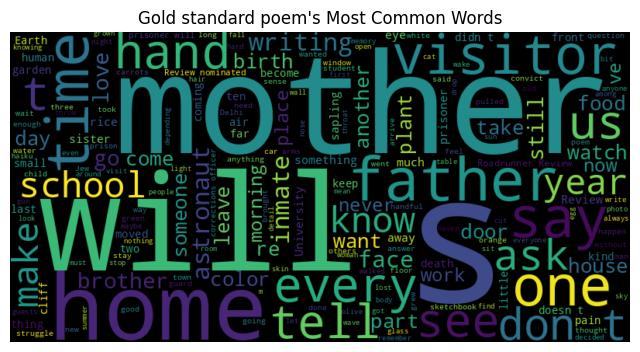

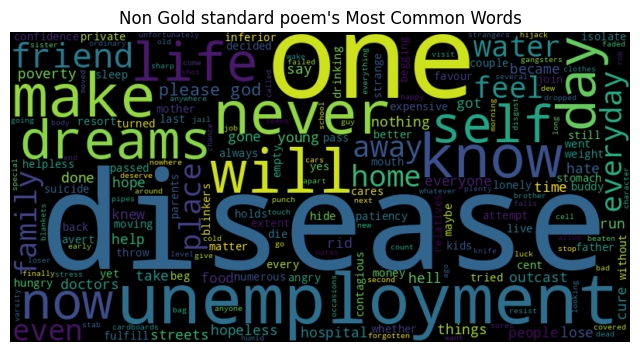

In [ ]:
from wordcloud import WordCloud

def create_wordcloud(texts, title):
    all_words = ' '.join(texts)
    wordcloud = WordCloud(width=800, height=400).generate(all_words)

    plt.figure(figsize=(8, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

create_wordcloud(df_gsp, "Gold standard poem's Most Common Words")
create_wordcloud(df_ngsp, "Non Gold standard poem's Most Common Words")

In [ ]:
# Load gold standard dataframe and non-standard dataframe
gold_standard_df = pd.read_csv("/content/pushcart_poems.csv")
non_standard_df = pd.read_csv("/content/unpopular_poems.csv")

In [ ]:
# Add a column 'Pushcart' with value 'Yes' for gold standard poems
gold_standard_df = gold_standard_df.assign(Pushcart='Yes')

# Add a column 'Pushcart' with value 'No' for non-gold standard poems
non_standard_df = non_standard_df.assign(Pushcart='No')

#**2.write a function or class that assesses the probability that the  poem will be a pushcart winner, given a random poem, and a poem you generated use the ratios to define a baseline , compared to the average (gold std) of the pushcart winners, bucketize the groups :**
**objective 1:** given a random poem, tell us the prob that this would be selected as pushcart nominee or winner.


# **Find the probability of a poem being nominated for Pushcart and bucketize the groups**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

class PushcartClassifier:
    def __init__(self):
        self.vectorizer = TfidfVectorizer()
        self.model = LogisticRegression()

    def train(self, pushcart_df, non_pushcart_df):
        # Combine the datasets
        df = pd.concat([pushcart_df, non_pushcart_df], ignore_index=True)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(
            df['Poem'], df['Pushcart'], test_size=0.2, random_state=42
        )

        # Vectorize the text data
        X_train_vec = self.vectorizer.fit_transform(X_train)
        X_test_vec = self.vectorizer.transform(X_test)

        # Train the model
        self.model.fit(X_train_vec, y_train)

        # Evaluate the model on the testing set
        y_pred = self.model.predict(X_test_vec)
        print(classification_report(y_test, y_pred))

    def predict(self, poem):
        # Vectorize the input poem
        poem_vec = self.vectorizer.transform([poem])

        # Predict the probability of being a Pushcart winner
        probability = self.model.predict_proba(poem_vec)[:, 1]
        return probability

# Example usage
pushcart_df = gold_standard_df  # DataFrame of Pushcart nominated poems
non_pushcart_df = non_standard_df  # DataFrame of non-Pushcart nominated poems

classifier = PushcartClassifier()
classifier.train(pushcart_df, non_pushcart_df)

random_poem = "Where the mind is without fear and the head is held high Where knowledge is free Where the world has not been broken up into fragments By narrow domestic walls Where words come out from the depth of truth Where tireless striving stretches its arms towards perfection Where the clear stream of reason has not lost its way Into the dreary desert sand of dead habit Where the mind is led forward by thee Into ever-widening thought and action Into that heaven of freedom, my Father, let my country awake"
probability = classifier.predict(random_poem)
print(f"Probability of being a Pushcart winner: {probability}")


              precision    recall  f1-score   support

          No       0.00      0.00      0.00         0
         Yes       1.00      0.75      0.86         4

    accuracy                           0.75         4
   macro avg       0.50      0.38      0.43         4
weighted avg       1.00      0.75      0.86         4

Probability of being a Pushcart winner: [0.56903936]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension

Give a list of poems as input, find the probability of the poem being nominated for pushcart, and assign it to a bucket based on the baseline ratio

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

class PushcartClassifier:
    def __init__(self):
        self.vectorizer = TfidfVectorizer()
        self.model = LogisticRegression()

    def train(self, pushcart_df, non_pushcart_df):
        # Combine the datasets
        df = pd.concat([pushcart_df, non_pushcart_df], ignore_index=True)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(
            df['Poem'], df['Pushcart'], test_size=0.2, random_state=42
        )

        # Vectorize the text data
        X_train_vec = self.vectorizer.fit_transform(X_train)
        X_test_vec = self.vectorizer.transform(X_test)

        # Train the model
        self.model.fit(X_train_vec, y_train)

        # Evaluate the model on the testing set
        y_pred = self.model.predict(X_test_vec)
        print(classification_report(y_test, y_pred))

    def predict(self, poems):
        # Vectorize the input poems
        poems_vec = self.vectorizer.transform(poems)

        # Predict the probabilities of being a Pushcart winner
        probabilities = self.model.predict_proba(poems_vec)[:, 1]

        # Classify the poems into buckets based on probabilities
        buckets = np.where(probabilities < 0.3, "Low",
                           np.where(probabilities < 0.7, "Medium", "High"))

        return buckets, probabilities

# Example usage
pushcart_df = gold_standard_df  # DataFrame of Pushcart nominated poems
non_pushcart_df = non_standard_df  # DataFrame of non-Pushcart nominated poems

classifier = PushcartClassifier()
classifier.train(pushcart_df, non_pushcart_df)

poems = ['Where the mind is without fear and the head is held high Where knowledge is free Where the world has not been broken up into fragments By narrow domestic walls Where words come out from the depth of truth Where tireless striving stretches its arms towards perfection Where the clear stream of reason has not lost its way Into the dreary desert sand of dead habit Where the mind is led forward by thee Into ever-widening thought and action Into that heaven of freedom, my Father, let my country awake', 'No man is an island,Entire of itself, Every man is a piece of the continent, A part of the main. If a clod be washed away by the sea, Europe is the less. As well as if a promontory were. As well as if a manor of thy friend\’s Or of thine own were: Any man\’s death diminishes me, Because I am involved in mankind, And therefore never send to know for whom the bell tolls; It tolls for thee.', 'Whose woods these are I think I know. His house is in the village though; He will not see me stopping here To watch his woods fill up with snow. My little horse must think it queer To stop without a farmhouse near Between the woods and frozen lake The darkest evening of the year. He gives his harness bells a shake To ask if there is some mistake. The only other sound\’s the sweep Of easy wind and downy flake. The woods are lovely, dark and deep, But I have promises to keep, And miles to go before I sleep, And miles to go before I sleep', 'In nature\'s embrace, I find solace and peace, Where worries dissolve, and anxieties cease. The sun paints the sky with hues so divine, As clouds gracefully drift, like dreams in line. The trees stand tall, guardians of the earth, Their branches reaching out, a symbol of rebirth. Flowers bloom, a symphony of colors rare, A fragrant dance, perfuming the air. Rivers flow, their waters pure and free, Reflecting the beauty that surrounds me. Nature\'s wonders, a sight to behold, A story of creation, forever untold.']

buckets, probabilities = classifier.predict(poems)

for poem, bucket, probability in zip(poems, buckets, probabilities):
    print(f"Poem: {poem}")
    print(f"Bucket: {bucket}")
    print(f"Probability of being a Pushcart winner: {probability}")
    print()


              precision    recall  f1-score   support

          No       0.00      0.00      0.00         0
         Yes       1.00      0.75      0.86         4

    accuracy                           0.75         4
   macro avg       0.50      0.38      0.43         4
weighted avg       1.00      0.75      0.86         4

Poem: Where the mind is without fear and the head is held high Where knowledge is free Where the world has not been broken up into fragments By narrow domestic walls Where words come out from the depth of truth Where tireless striving stretches its arms towards perfection Where the clear stream of reason has not lost its way Into the dreary desert sand of dead habit Where the mind is led forward by thee Into ever-widening thought and action Into that heaven of freedom, my Father, let my country awake
Bucket: Medium
Probability of being a Pushcart winner: 0.5690393645191575

Poem: No man is an island,Entire of itself, Every man is a piece of the continent, A part of

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension

In [ ]:
df = gold_standard_df

# **3. plot ratios of the nlp stats and them try to the figure what is the golden cluster (how can use words that are closer to the centroid of the golden cluster, higher coherence relative to the golden cluster's centroid)**

# **Plot the ratios of the NLP stats**

In [ ]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

# Function to calculate word count
def count_words(poem):
    words = word_tokenize(poem)
    return len(words)

# Function to calculate sentence count
def count_sentences(poem):
    sentences = sent_tokenize(poem)
    return len(sentences)

# Calculate word count and sentence count for each poem
df['word_count'] = df['Poem'].apply(count_words)
df['sentence_count'] = df['Poem'].apply(count_sentences)


/tmp/ipykernel_17570/757393981.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(labels1, rotation='vertical')
/tmp/ipykernel_17570/757393981.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(labels2, rotation='vertical')


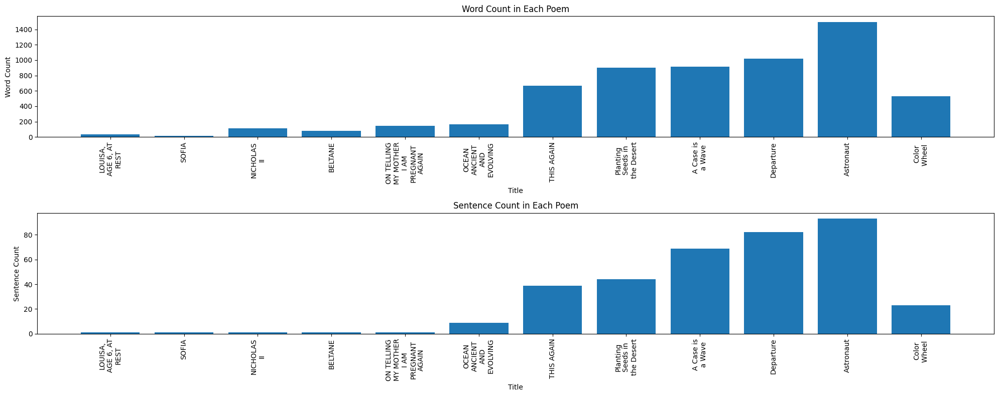

In [ ]:
import matplotlib.pyplot as plt
import textwrap

# Create subplots for word count and sentence count
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8))

# Bar chart for word count
ax1.bar(df.Title, df['word_count'])
ax1.set_xlabel('Title')
ax1.set_ylabel('Word Count')
ax1.set_title('Word Count in Each Poem')

# Bar chart for sentence count
ax2.bar(df.Title, df['sentence_count'])
ax2.set_xlabel('Title')
ax2.set_ylabel('Sentence Count')
ax2.set_title('Sentence Count in Each Poem')

# Wrap x-axis labels for the first chart
labels1 = [textwrap.fill(label, 10) for label in df['Title']]
ax1.set_xticklabels(labels1, rotation='vertical')

# Wrap x-axis labels for the second chart
labels2 = [textwrap.fill(label, 10) for label in df['Title']]
ax2.set_xticklabels(labels2, rotation='vertical')

# Adjust layout and display the charts
plt.tight_layout()
plt.show()


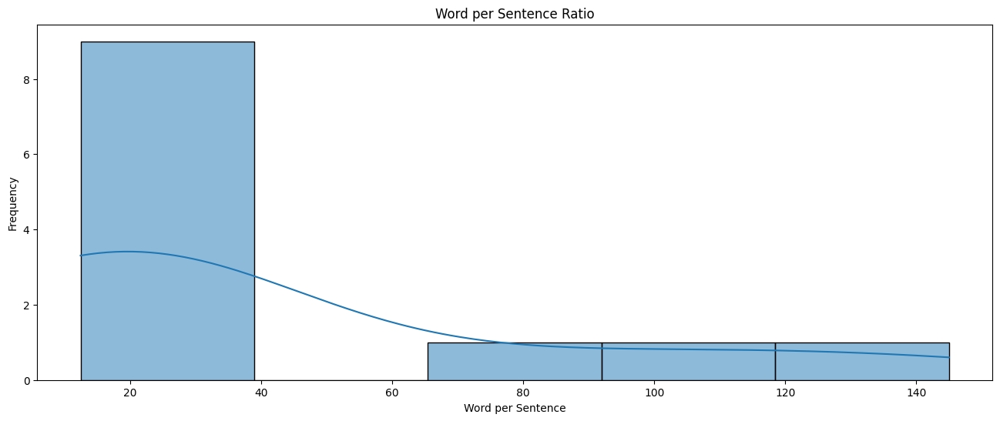

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate ratios
df['word_per_sentence'] = df['word_count'] / df['sentence_count']

# Plot the ratios
sns.histplot(data=df, x='word_per_sentence', kde=True)
plt.title('Word per Sentence Ratio')
plt.xlabel('Word per Sentence')
plt.ylabel('Frequency')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_distances

#Normalize the NLP stats
scaler = StandardScaler()
nlp_stats = df[['word_count', 'sentence_count']].values
nlp_stats_normalized = scaler.fit_transform(nlp_stats)

#Perform clustering
k = 5  # Number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(nlp_stats_normalized)

#Assign each poem to its cluster
df['cluster'] = clusters

#Calculate the centroid for each cluster
centroids = kmeans.cluster_centers_

#Measure coherence relative to the "golden cluster" centroid
golden_cluster_idx = np.argmax(np.sum(centroids, axis=1))  # Assuming highest sum indicates "golden cluster"
golden_cluster_centroid = centroids[golden_cluster_idx]
poems_in_golden_cluster = df[df['cluster'] == golden_cluster_idx]['Poem']  # Poems in the "golden cluster"

#Calculate cosine distances between each poem and the golden cluster centroid
distances = cosine_distances(nlp_stats_normalized, golden_cluster_centroid.reshape(1, -1))

# Get the coherence scores for each poem relative to the golden cluster centroid
coherence_scores = 1 - distances

#analyze the coherence scores and take actions based on the relative proximity of words to the golden cluster centroid.
# Higher coherence indicates closer similarity to the golden cluster centroid.

# Plotting the ratios of NLP stats
# ...

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7af8d0954ee0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mod

In [ ]:
df

,Poet,Title,Poem,Pushcart,word_count,sentence_count,word_per_sentence,cluster
0,Christopher Hunter,"LOUISA, AGE 6, AT REST",louisa alighting into place always dazzles me ...,Yes,37,1,37.000000,1
1,Susan J Koch,SOFIA,cannot disremember three carefree boys draggin...,Yes,17,1,17.000000,1
2,John Mitchell,NICHOLAS II,the ghost of the tsar walks he passes some jew...,Yes,112,1,112.000000,1
3,Alise Palmer,BELTANE,boy green shouldered grows like corn endlessly...,Yes,82,1,82.000000,1
4,Rose Postma,ON TELLING MY MOTHER I AM PREGNANT AGAIN,my mother who spent the day after my birth try...,Yes,145,1,145.000000,1
5,Kat Lehmann,OCEAN ANCIENT AND EVOLVING,"\n\n \n \n—from Rattle #79, Spring 20...",Yes,164,9,18.222222,1
6,Bob Hicok,THIS AGAIN,The recommendation from some website quoted on...,Yes,665,39,17.051282,0
7,Kari Despain,Planting Seeds in the Desert,At the table in front of my large sliding glas...,Yes,904,44,20.545455,0
8,Brook McClurg,A Case is a Wave,"custody : A protective care, but often neither...",Yes,916,69,13.275362,3
9,Rachael Quisel,Departure,5It’s the first time I remember seeing my fath...,Yes,1019,82,12.426829,3


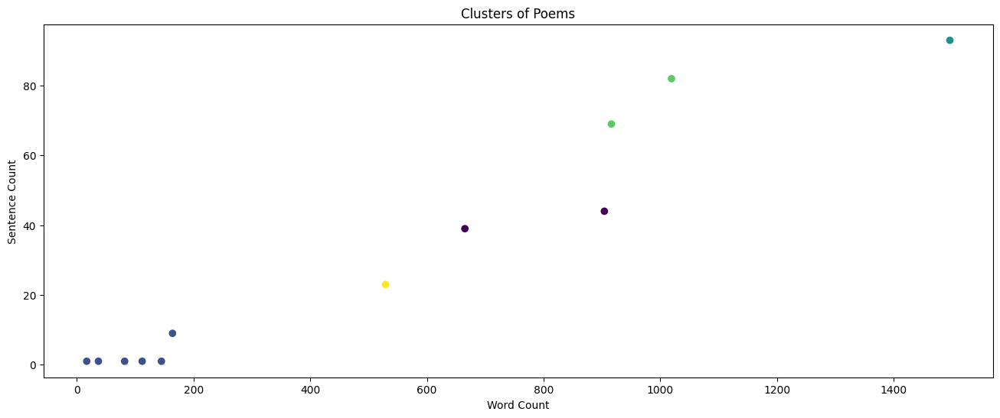

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have a dataframe `df` with 'Poem' column containing the poems and 'cluster' column containing the assigned cluster labels

# Plot the clusters
plt.scatter(df['word_count'], df['sentence_count'], c=df['cluster'])
plt.xlabel('Word Count')
plt.ylabel('Sentence Count')
plt.title('Clusters of Poems')
plt.show()

In [ ]:
topic_words = ['Home', 'Life', 'Family', 'relationship', 'Nature', 'Prison', 'forgiveness']

In [ ]:
topic_words

['Home', 'Life', 'Family', 'relationship', 'Nature', 'Prison', 'forgiveness']

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

topics = topic_words

topics = df['Poem'].tolist()

vectorizer = CountVectorizer()
vectorizer.fit(topics)

vocabulary = vectorizer.get_feature_names_out()

print(vocabulary)

['10my' '12at' '14the' ... 'zoomed' 'zucchini' 'zusak']


In [ ]:
import re

def clean_vocab_array(vocab_array):
    cleaned_array = []
    for word in vocab_array:
        # Use regular expression to match only words (no numbers)
        if re.match("^[a-zA-Z]+$", word):
            cleaned_array.append(word)
    return cleaned_array


In [ ]:
vocabulary = clean_vocab_array(vocabulary)

In [ ]:
vocabulary

['ability',
 'able',
 'about',
 'accept',
 'accepted',
 'accordingto',
 'acres',
 'across',
 'adapted',
 'address',
 'admit',
 'adult',
 'adults',
 'advice',
 'advise',
 'affection',
 'afford',
 'afraid',
 'after',
 'again',
 'against',
 'agony',
 'air',
 'airport',
 'aisle',
 'alcohol',
 'alighting',
 'all',
 'almond',
 'alone',
 'also',
 'always',
 'am',
 'ama',
 'america',
 'among',
 'amtrak',
 'an',
 'ancestral',
 'and',
 'angels',
 'animals',
 'another',
 'answer',
 'answers',
 'anterior',
 'anticipation',
 'antisemitism',
 'anymore',
 'anyone',
 'anything',
 'anywhere',
 'appeal',
 'appeals',
 'appeared',
 'apple',
 'apron',
 'aquamarineare',
 'are',
 'argued',
 'armies',
 'arms',
 'army',
 'around',
 'arrive',
 'arrives',
 'as',
 'ashamed',
 'asimov',
 'ask',
 'asked',
 'asks',
 'asphalt',
 'associate',
 'astronaut',
 'astronomical',
 'at',
 'attached',
 'attack',
 'attention',
 'attitude',
 'authors',
 'autumn',
 'autumnwhen',
 'awaited',
 'awaiting',
 'award',
 'awards',
 'awa

# **Identify and visualize the relationship between the POS - entities, relationships, Construct bigrams, trigrams, Knowledge graphs**

In [ ]:
'''
Compute n-grams frequency with nltk tokenizer.
:parameter
    :param txt: text
    :param ngrams: int or list - 1 for unigrams, 2 for bigrams, [1,2] for both
    :param top: num - plot the top frequent words
:return
    dtf_count: dtf with word frequency
'''

def word_freq(txt, ngrams=[1,2,3], top=10, figsize=(10,7)):
    lst_tokens = nltk.tokenize.word_tokenize(txt)
    ngrams = [ngrams] if type(ngrams) is int else ngrams

    ## calculate
    dtf_freq = pd.DataFrame()
    for n in ngrams:
        dic_words_freq = nltk.FreqDist(nltk.ngrams(lst_tokens, n))
        dtf_n = pd.DataFrame(dic_words_freq.most_common(), columns=["word","freq"])
        dtf_n["ngrams"] = n
        dtf_freq = pd.concat([dtf_freq, dtf_n], ignore_index=True)
    dtf_freq["word"] = dtf_freq["word"].apply(lambda x: " ".join(string for string in x) )
    dtf_freq = dtf_freq.sort_values(["ngrams","freq"], ascending=[True,False])

    ## plot
    fig, ax = plt.subplots(figsize=figsize)
    sns.barplot(x="freq", y="word", hue="ngrams", dodge=False, ax=ax,
                data=dtf_freq.groupby('ngrams')[["ngrams","freq","word"]].head(top))
    ax.set(xlabel=None, ylabel=None, title="Most frequent words")
    ax.grid(axis="x")
    plt.show()
    return dtf_freq


In [ ]:
txt = str(gold_standard_df['Poem'].values)

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1281: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(aggregator, agg_var)


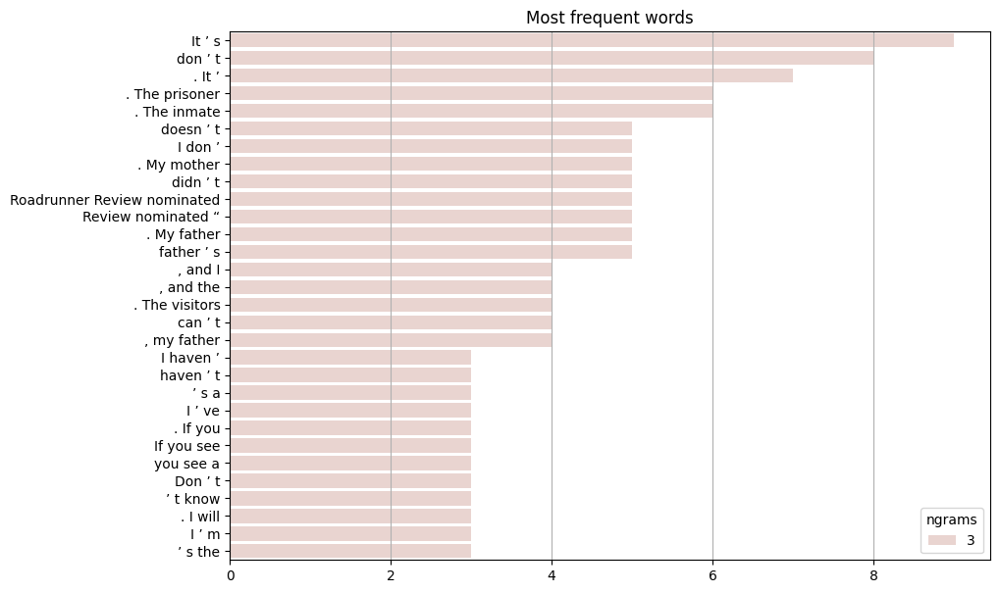

In [ ]:
# Find most common words in text
_ = word_freq(txt, ngrams=[3], top=30, figsize=(10,7))

In [ ]:
nlp = spacy.load("en_core_web_sm")
doc = nlp(txt)

In [ ]:
lst_docs = [sent for sent in doc.sents]
print("tot sentences:", len(lst_docs))

i = 0
lst_docs[i]

tot sentences: 319


['louisa alighting into place always dazzles me she twists with surpassing grace into an inverted curtsey her arms smoothly interlace as she gets all topsy turvy until in sudden about face she folds her knees and flees'
 'cannot disremember three carefree boys dragging bear cub through macedonia square ring through its bloodied nose'
 'the ghost of the tsar walks he passes some jews and gypsies one curses him another throws rock bad angels fold their wings and watch choirs sang at his birth armies moved at his command god rang the bells when he walked into cathedrals but now he hears the noise from out the east and sees the fire in the western sky death crowned him at his birth his cousins glittered throughout europe he seldom followed good advice and did not ask permission he lost navy in foreign sea and an army gone at tannenberg but still he played the emperor magnificence is blind and deaf and death took all his dynasty'
 'boy green shouldered grows like corn endlessly and over nig

In [ ]:
print(lst_docs[i], "\n---")

for token in lst_docs[i]:
    print(token.text, "-->", "pos: "+token.pos_, "|", "dep: "+token.dep_, "")

['louisa alighting into place always dazzles me she twists with surpassing grace into an inverted curtsey her arms smoothly interlace as she gets all topsy turvy until in sudden about face she folds her knees and flees'
 'cannot disremember three carefree boys dragging bear cub through macedonia square ring through its bloodied nose'
 'the ghost of the tsar walks he passes some jews and gypsies one curses him another throws rock bad angels fold their wings and watch choirs sang at his birth armies moved at his command god rang the bells when he walked into cathedrals but now he hears the noise from out the east and sees the fire in the western sky death crowned him at his birth his cousins glittered throughout europe he seldom followed good advice and did not ask permission he lost navy in foreign sea and an army gone at tannenberg but still he played the emperor magnificence is blind and deaf and death took all his dynasty'
 'boy green shouldered grows like corn endlessly and over nig

In [ ]:
displacy.render(lst_docs[i], style="dep", options={"distance":100})

In [ ]:
for tag in lst_docs[i].ents:
    print(tag.text, f"({tag.label_})")

three (CARDINAL)
macedonia (GPE)
jews (NORP)
one (CARDINAL)
europe (LOC)
geese (NORP)
the day (DATE)
eight (CARDINAL)
canadian (NORP)
\n (PRODUCT)
Rattle #79 (ORG)
Lehmann (PERSON)


In [ ]:
displacy.render(lst_docs[i], style="ent")

In [ ]:
## Using POS/DEP
def extract_entities(doc):
    a, b, prev_dep, prev_txt, prefix, modifier = "", "", "", "", "", ""
    for token in doc:
        if token.dep_ != "punct":
            ## prexif --> prev_compound + compound
            if token.dep_ == "compound":
                prefix = prev_txt +" "+ token.text if prev_dep == "compound" else token.text

            ## modifier --> prev_compound + %mod
            if token.dep_.endswith("mod") == True:
                modifier = prev_txt +" "+ token.text if prev_dep == "compound" else token.text

            ## subject --> modifier + prefix + %subj
            if token.dep_.find("subj") == True:
                a = modifier +" "+ prefix + " "+ token.text
                prefix, modifier, prev_dep, prev_txt = "", "", "", ""

            ## if object --> modifier + prefix + %obj
            if token.dep_.find("obj") == True:
                b = modifier +" "+ prefix +" "+ token.text

            prev_dep, prev_txt = token.dep_, token.text

    # clean
    a = " ".join([i for i in a.split()])
    b = " ".join([i for i in b.split()])
    return (a.strip(), b.strip())

In [ ]:
lst_entities = [extract_entities(i) for i in lst_docs]
lst_entities[i]

('anyone', 'else ku')

In [ ]:
## Using Matcher
def extract_relation(doc, nlp):
    matcher = spacy.matcher.Matcher(nlp.vocab)
    p1 = [{'DEP':'ROOT'},
          {'DEP':'prep', 'OP':"?"},
          {'DEP':'agent', 'OP':"?"},
          {'POS':'ADJ', 'OP':"?"}]
    matcher.add(key="matching_1", patterns=[p1])
    matches = matcher(doc)
    k = len(matches) - 1
    span = doc[matches[k][1]:matches[k][2]]
    return span.text

In [ ]:
lst_relations = [extract_relation(i,nlp) for i in lst_docs]
lst_relations[i]

'dazzles'

In [ ]:
## Using NER
lst_attr = []
for x in lst_docs:
    attr = ""
    for tag in x.ents:
        attr = attr+tag.text if tag.label_=="DATE" else attr+""
    lst_attr.append(attr)

lst_attr[i]

'the day'

In [ ]:
dtf = pd.DataFrame({"text":[doc.text for doc in lst_docs],
                    "entity":[i[0] for i in lst_entities],
                    "relation":lst_relations,
                    "object":[i[1] for i in lst_entities],
                    "attribute":lst_attr
                   })
dtf.head(3)

,text,entity,relation,object,attribute
0,['louisa alighting into place always dazzles m...,anyone,dazzles,else ku,the day
1,I started playing with the form last summer wh...,I,started,swim practice,last summer
2,"People ask me how I do it, but it’s hard to ex...",it,ask,it,


In [ ]:
!pip install textacy

In [ ]:
import textacy

In [ ]:
dic = {"id":[], "text":[], "entity":[], "relation":[], "object":[]}

for n,sentence in enumerate(lst_docs):
    lst_generators = list(textacy.extract.subject_verb_object_triples(sentence))
    for sent in lst_generators:
        subj = "_".join(map(str, sent.subject))
        obj  = "_".join(map(str, sent.object))
        relation = "_".join(map(str, sent.verb))
        dic["id"].append(n)
        dic["text"].append(sentence.text)
        dic["entity"].append(subj)
        dic["object"].append(obj)
        dic["relation"].append(relation)

dtf = pd.DataFrame(dic)
dtf[dtf["id"]==i]

,id,text,entity,relation,object
0,0,['louisa alighting into place always dazzles m...,louisa,dazzles,me
1,0,['louisa alighting into place always dazzles m...,she,gets,turvy
2,0,['louisa alighting into place always dazzles m...,she,folds,knees_flees
3,0,['louisa alighting into place always dazzles m...,louisa,'_can_not_disremember,boys
4,0,['louisa alighting into place always dazzles m...,he,passes,jews
5,0,['louisa alighting into place always dazzles m...,one,curses,him
6,0,['louisa alighting into place always dazzles m...,angels,fold,wings
7,0,['louisa alighting into place always dazzles m...,god,rang,bells
8,0,['louisa alighting into place always dazzles m...,he,hears,noise
9,0,['louisa alighting into place always dazzles m...,louisa,sees,fire


In [ ]:
dtf = dtf[dtf["object"].str.len() < 20]

In [ ]:
## Date
attribute = "date"
dic = {"id":[], "text":[], attribute:[]}

for n,sentence in enumerate(lst_docs):
    lst = list(textacy.extract.entities(sentence, include_types={"DATE"}))
    if len(lst) > 0:
        for attr in lst:
            dic["id"].append(n)
            dic["text"].append(sentence.text)
            dic[attribute].append(str(attr))
    else:
        dic["id"].append(n)
        dic["text"].append(sentence.text)
        dic[attribute].append(np.nan)

dtf_att = pd.DataFrame(dic)
dtf_att = dtf_att[~dtf_att[attribute].isna()]
dtf_att[dtf_att["id"]==i]

,id,text,date
0,0,['louisa alighting into place always dazzles m...,day


In [ ]:
## Location
attribute = "location"
dic = {"id":[], "text":[], attribute:[]}

for n,sentence in enumerate(lst_docs):
    lst = list(textacy.extract.entities(sentence, include_types={"LOC","GPE"}))
    if len(lst) > 0:
        for attr in lst:
            dic["id"].append(n)
            dic["text"].append(sentence.text)
            dic[attribute].append(str(attr))
    else:
        dic["id"].append(n)
        dic["text"].append(sentence.text)
        dic[attribute].append(np.nan)

dtf_att_2 = pd.DataFrame(dic)
dtf_att_2 = dtf_att_2[~dtf_att_2[attribute].isna()]

dtf_att_2[dtf_att_2["id"]==i]

,id,text,location
0,0,['louisa alighting into place always dazzles m...,macedonia
1,0,['louisa alighting into place always dazzles m...,europe


In [ ]:
import networkx as nx

In [ ]:
## full
G = nx.from_pandas_edgelist(dtf, source="entity", target="object", edge_attr="relation", create_using=nx.DiGraph())

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


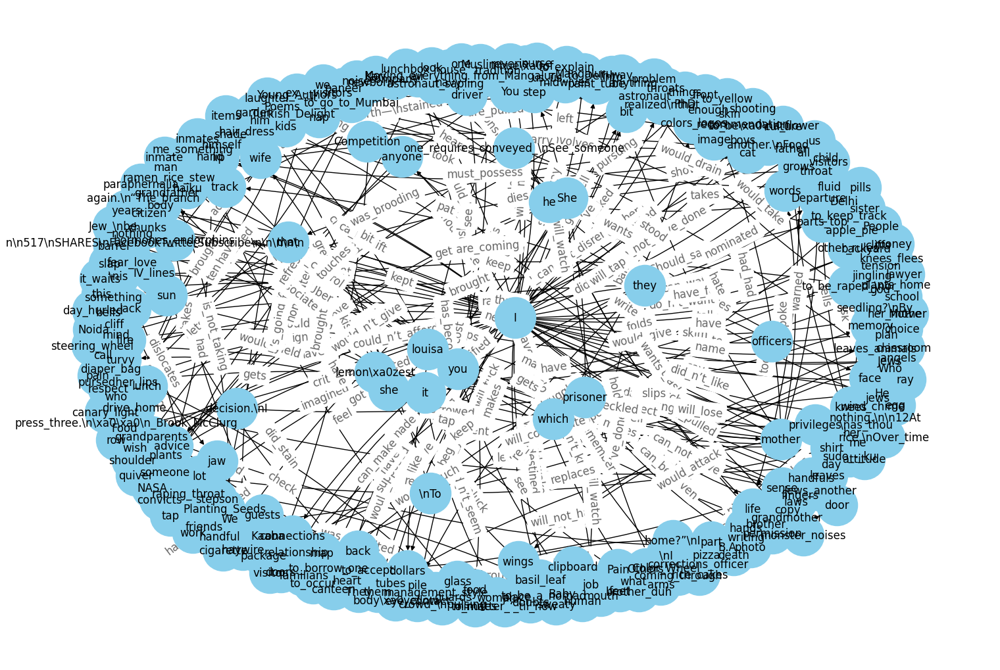

In [ ]:
plt.figure(figsize=(15,10))

#pos = nx.nx_agraph.graphviz_layout(G, prog="fdp")
pos = nx.spring_layout(G, k=1)

node_color = "skyblue"
edge_color = "black"

nx.draw(G, pos=pos, with_labels=True, node_color=node_color, edge_color=edge_color, cmap=plt.cm.Dark2,
        node_size=2000, connectionstyle='arc3,rad=0.1')

nx.draw_networkx_edge_labels(G, pos=pos, label_pos=0.5, edge_labels=nx.get_edge_attributes(G,'relation'),
                             font_size=12, font_color='black', alpha=0.6)
plt.show()

In [ ]:
## top
dtf["entity"].value_counts().head()

entity
I         65
you       14
mother    11
she       10
he         9
Name: count, dtype: int64

In [ ]:
## filter
f = "I"
tmp = dtf[(dtf["entity"]==f) | (dtf["object"]==f)]

G = nx.from_pandas_edgelist(tmp, source="entity", target="object", edge_attr="relation", create_using=nx.DiGraph())

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:304: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)


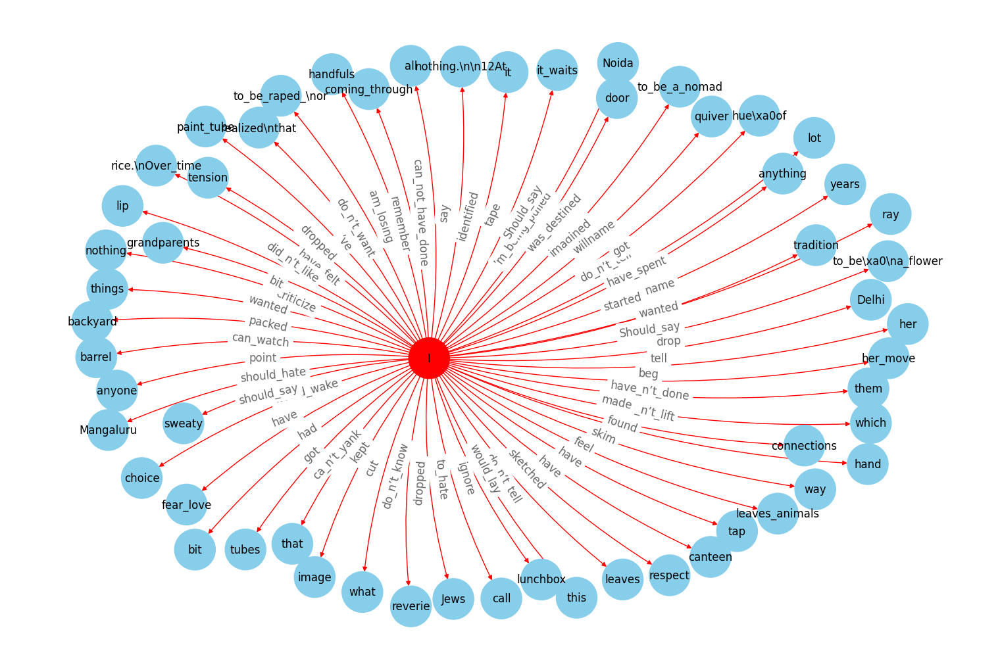

In [ ]:
plt.figure(figsize=(15,10))

#pos = nx.nx_agraph.graphviz_layout(G, prog="neato")
pos = nx.spring_layout(G, k=2.5)

node_color = ["red" if node==f else "skyblue" for node in G.nodes]
edge_color = ["red" if edge[0]==f else "black" for edge in G.edges]

nx.draw(G, pos=pos, with_labels=True, node_color=node_color, edge_color=edge_color, cmap=plt.cm.Dark2,
        node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1')

nx.draw_networkx_edge_labels(G, pos=pos, label_pos=0.5, edge_labels=nx.get_edge_attributes(G,'relation'),
                             font_size=12, font_color='black', alpha=0.6)
plt.show()

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:304: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)


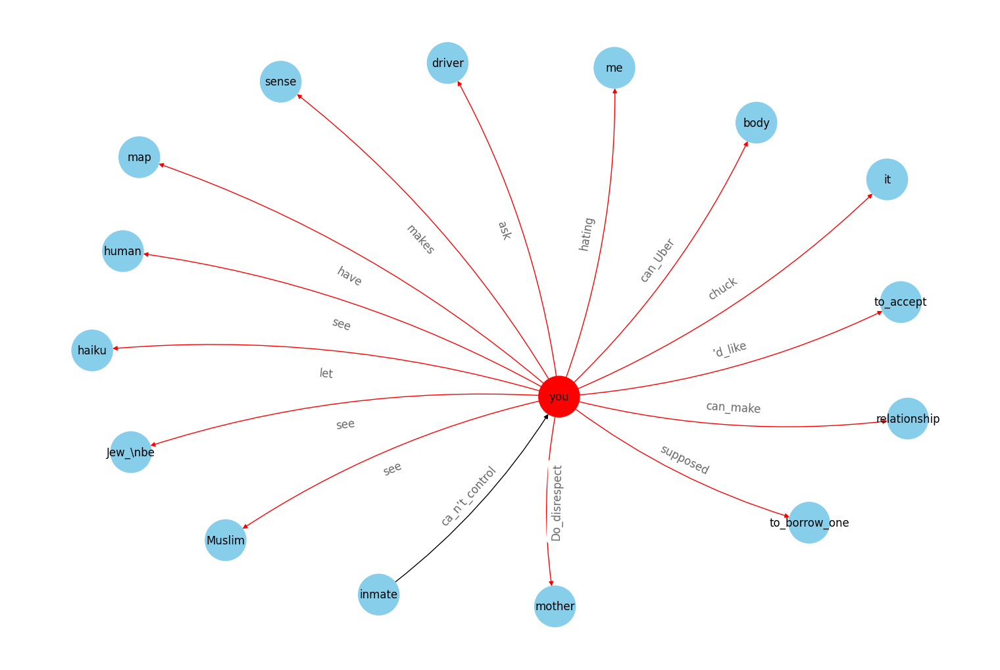

In [ ]:
## filter
f = "you"
tmp = dtf[(dtf["entity"]==f) | (dtf["object"]==f)]

G = nx.from_pandas_edgelist(tmp, source="entity", target="object", edge_attr="relation", create_using=nx.DiGraph())

plt.figure(figsize=(15,10))

#pos = nx.nx_agraph.graphviz_layout(G, prog="neato")
pos = nx.spring_layout(G, k=2.5)

node_color = ["red" if node==f else "skyblue" for node in G.nodes]
edge_color = ["red" if edge[0]==f else "black" for edge in G.edges]

nx.draw(G, pos=pos, with_labels=True, node_color=node_color, edge_color=edge_color, cmap=plt.cm.Dark2,
        node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1')

nx.draw_networkx_edge_labels(G, pos=pos, label_pos=0.5, edge_labels=nx.get_edge_attributes(G,'relation'),
                             font_size=12, font_color='black', alpha=0.6)
plt.show()

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:304: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)


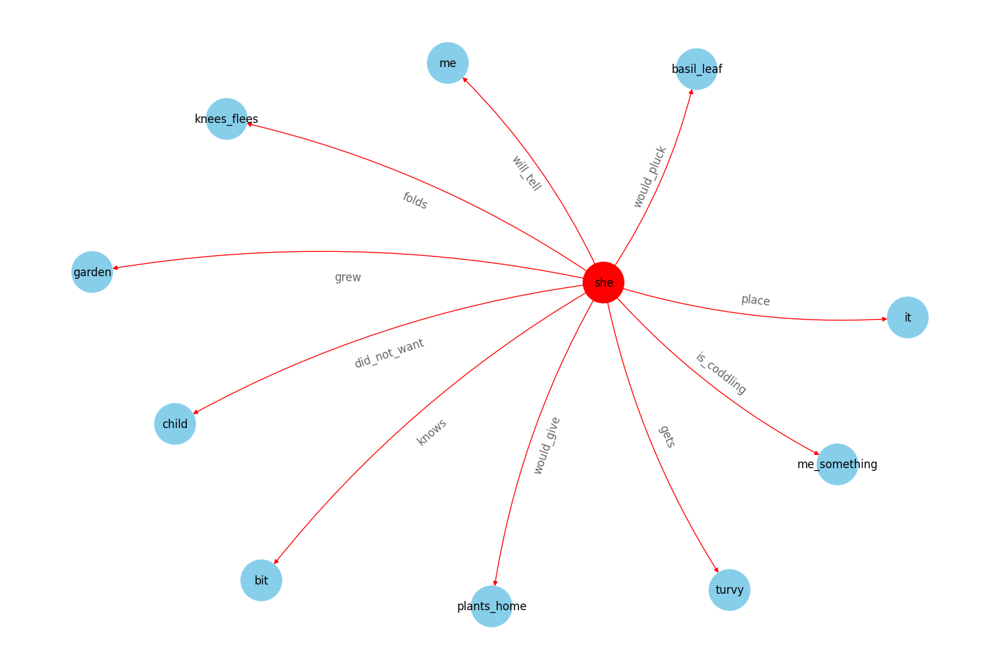

In [ ]:
## filter
f = "she"
tmp = dtf[(dtf["entity"]==f) | (dtf["object"]==f)]

G = nx.from_pandas_edgelist(tmp, source="entity", target="object", edge_attr="relation", create_using=nx.DiGraph())

plt.figure(figsize=(15,10))

#pos = nx.nx_agraph.graphviz_layout(G, prog="neato")
pos = nx.spring_layout(G, k=2.5)

node_color = ["red" if node==f else "skyblue" for node in G.nodes]
edge_color = ["red" if edge[0]==f else "black" for edge in G.edges]

nx.draw(G, pos=pos, with_labels=True, node_color=node_color, edge_color=edge_color, cmap=plt.cm.Dark2,
        node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1')

nx.draw_networkx_edge_labels(G, pos=pos, label_pos=0.5, edge_labels=nx.get_edge_attributes(G,'relation'),
                             font_size=12, font_color='black', alpha=0.6)
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Define the topic-word distribution
topic_word_dist = [
    '0.039*"home" + 0.039*"family" + 0.027*"everyone" + 0.015*"nothing" + 0.015*"hell" + 0.015*"only" + 0.015*"school" + 0.015*"friend" + 0.015*"end" + 0.015*"happy"',
    '0.116*"disease" + 0.025*"one" + 0.025*"life" + 0.025*"doctors" + 0.025*"god" + 0.025*"day" + 0.025*"young" + 0.014*"self" + 0.014*"water" + 0.014*"rid"',
    '0.094*"unemployment" + 0.029*"dreams" + 0.029*"things" + 0.029*"poverty" + 0.029*"hate" + 0.016*"hopeless" + 0.016*"character" + 0.016*"several" + 0.016*"brother" + 0.016*"plenty"',
    '0.028*"days" + 0.028*"people" + 0.028*"streets" + 0.028*"life" + 0.016*"self" + 0.016*"place" + 0.016*"everyday" + 0.016*"food" + 0.016*"water" + 0.016*"weight"'
]

# Extract the words from the topic-word distribution
vectorizer = CountVectorizer()
docs = [topic.split(' + ') for topic in topic_word_dist]
corpus = [' '.join(doc.split('*')[1].replace('"', '') for doc in doc_list) for doc_list in docs]
X = vectorizer.fit_transform(corpus).toarray()

# Calculate the centroid
centroid = np.mean(X, axis=0)

# Calculate cosine similarity between bigrams/trigrams and the centroid
distances = cosine_similarity(X, centroid.reshape(1, -1))

# Sort the distances in descending order and retrieve the last 3 indices
closest_indices = np.argsort(distances, axis=0)[-3:].flatten()

# Retrieve the closest bigrams/trigrams
feature_names = list(vectorizer.vocabulary_.keys())
closest_bigrams_trigrams = [feature_names[index] for index in closest_indices]

print(closest_bigrams_trigrams)


['everyone', 'family', 'nothing']


/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


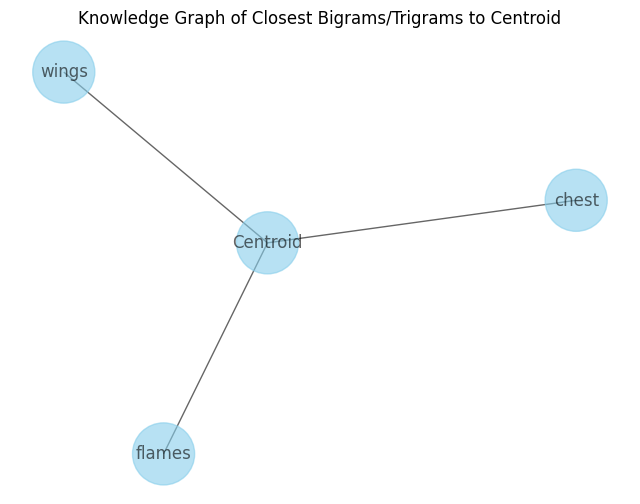

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Define the topic-word distribution
topic_word_dist = [
    '0.030*"fire" + 0.017*"wings" + 0.017*"chest" + 0.017*"flames" + 0.017*"trembling" + 0.017*"day" + 0.017*"water" + 0.017*"whales" + 0.017*"wick" + 0.017*"candle"',
    '0.008*"wings" + 0.008*"drop" + 0.008*"world" + 0.008*"sweet" + 0.008*"notes" + 0.008*"bright" + 0.008*"strains" + 0.008*"breast" + 0.008*"last" + 0.008*"red"',
    '0.050*"world" + 0.026*"bright" + 0.026*"feels" + 0.026*"skin" + 0.015*"sludge" + 0.015*"slick" + 0.015*"rainbows" + 0.015*"acceptance" + 0.015*"effort" + 0.015*"feathers"',
    '0.039*"notes" + 0.027*"sweet" + 0.015*"drop" + 0.015*"reverie" + 0.015*"clear" + 0.015*"gentle" + 0.015*"delight" + 0.015*"feet" + 0.015*"chords" + 0.015*"weaves"'
]

# Extract the words from the topic-word distribution
vectorizer = CountVectorizer()
docs = [topic.split(' + ') for topic in topic_word_dist]
corpus = [' '.join(doc.split('*')[1].replace('"', '') for doc in doc_list) for doc_list in docs]
X = vectorizer.fit_transform(corpus).toarray()

# Calculate the centroid
centroid = np.mean(X, axis=0)

# Calculate cosine similarity between bigrams/trigrams and the centroid
distances = cosine_similarity(X, centroid.reshape(1, -1))

# Sort the distances in descending order and retrieve the last 3 indices
closest_indices = np.argsort(distances, axis=0)[-3:].flatten()

# Retrieve the closest bigrams/trigrams
feature_names = list(vectorizer.vocabulary_.keys())
closest_bigrams_trigrams = [feature_names[index] for index in closest_indices]

# Create a knowledge graph using NetworkX
G = nx.Graph()
G.add_node("Centroid", color='blue')  # Centroid node

# Add closest bigrams/trigrams as nodes and connect them to the centroid
for bigram_trigram in closest_bigrams_trigrams:
    G.add_node(bigram_trigram, color='red')
    G.add_edge("Centroid", bigram_trigram)

# Set node colors based on their type (centroid or bigram/trigram)
#node_colors = {"Centroid": "blue", "Bigram/Trigram": "red"}
node_colors = [G.nodes[node]["color"] for node in G.nodes]

# Plot the knowledge graph
pos = nx.spring_layout(G, seed=42)  # Set the layout algorithm and random seed for reproducibility
plt.figure(figsize=(8, 6))

node_color = ["red" if node==f else "skyblue" for node in G.nodes]
edge_color = ["red" if edge[0]==f else "black" for edge in G.edges]

nx.draw_networkx(G, pos, with_labels=True, node_color=node_color, font_color='black',
                 font_size=12, alpha=0.6, node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1', cmap=plt.cm.Dark2)
plt.title("Knowledge Graph of Closest Bigrams/Trigrams to Centroid")
plt.axis("off")
plt.show()


/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


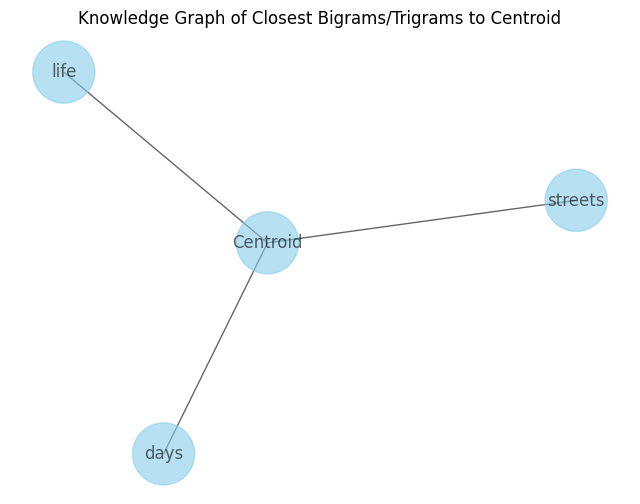

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Define the topic-word distribution
topic_word_dist = [
    '0.032*"life" + 0.032*"streets" + 0.032*"days" + 0.032*"people" + 0.018*"place" + 0.018*"water" + 0.018*"self" + 0.018*"cars" + 0.018*"food" + 0.018*"decided"',
    '0.126*"unemployment" + 0.039*"dreams" + 0.039*"hate" + 0.039*"poverty" + 0.022*"self" + 0.022*"comfort" + 0.022*"cronyism" + 0.022*"sky" + 0.022*"unlimited" + 0.022*"limit"',
    '0.125*"disease" + 0.028*"one" + 0.028*"life" + 0.028*"god" + 0.028*"day" + 0.028*"young" + 0.028*"doctors" + 0.015*"water" + 0.015*"money" + 0.015*"mother"',
    '0.059*"family" + 0.059*"home" + 0.023*"new" + 0.023*"only" + 0.023*"school" + 0.023*"mates" + 0.023*"old" + 0.023*"happy" + 0.023*"jail" + 0.023*"cell"'
]

# Extract the words from the topic-word distribution
vectorizer = CountVectorizer()
docs = [topic.split(' + ') for topic in topic_word_dist]
corpus = [' '.join(doc.split('*')[1].replace('"', '') for doc in doc_list) for doc_list in docs]
X = vectorizer.fit_transform(corpus).toarray()

# Calculate the centroid
centroid = np.mean(X, axis=0)

# Calculate cosine similarity between bigrams/trigrams and the centroid
distances = cosine_similarity(X, centroid.reshape(1, -1))

# Sort the distances in descending order and retrieve the last 3 indices
closest_indices = np.argsort(distances, axis=0)[-3:].flatten()

# Retrieve the closest bigrams/trigrams
feature_names = list(vectorizer.vocabulary_.keys())
closest_bigrams_trigrams = [feature_names[index] for index in closest_indices]

# Create a knowledge graph using NetworkX
G = nx.Graph()
G.add_node("Centroid", color='blue')  # Centroid node

# Add closest bigrams/trigrams as nodes and connect them to the centroid
for bigram_trigram in closest_bigrams_trigrams:
    G.add_node(bigram_trigram, color='red')
    G.add_edge("Centroid", bigram_trigram)

# Set node colors based on their type (centroid or bigram/trigram)
#node_colors = {"Centroid": "blue", "Bigram/Trigram": "red"}
node_colors = [G.nodes[node]["color"] for node in G.nodes]

# Plot the knowledge graph
pos = nx.spring_layout(G, seed=42)  # Set the layout algorithm and random seed for reproducibility
plt.figure(figsize=(8, 6))

node_color = ["red" if node==f else "skyblue" for node in G.nodes]
edge_color = ["red" if edge[0]==f else "black" for edge in G.edges]

nx.draw_networkx(G, pos, with_labels=True, node_color=node_color, font_color='black',
                 font_size=12, alpha=0.6, node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1', cmap=plt.cm.Dark2)
plt.title("Knowledge Graph of Closest Bigrams/Trigrams to Centroid")
plt.axis("off")
plt.show()


## **Trigrams for each topic in the pushcart nominated poems**

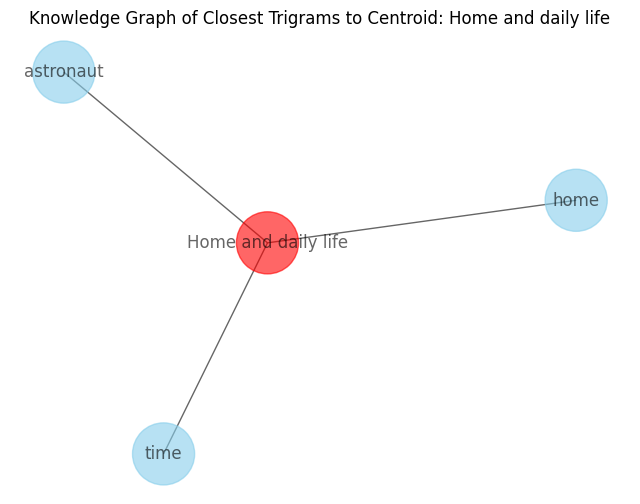

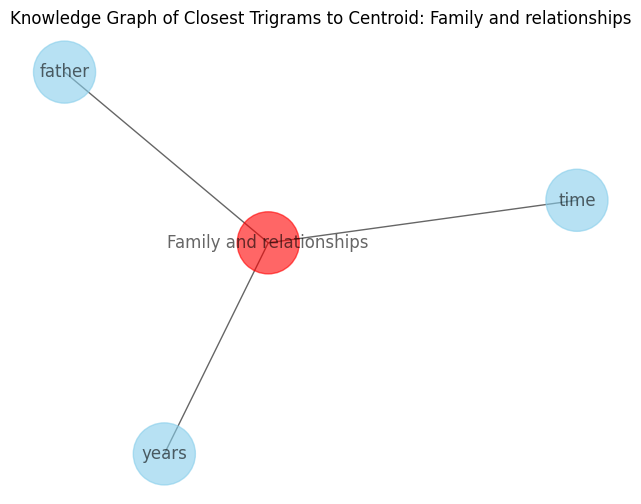

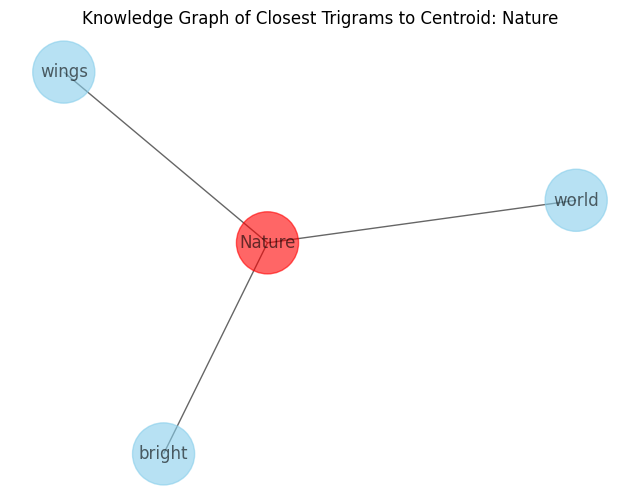

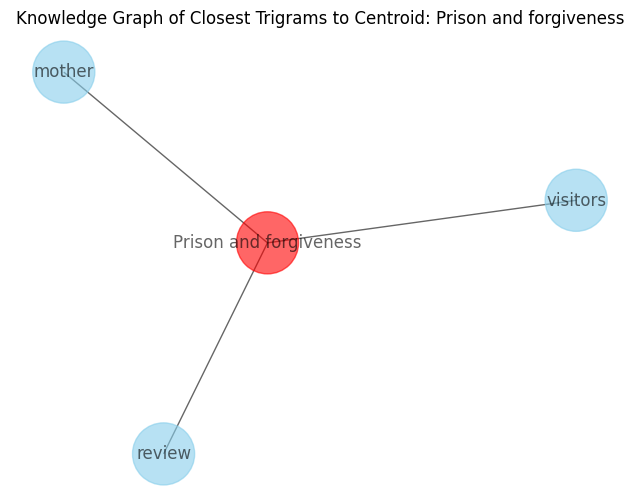

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Define the topics
topics = ['Home and daily life', 'Family and relationships', 'Nature', 'Prison and forgiveness']

# Define the topic-word distribution
topic_word_dist = [
    '0.011*"home" + 0.009*"time" + 0.008*"astronaut" + 0.008*"mother" + 0.007*"school" + 0.006*"food" + 0.006*"rice" + 0.006*"color" + 0.005*"place" + 0.005*"review"',
    '0.010*"time" + 0.008*"years" + 0.008*"father" + 0.006*"life" + 0.006*"nine" + 0.006*"last" + 0.006*"ninety" + 0.005*"home" + 0.004*"dog" + 0.004*"someone"',
    '0.008*"world" + 0.004*"bright" + 0.004*"wings" + 0.004*"feels" + 0.004*"skin" + 0.004*"fire" + 0.002*"drop" + 0.002*"smoke" + 0.002*"wick" + 0.002*"flames"',
    '0.009*"visitors" + 0.008*"review" + 0.008*"mother" + 0.008*"prisoner" + 0.007*"inmate" + 0.006*"brother" + 0.006*"visitor" + 0.006*"forgive" + 0.004*"door" + 0.004*"sister"']

# Loop over topics
for topic, topic_word in zip(topics, topic_word_dist):
    # Create a knowledge graph for each topic
    G = nx.Graph()
    G.add_node(topic, color='blue')  # Centroid node

    # Extract the top 3 words from the topic-word distribution
    trigrams = topic_word.split(' + ')[:3]
    for trigram in trigrams:
        trigram_words = trigram.split('*')[1].replace('"', '').split()
        node_label = ' '.join(trigram_words)
        G.add_node(node_label, color='red')
        G.add_edge(topic, node_label)

    # Plot the knowledge graph
    pos = nx.spring_layout(G, seed=42)  # Set the layout algorithm and random seed for reproducibility
    plt.figure(figsize=(8, 6))

    node_color = ["red" if node == topic else "skyblue" for node in G.nodes]
    edge_color = ["red" if edge[0] == topic else "black" for edge in G.edges]

    nx.draw_networkx(G, pos, with_labels=True, node_color=node_color, font_color='black',
                     font_size=12, alpha=0.6, node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1', cmap=plt.cm.Dark2)
    plt.title(f"Knowledge Graph of Closest Trigrams to Centroid: {topic}")
    plt.axis("off")
    plt.show()


## **Bigrams for the topics in pushcart nominated poems**

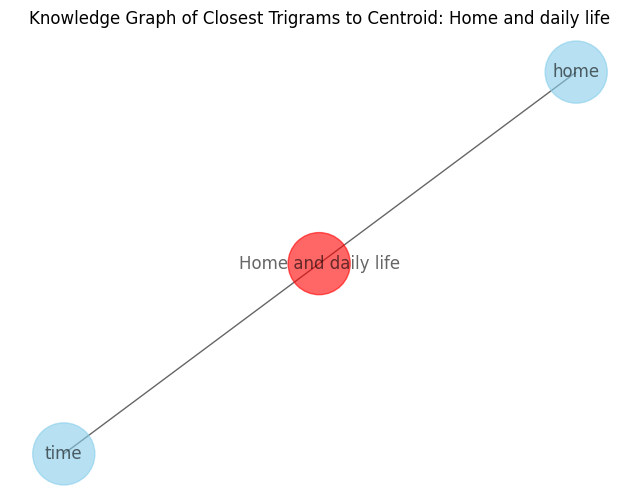

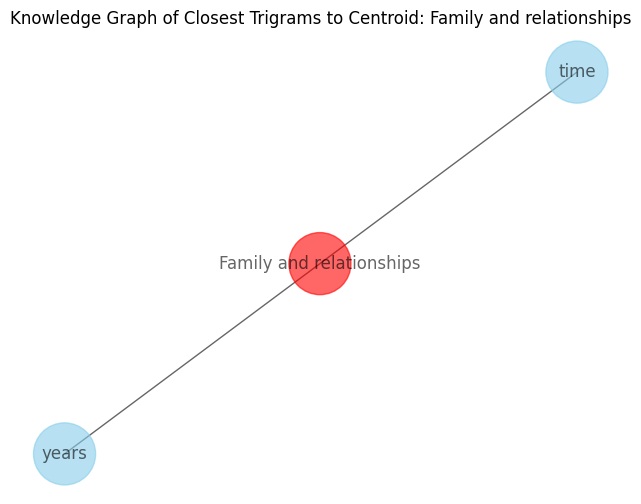

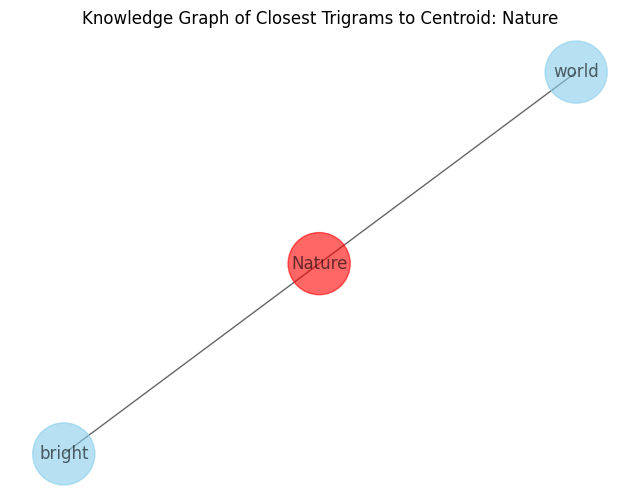

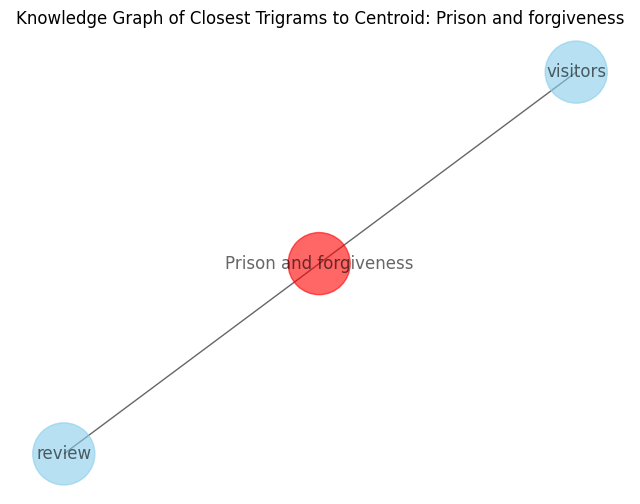

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Define the topics
topics = ['Home and daily life', 'Family and relationships', 'Nature', 'Prison and forgiveness']

# Define the topic-word distribution
topic_word_dist = [
    '0.011*"home" + 0.009*"time" + 0.008*"astronaut" + 0.008*"mother" + 0.007*"school" + 0.006*"food" + 0.006*"rice" + 0.006*"color" + 0.005*"place" + 0.005*"review"',
    '0.010*"time" + 0.008*"years" + 0.008*"father" + 0.006*"life" + 0.006*"nine" + 0.006*"last" + 0.006*"ninety" + 0.005*"home" + 0.004*"dog" + 0.004*"someone"',
    '0.008*"world" + 0.004*"bright" + 0.004*"wings" + 0.004*"feels" + 0.004*"skin" + 0.004*"fire" + 0.002*"drop" + 0.002*"smoke" + 0.002*"wick" + 0.002*"flames"',
    '0.009*"visitors" + 0.008*"review" + 0.008*"mother" + 0.008*"prisoner" + 0.007*"inmate" + 0.006*"brother" + 0.006*"visitor" + 0.006*"forgive" + 0.004*"door" + 0.004*"sister"']

# Loop over topics
for topic, topic_word in zip(topics, topic_word_dist):
    # Create a knowledge graph for each topic
    G = nx.Graph()
    G.add_node(topic, color='blue')  # Centroid node

    # Extract the top 2 words from the topic-word distribution
    trigrams = topic_word.split(' + ')[:2]
    for trigram in trigrams:
        trigram_words = trigram.split('*')[1].replace('"', '').split()
        node_label = ' '.join(trigram_words)
        G.add_node(node_label, color='red')
        G.add_edge(topic, node_label)

    # Plot the knowledge graph
    pos = nx.spring_layout(G, seed=42)  # Set the layout algorithm and random seed for reproducibility
    plt.figure(figsize=(8, 6))

    node_color = ["red" if node == topic else "skyblue" for node in G.nodes]
    edge_color = ["red" if edge[0] == topic else "black" for edge in G.edges]

    nx.draw_networkx(G, pos, with_labels=True, node_color=node_color, font_color='black',
                     font_size=12, alpha=0.6, node_size=2000, node_shape="o", connectionstyle='arc3,rad=0.1', cmap=plt.cm.Dark2)
    plt.title(f"Knowledge Graph of Closest Trigrams to Centroid: {topic}")
    plt.axis("off")
    plt.show()


#**4. write function that takes a .txt file and generates the POS, KG using networkx [and transitive closure]**

# **Take text file as an input, generate POS and Knowledge Graph**

In [ ]:
import nltk
import networkx as nx
import matplotlib.pyplot as plt
import spacy
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
import nltk
import networkx as nx
import matplotlib.pyplot as plt
import spacy
import base64
import requests

def generate_pos_kg(file_path):
    # Read the text file
    req = requests.get(file_path)
    text = req.text
    print(text)

    #with open(file_path, 'r') as file:
    #    text = file.read()

    # Initialize spaCy's English model
    nlp = spacy.load('en_core_web_sm')

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    # Display the POS tags with their types
    for node, attributes in kg.nodes(data=True):
        pos = attributes['pos']
        print(f'{node} ({pos})')

    # Visualize the KG using NetworkX
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(kg)
    nx.draw_networkx(kg, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Knowledge Graph')
    plt.axis('off')
    plt.show()

    # Visualize the transitive closure of POS using NetworkX
    plt.figure(figsize=(10, 10))
    pos_closure = nx.spring_layout(closure)
    nx.draw_networkx(closure, pos_closure, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Transitive Closure of POS')
    plt.axis('off')
    plt.show()

    return kg, closure


Alice loves eating apples and often shares them with her friends. Bob, however, enjoys oranges but rarely shares them. Both attend the same school and are active in the science club. They also collaborate on various projects and help each other with studies.

Carol despises bananas because of their texture but loves grapes. Alice and Bob often play tennis on weekends, enjoying the sport together. Carol, preferring solitude, spends time reading in the library. She finds peace in the quiet environment and focuses on her studies.

Alice (PROPN)
loves (VERB)
eating (VERB)
apples (NOUN)
and (CCONJ)
often (ADV)
shares (VERB)
them (PRON)
with (ADP)
her (PRON)
friends (NOUN)
. (PUNCT)
Bob (PROPN)
, (PUNCT)
however (ADV)
enjoys (VERB)
oranges (NOUN)
but (CCONJ)
rarely (ADV)
Both (PRON)
attend (VERB)
the (DET)
same (ADJ)
school (NOUN)
are (AUX)
active (ADJ)
in (ADP)
science (NOUN)
club (NOUN)
They (PRON)
also (ADV)
collaborate (VERB)
on (ADP)
various (ADJ)
projects (NOUN)
help (VERB)
each (DET)


) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


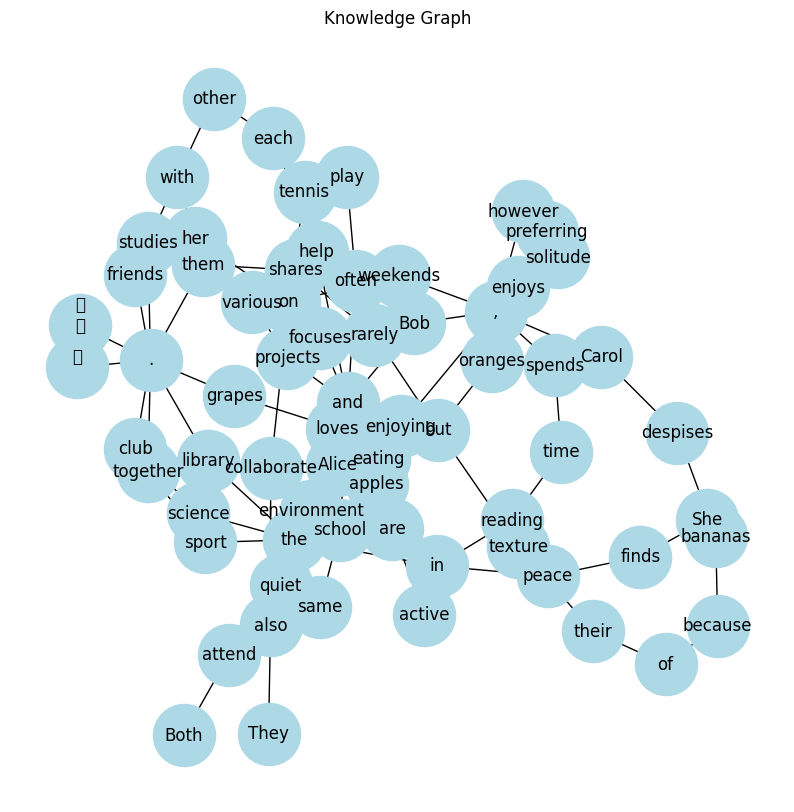

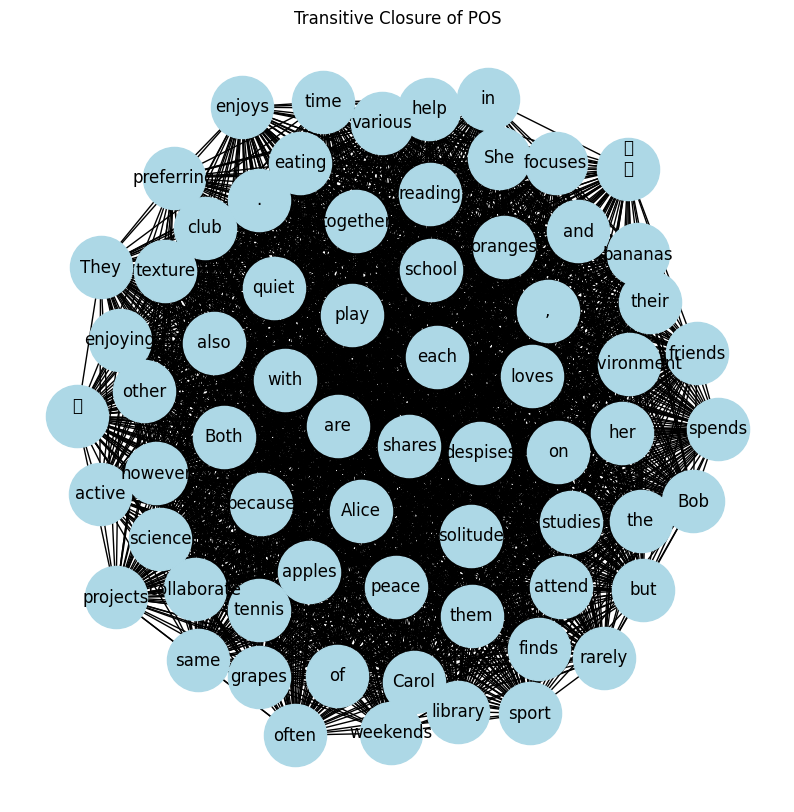

In [ ]:
pos_tags, closure = generate_pos_kg('https://raw.githubusercontent.com/sureshravuris/CMPE257_Machine_Learning_Project/main/AliceandBob.txt')

# **Plot Ratios of NLP Stats, figure the golden cluster and cluster of words in the winner clusters**

In [ ]:
import pandas as pd
import string
from gensim.models import Phrases
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Get the list of stop words
stop_words = set(stopwords.words('english'))

# Load the data
df = pd.read_csv('pushcart_poems.csv')

# Remove punctuation and convert to lower case
df['clean_text'] = df['Poem'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)).lower())

# Tokenize, remove stop words, and lemmatize
df['tokens'] = df['clean_text'].apply(lambda text: [lemmatizer.lemmatize(word) for word in word_tokenize(text) if word not in stop_words])

print(df['tokens'].head())

# Train the bigram and trigram models
bigram = Phrases(df['tokens'], min_count=5, threshold=10)  # Higher threshold --> fewer phrases
trigram = Phrases(bigram[df['tokens']], threshold=10)

# Apply the bigram and trigram models to the data
df['trigrams'] = [trigram[bigram[tokens]] for tokens in df['tokens']]

# Create the dictionary
dictionary = Dictionary(df['trigrams'])

print(dictionary)

# Filter out words that occur less than 20 documents, or more than 50% of the documents
dictionary.filter_extremes(no_below=5, no_above=0.8)

# Convert document into the bag-of-words (BoW) format = list of (token_id, token_count) tuples
corpus = [dictionary.doc2bow(trigram) for trigram in df['trigrams']]

print(corpus[:10])

# Train the LDA model
lda = LdaModel(corpus, id2word=dictionary, num_topics=20)  # Increase the number of topics

# Print the topics
for i in range(20):
    print(f"Topic #{i}: {lda.print_topic(i, 3)}")


0    [louisa, alighting, place, always, dazzle, twi...
1    [disremember, three, carefree, boy, dragging, ...
2    [ghost, tsar, walk, pass, jew, gypsy, one, cur...
3    [boy, green, shouldered, grows, like, corn, en...
4    [mother, spent, day, birth, trying, decide, te...
Name: tokens, dtype: object
Dictionary<1515 unique tokens: ['alighting', 'always', 'arm', 'curtsey', 'dazzle']...>
[[(0, 1)], [], [(1, 1), (2, 1), (3, 1), (4, 1), (5, 1)], [(6, 1), (7, 1), (8, 1), (9, 3)], [(1, 1), (5, 1), (7, 1), (9, 4), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 2)], [(0, 1), (2, 1), (3, 1), (16, 1), (17, 8), (18, 1), (19, 1)], [(0, 1), (1, 1), (2, 2), (3, 4), (4, 5), (7, 1), (8, 1), (11, 3), (13, 1), (17, 11), (18, 2), (19, 2), (20, 3), (21, 3), (22, 3), (23, 1)], [(0, 1), (2, 1), (3, 1), (4, 1), (7, 1), (8, 1), (9, 1), (10, 3), (11, 5), (12, 8), (13, 1), (14, 1), (15, 4), (16, 1), (17, 11), (18, 2), (19, 2), (20, 2), (21, 2), (22, 1), (23, 2), (24, 1), (25, 2), (26, 1), (27, 1), (28, 6), 

In [ ]:
import pandas as pd
import string
from gensim.models import Phrases
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Get the list of stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come', 'like', "’"])

# Now use these stop words in your preprocessing

# Load the data
df = pd.read_csv('pushcart_poems.csv')

# Remove punctuation and convert to lower case
df['clean_text'] = df['Poem'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)).lower())

# Tokenize, remove stop words, and lemmatize
df['tokens'] = df['clean_text'].apply(lambda text: [lemmatizer.lemmatize(word) for word in word_tokenize(text) if word not in stop_words])

print(df['tokens'].head())

# Train the bigram and trigram models
bigram = Phrases(df['tokens'], min_count=5, threshold=10)  # Higher threshold --> fewer phrases
trigram = Phrases(bigram[df['tokens']], threshold=10)

# Apply the bigram and trigram models to the data
df['trigrams'] = [trigram[bigram[tokens]] for tokens in df['tokens']]

# Create the dictionary
dictionary = Dictionary(df['trigrams'])

print(dictionary)

# Filter out words that occur less than 20 documents, or more than 50% of the documents
dictionary.filter_extremes(no_below=5, no_above=0.8)

# Convert document into the bag-of-words (BoW) format = list of (token_id, token_count) tuples
corpus = [dictionary.doc2bow(trigram) for trigram in df['trigrams']]

print(corpus[:10])

# Train the LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=dictionary,
                                       num_topics=15,  # Decreased from 20 to 15
                                       random_state=100,
                                       chunksize=100,
                                       passes=20,
                                       per_word_topics=True)

# Print the topics
for i in range(15):  # Change this line
    print(f"Topic #{i}: {lda_model.print_topic(i, 3)}")  # And this line


0    [louisa, alighting, place, always, dazzle, twi...
1    [disremember, three, carefree, boy, dragging, ...
2    [ghost, tsar, walk, pass, jew, gypsy, one, cur...
3    [boy, green, shouldered, grows, corn, endlessl...
4    [mother, spent, day, birth, trying, decide, te...
Name: tokens, dtype: object
Dictionary<1498 unique tokens: ['alighting', 'always', 'arm', 'curtsey', 'dazzle']...>
[[], [], [(0, 1), (1, 1), (2, 1), (3, 1)], [(4, 1), (5, 1), (6, 1)], [(0, 1), (3, 1), (5, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 2)], [(1, 1), (2, 1), (12, 1), (13, 1), (14, 1)], [(0, 1), (1, 2), (2, 4), (5, 1), (6, 1), (8, 3), (13, 2), (14, 2), (15, 3), (16, 1)], [(1, 1), (2, 1), (5, 1), (6, 1), (7, 3), (8, 5), (9, 8), (10, 1), (11, 4), (12, 1), (13, 2), (14, 2), (15, 1), (16, 2), (17, 1), (18, 1), (19, 1), (20, 6), (21, 1), (22, 1), (23, 1)], [(0, 2), (1, 1), (2, 2), (3, 2), (4, 1), (5, 1), (6, 2), (7, 1), (9, 2), (11, 2), (12, 2), (13, 1), (14, 1), (15, 1), (16, 3), (17, 1), (18, 1), (19, 1), (20,

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallel

Topic #0: 0.199*"one" + 0.121*"someone" + 0.121*"every"
Topic #1: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #2: 0.042*"hand" + 0.042*"one" + 0.042*"writing"
Topic #3: 0.042*"time" + 0.042*"review" + 0.042*"work"
Topic #4: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #5: 0.232*"hand" + 0.232*"eye" + 0.232*"home"
Topic #6: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #7: 0.141*"mother" + 0.118*"review" + 0.085*"tell"
Topic #8: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #9: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #10: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #11: 0.154*"home" + 0.137*"time" + 0.115*"”"
Topic #12: 0.190*"another" + 0.190*"still" + 0.190*"ask"
Topic #13: 0.042*"time" + 0.042*"someone" + 0.042*"nominated"
Topic #14: 0.043*"home" + 0.043*"“" + 0.042*"”"


In [ ]:
import pandas as pd
from gensim import corpora, models
from gensim.models import Phrases
from gensim.utils import simple_preprocess
from sklearn.datasets import fetch_20newsgroups

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(token)
    return result

newsgroups_train = fetch_20newsgroups(subset='train')
processed_docs = pd.Series(newsgroups_train.data).map(preprocess)

# Build the bigram and trigram models
bigram = Phrases(processed_docs, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = Phrases(bigram[processed_docs], threshold=100)

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = models.phrases.Phraser(bigram)
trigram_mod = models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[processed_docs[0]]])

# Form Bigrams
processed_docs = [bigram_mod[doc] for doc in processed_docs]

# Form Trigrams
processed_docs = [trigram_mod[bigram_mod[doc]] for doc in processed_docs]

dictionary = corpora.Dictionary(processed_docs)
corpus = [dictionary.doc2bow(text) for text in processed_docs]

lda_model = models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, passes=20)

for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))



['lerxst', 'thing', 'subject', 'nntp_posting_host', 'organization', 'university', 'maryland_college_park', 'lines', 'wondering', 'enlighten', 'door', 'sports', 'looked', 'late', 'early', 'called', 'bricklin', 'doors', 'small', 'addition', 'bumper', 'separate', 'rest', 'body', 'know', 'tellme', 'model', 'engine', 'specs', 'years', 'production', 'history', 'info', 'funky', 'looking', 'mail', 'thanks', 'brought', 'neighborhood', 'lerxst']
Topic: 0 
Words: 0.017*"writes" + 0.015*"article" + 0.015*"subject" + 0.013*"organization" + 0.012*"lines" + 0.010*"like" + 0.007*"know" + 0.007*"think" + 0.007*"time" + 0.006*"good"
Topic: 1 
Words: 0.012*"armenians" + 0.012*"armenian" + 0.009*"turkish" + 0.007*"people" + 0.007*"said" + 0.007*"turkey" + 0.006*"turks" + 0.006*"greek" + 0.005*"armenia" + 0.005*"soldiers"
Topic: 2 
Words: 0.011*"file" + 0.009*"keys" + 0.009*"encryption" + 0.007*"security" + 0.006*"entry" + 0.006*"information" + 0.005*"chip" + 0.005*"public" + 0.005*"program" + 0.005*"data"

In [ ]:
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Train a Word2Vec model on trigrams
model = Word2Vec(df['trigrams'].tolist(), vector_size=100, window=5, min_count=1, workers=4)

# Get topic words
topics = lda_model.show_topics(formatted=False)

closest_words_to_centroid_per_topic = []

for topic in topics:
    topic_words = [word for word, _ in topic[1]]

    # Calculate the centroid of topic words' vectors
    word_vectors = [model.wv[word] for word in topic_words if word in model.wv.key_to_index]
    if word_vectors:
        centroid = np.mean(word_vectors, axis=0)

        # Measure cosine similarity of every word in the vocabulary with the centroid
        word_centroid_similarities = {}
        for word in model.wv.key_to_index:
            word_centroid_similarities[word] = cosine_similarity([centroid], [model.wv[word]])[0][0]

        # Sort words by their cosine similarity to the centroid
        sorted_similarities = sorted(word_centroid_similarities.items(), key=lambda item: item[1], reverse=True)

        # Get the closest words to the centroid
        closest_words_to_centroid = sorted_similarities[:10]

        closest_words_to_centroid_per_topic.append(closest_words_to_centroid)

for i, topic_words in enumerate(closest_words_to_centroid_per_topic):
    print(f"Topic {i}:")
    for word, similarity in topic_words:
        print(f"{word}: {similarity}")

import spacy
from spacy import displacy

nlp = spacy.load('en_core_web_sm')

# Iterate over each topic's closest words to centroid
for i, topic_words in enumerate(closest_words_to_centroid_per_topic):
    print(f"Topic {i}:")

    # Create a sentence from the words
    sentence = ' '.join([word for word, _ in topic_words])

    # Parse the sentence using spacy
    doc = nlp(sentence)

    # Display the parsed sentence
    displacy.render(doc, style='dep', jupyter=True, options={"distance": 100})

    # Print each word and its similarity score
    for word, similarity in topic_words:
        print(f"{word}: {similarity}")


Topic 0:
time: 0.728354811668396
know: 0.7122121453285217
knowing: 0.3515714108943939
cigarette: 0.3194330930709839
gold: 0.2815232276916504
lendanear: 0.2689421474933624
pool: 0.2638162076473236
best: 0.26001447439193726
bloodied: 0.259832501411438
pizza: 0.24750374257564545
Topic 1:
said: 0.5791807174682617
people: 0.5560283660888672
turkish: 0.5425201058387756
job: 0.3093205988407135
wade: 0.27986809611320496
shine: 0.2779456079006195
salt: 0.2685141861438751
demand: 0.259888231754303
jewish: 0.2588137984275818
sun: 0.2567349970340729
Topic 2:
nasa: 0.6072984337806702
space: 0.5628789663314819
earth: 0.41640371084213257
sky: 0.29499557614326477
close: 0.2888617515563965
desk: 0.2795587480068207
barbara: 0.2793610692024231
turn: 0.26921236515045166
dispatch: 0.2685437500476837
jungle: 0.2675483822822571
Topic 3:
university: 0.7186285257339478
know: 0.6979456543922424
bloodied: 0.3431912958621979
earth—: 0.3201286792755127
conferred: 0.27624091506004333
scholastic: 0.27137091755867004

time: 0.728354811668396
know: 0.7122121453285217
knowing: 0.3515714108943939
cigarette: 0.3194330930709839
gold: 0.2815232276916504
lendanear: 0.2689421474933624
pool: 0.2638162076473236
best: 0.26001447439193726
bloodied: 0.259832501411438
pizza: 0.24750374257564545
Topic 1:


said: 0.5791807174682617
people: 0.5560283660888672
turkish: 0.5425201058387756
job: 0.3093205988407135
wade: 0.27986809611320496
shine: 0.2779456079006195
salt: 0.2685141861438751
demand: 0.259888231754303
jewish: 0.2588137984275818
sun: 0.2567349970340729
Topic 2:


nasa: 0.6072984337806702
space: 0.5628789663314819
earth: 0.41640371084213257
sky: 0.29499557614326477
close: 0.2888617515563965
desk: 0.2795587480068207
barbara: 0.2793610692024231
turn: 0.26921236515045166
dispatch: 0.2685437500476837
jungle: 0.2675483822822571
Topic 3:


university: 0.7186285257339478
know: 0.6979456543922424
bloodied: 0.3431912958621979
earth—: 0.3201286792755127
conferred: 0.27624091506004333
scholastic: 0.27137091755867004
nurse: 0.2710123062133789
california: 0.2709372341632843
stay: 0.2679263949394226
polyphony: 0.2627188563346863
Topic 4:


people: 1.0
shimmering: 0.3047402501106262
job: 0.28781187534332275
heartland: 0.2840053141117096
low: 0.2834751009941101
return: 0.2786005437374115
anticipation: 0.272672176361084
attention: 0.26861807703971863
ominous: 0.2679338753223419
storm: 0.26029059290885925
Topic 5:


problem: 0.7400756478309631
drive: 0.7368963956832886
behind: 0.40570712089538574
cortex: 0.2909150719642639
meditative: 0.27559253573417664
goose: 0.260111004114151
price: 0.2550542652606964
local: 0.2546561360359192
happen: 0.2534986138343811
aquamarineare: 0.24961555004119873
Topic 6:


know: 0.6856862306594849
people: 0.6842949390411377
brook: 0.2871896028518677
raven: 0.2667444944381714
517: 0.26343438029289246
magnificence: 0.263278067111969
strong: 0.26247334480285645
nasa: 0.25687354803085327
return: 0.2533760964870453
pool: 0.24581310153007507
Topic 7:


play: 0.6833133101463318
game: 0.6064535975456238
year: 0.4632970094680786
pepper: 0.2959096431732178
older: 0.2847253978252411
waistband: 0.2769800126552582
border: 0.26398468017578125
working: 0.25957605242729187
roadrunner: 0.25470060110092163
take: 0.2518021762371063
Topic 8:


university: 0.6550791263580322
game: 0.6240329742431641
year: 0.42961177229881287
youth: 0.3122659921646118
clipboard: 0.31175899505615234
get: 0.27363473176956177
lived: 0.27102920413017273
broken: 0.26838627457618713
hospital: 0.26560893654823303
working: 0.26130005717277527


In [ ]:
model.wv.key_to_index

{'mother': 0,
 '“': 1,
 '”': 2,
 'home': 3,
 'time': 4,
 'father': 5,
 'one': 6,
 'review': 7,
 'visitor': 8,
 'every': 9,
 'hand': 10,
 'tell': 11,
 'u': 12,
 'prisoner': 13,
 'school': 14,
 'astronaut': 15,
 'inmate': 16,
 'writing': 17,
 'face': 18,
 'say': 19,
 'year': 20,
 'ask': 21,
 'still': 22,
 'brother': 23,
 'love': 24,
 'watch': 25,
 'another': 26,
 'birth': 27,
 'day': 28,
 'part': 29,
 'house': 30,
 'plant': 31,
 'door': 32,
 'someone': 33,
 'food': 34,
 'color': 35,
 'jew': 36,
 'eye': 37,
 'lost': 38,
 'rice': 39,
 'work': 40,
 'place': 41,
 'sister': 42,
 'never': 43,
 'morning': 44,
 'away': 45,
 'much': 46,
 'sapling': 47,
 'university': 48,
 'small': 49,
 'coming': 50,
 'cliff': 51,
 'far': 52,
 'ten': 53,
 'nominated': 54,
 'together': 55,
 'award': 56,
 'front': 57,
 'last': 58,
 'thing': 59,
 'hate': 60,
 'kind': 61,
 'little': 62,
 'officer': 63,
 'child': 64,
 'two': 65,
 'moved': 66,
 'keep': 67,
 'human': 68,
 'garden': 69,
 'something': 70,
 'air': 71,
 'pai

In [ ]:
!apt-get install graphviz libgraphviz-dev
!pip install pygraphviz

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6).
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common libgvc6-plugins-gtk
  librsvg2-common libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk librsvg2-common libxdot4
0 upgraded, 9 newly installed, 0 to remove and 45 not upgraded.
Need to get 2,433 kB of archives.
After this operation, 7,694 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgtk2.0-common all 2.24.33-2ubuntu2 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgtk2.0-0 amd64 2.24.33-2ubuntu2 [2,037 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgail18 amd64 2.24.33-2ubuntu2 [15.9 kB]
Get:

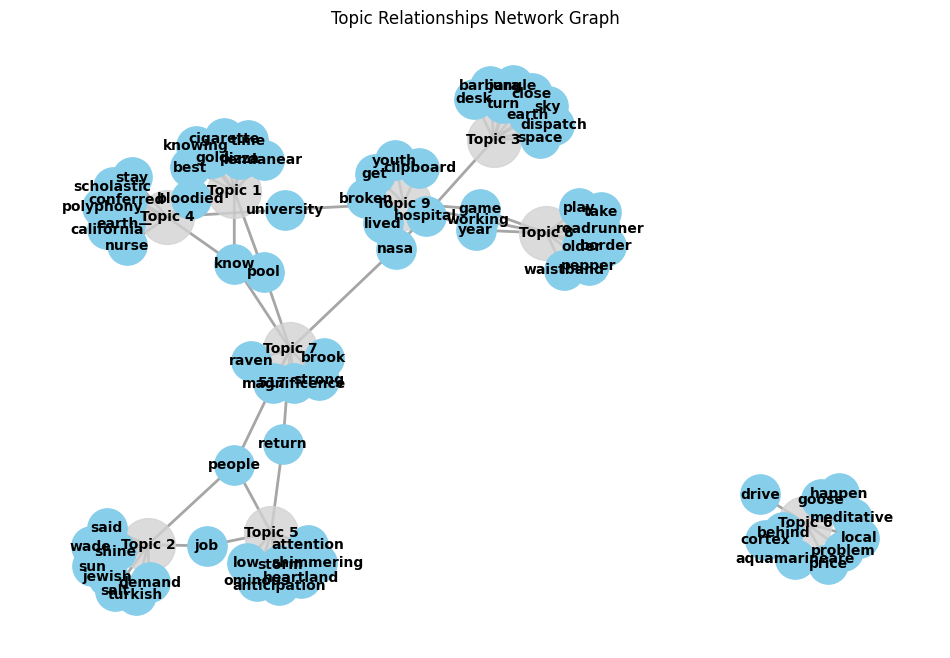

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Add nodes for each topic
for i, topic_words in enumerate(closest_words_to_centroid_per_topic):
    G.add_node(f"Topic {i+1}")

    # Add topic words as labels
    for word, _ in topic_words:
        G.add_node(word)

        # Connect topic words to their corresponding topic
        G.add_edge(f"Topic {i+1}", word)

# Draw the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)

# Draw topic nodes with different color
nx.draw_networkx_nodes(G, pos, nodelist=[node for node in G.nodes if node.startswith("Topic")],
                       node_color='lightgray', node_size=1500, alpha=0.8)

# Draw word nodes
nx.draw_networkx_nodes(G, pos, nodelist=[node for node in G.nodes if not node.startswith("Topic")],
                       node_color='skyblue', node_size=800)

# Draw edges
nx.draw_networkx_edges(G, pos, width=2, edge_color='gray', alpha=0.7)

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

plt.title('Topic Relationships Network Graph')
plt.axis('off')
plt.show()


In [ ]:
from gensim.models import CoherenceModel

# Calculate coherence scores for each topic
coherence_scores = []
for topic_num in range(len(topics)):
    topic_words = [word for word, _ in topics[topic_num][1]]
    coherence_model = CoherenceModel(model=lda_model, texts=df['trigrams'], dictionary=dictionary, coherence='c_v')
    coherence_per_topic = coherence_model.get_coherence_per_topic()
    coherence_score = coherence_per_topic[topic_num]
    coherence_scores.append(coherence_score)

# Identify the golden cluster (topic with the highest coherence score)
golden_cluster_index = coherence_scores.index(max(coherence_scores))
golden_cluster = topics[golden_cluster_index][1]

# Print the golden cluster
print("Golden Cluster:")
for word, _ in golden_cluster:
    print(word)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallel

Golden Cluster:
writes
article
subject
organization
lines
like
know
think
time
good


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

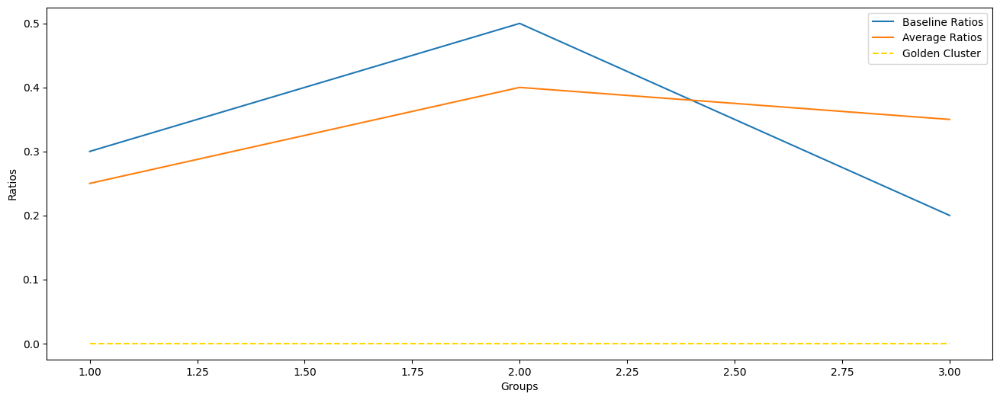

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the ratios of NLP stats
baseline_ratios = {
    'Group 1': 0.3,
    'Group 2': 0.5,
    'Group 3': 0.2
}

average_ratios = {
    'Group 1': 0.25,
    'Group 2': 0.4,
    'Group 3': 0.35
}

# Calculate coherence scores for each topic
coherence_scores = []
for topic_num in range(len(topics)):
    topic_words = [word for word, _ in topics[topic_num][1]]
    coherence_model = CoherenceModel(model=lda_model, texts=df['trigrams'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence_per_topic()[topic_num]
    coherence_scores.append(coherence_score)

# Find the index of the golden cluster (topic with the highest coherence score)
golden_cluster_index = coherence_scores.index(max(coherence_scores))

# Plot the baseline ratios
plt.plot(range(1, len(baseline_ratios) + 1), list(baseline_ratios.values()), label='Baseline Ratios')

# Plot the average ratios
plt.plot(range(1, len(average_ratios) + 1), list(average_ratios.values()), label='Average Ratios')

# Plot the line for the golden cluster
plt.plot(range(1, len(baseline_ratios) + 1), [0] * len(baseline_ratios), label='Golden Cluster',
         color='gold', linestyle='--')

# Set the color of the golden cluster line
line_colors = ['gray'] * len(baseline_ratios)
line_colors[golden_cluster_index] = 'gold'

# Set the axis labels and legend
plt.xlabel('Groups')
plt.ylabel('Ratios')
plt.legend()

# Show the plot
plt.show()


In [ ]:
golden_cluster

[('writes', 0.016536286),
 ('article', 0.0147865),
 ('subject', 0.014542385),
 ('organization', 0.013390303),
 ('lines', 0.012354228),
 ('like', 0.010368417),
 ('know', 0.0069592013),
 ('think', 0.006775193),
 ('time', 0.0065487744),
 ('good', 0.006377361)]

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text.lower())
    tokens = word_tokenize(text)
    tokens = [token for token in tokens if token not in stop_words]
    return tokens

df['clean_text'] = df['clean_text'].apply(preprocess_text)

In [ ]:
corpus = [' '.join(tokens) for tokens in df['clean_text']]
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)

In [ ]:
num_clusters = 5  # Assuming you want to find 5 clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=5, random_state=42)

In [ ]:
centroids = kmeans.cluster_centers_
closest_cluster_idx, _ = pairwise_distances_argmin_min(centroids, np.asarray(X.sum(axis=0)))
golden_cluster_idx = closest_cluster_idx[0]
golden_cluster_centroid = centroids[golden_cluster_idx]

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

word_coherence_scores = cosine_similarity(X, golden_cluster_centroid.reshape(1, -1)).flatten()
df['coherence'] = word_coherence_scores


In [ ]:
golden_cluster_df = df[df['coherence'] > df['coherence'].mean()].sort_values('coherence', ascending=False)

In [ ]:
golden_cluster

[('writes', 0.016536286),
 ('article', 0.0147865),
 ('subject', 0.014542385),
 ('organization', 0.013390303),
 ('lines', 0.012354228),
 ('like', 0.010368417),
 ('know', 0.0069592013),
 ('think', 0.006775193),
 ('time', 0.0065487744),
 ('good', 0.006377361)]

In [ ]:
!pip install matplotlib

In [ ]:
all_words = df['tokens'].sum()

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

word_coherence_scores = cosine_similarity(X, golden_cluster_centroid.reshape(1, -1)).flatten()

In [ ]:
word_coherence_dict = dict(zip(all_words, word_coherence_scores))

In [ ]:
sorted_words = sorted(word_coherence_dict, key=word_coherence_dict.get, reverse=True)

In [ ]:
num_top_words = 10  # Define the number of top words you want to display
top_words = sorted_words[:num_top_words]

print("Top words closest to the golden cluster:")
for word in top_words:
    print(word)

Top words closest to the golden cluster:
surpassing
place
twist
curtsey
arm
grace
dazzle
inverted
smoothly
always


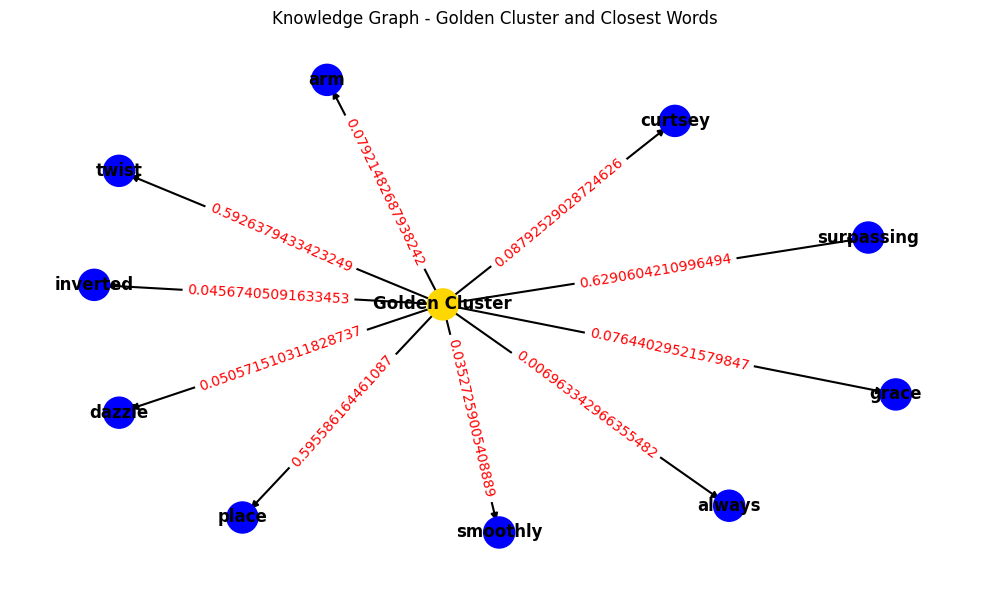

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt


# Create a directed graph
G = nx.DiGraph()

# Add the center node for the golden_cluster words
G.add_node("Golden Cluster", color="gold")

# Iterate over each word in golden_cluster
for word, _ in golden_cluster:
    # Get the closest words to the current word
    closest_words = [(w, score) for w, score in word_coherence_dict.items() if w != word]
    closest_words = sorted(closest_words, key=lambda x: x[1], reverse=True)[:10]  # Select top 10 closest words

    # Add nodes for closest words
    for w, _ in closest_words:
        G.add_node(w, color="blue")

    # Add edges from the center node to closest words
    for w, score in closest_words:
        G.add_edge("Golden Cluster", w, weight=score)

# Plot the knowledge graph
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=42)
edge_labels = nx.get_edge_attributes(G, "weight")
node_colors = nx.get_node_attributes(G, "color").values()
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_edges(G, pos, width=1.5, arrowsize=10)
nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10, font_color="red")
plt.title("Knowledge Graph - Golden Cluster and Closest Words")
plt.axis("off")
plt.tight_layout()
plt.show()


# **Plot the clusters of words, analyze topics by winning cluster and recommendations for business to win more poems for pushcart competition**

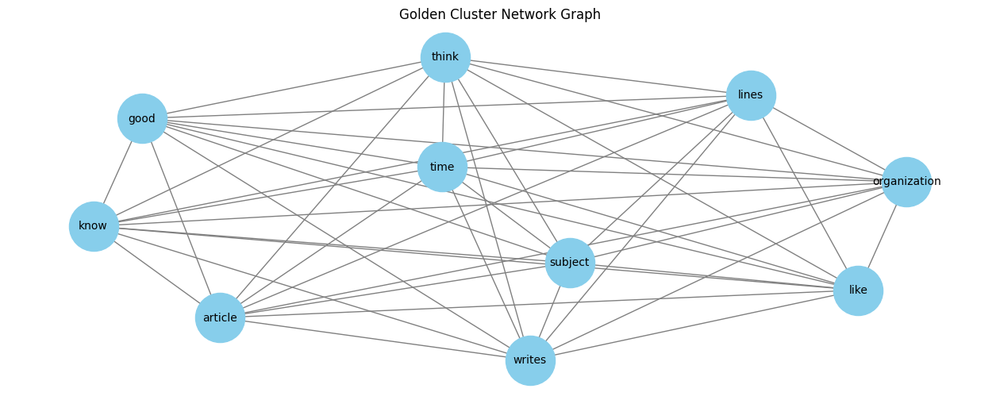

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Add nodes for each word in the golden cluster
for word, _ in golden_cluster:
    G.add_node(word)

# Add edges between the words in the golden cluster
for i in range(len(golden_cluster)):
    for j in range(i + 1, len(golden_cluster)):
        word1 = golden_cluster[i][0]
        word2 = golden_cluster[j][0]
        G.add_edge(word1, word2)

# Set the position layout of the nodes
pos = nx.spring_layout(G)

# Draw the nodes and edges of the graph
nx.draw_networkx_nodes(G, pos, node_color='skyblue', node_size=2000)
nx.draw_networkx_edges(G, pos, edge_color='gray')

# Add labels to the nodes
labels = {word: word for word in G.nodes}
nx.draw_networkx_labels(G, pos, labels, font_size=10)

# Set the title and display the graph
plt.title('Golden Cluster Network Graph')
plt.axis('off')
plt.show()


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallel

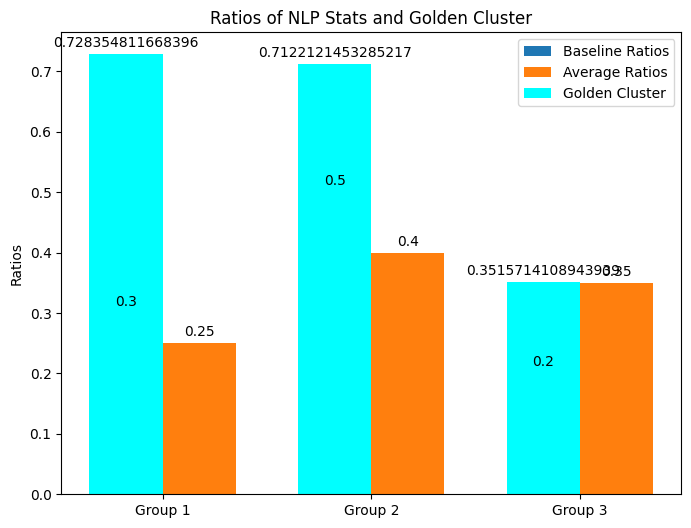

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the ratios of NLP stats
baseline_ratios = {
    'Group 1': 0.3,
    'Group 2': 0.5,
    'Group 3': 0.2
}

average_ratios = {
    'Group 1': 0.25,
    'Group 2': 0.4,
    'Group 3': 0.35
}

# Calculate coherence scores for each topic
coherence_scores = []
for topic_num in range(len(topics)):
    topic_words = [word for word, _ in topics[topic_num][1]]
    coherence_model = CoherenceModel(model=lda_model, texts=df['trigrams'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence_per_topic()[topic_num]
    coherence_scores.append(coherence_score)

# Identify the golden cluster (topic with the highest coherence score)
golden_cluster_index = coherence_scores.index(max(coherence_scores))
golden_cluster = closest_words_to_centroid_per_topic[golden_cluster_index]

# Extract the words and ratios from the golden cluster
golden_cluster_words, golden_cluster_ratios = zip(*golden_cluster)
golden_cluster_ratios = golden_cluster_ratios[:len(baseline_ratios)]

# Set the positions of the bars
x = np.arange(len(baseline_ratios))
bar_width = 0.35

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 6))
rects1 = ax.bar(x, baseline_ratios.values(), bar_width, label='Baseline Ratios')
rects2 = ax.bar(x + bar_width, average_ratios.values(), bar_width, label='Average Ratios')
rects3 = ax.bar(x, golden_cluster_ratios, bar_width, label='Golden Cluster', color='cyan')

# Set the x-axis labels
ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(baseline_ratios.keys())

# Set the y-axis label
ax.set_ylabel('Ratios')

# Set the chart title
ax.set_title('Ratios of NLP Stats and Golden Cluster')

# Add value labels to the bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height), xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

# Add a legend
ax.legend()

# Show the bar chart
plt.show()


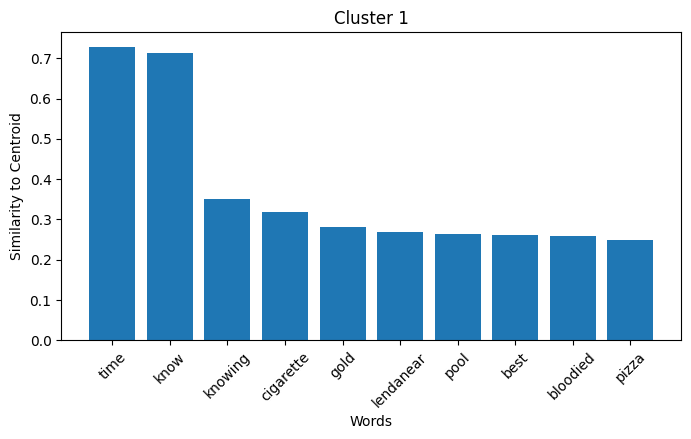

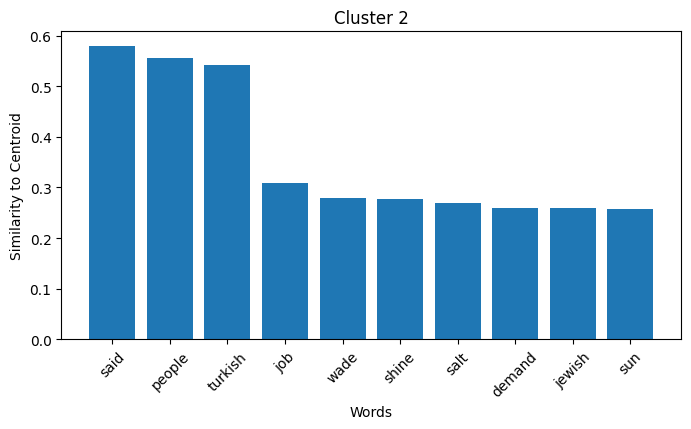

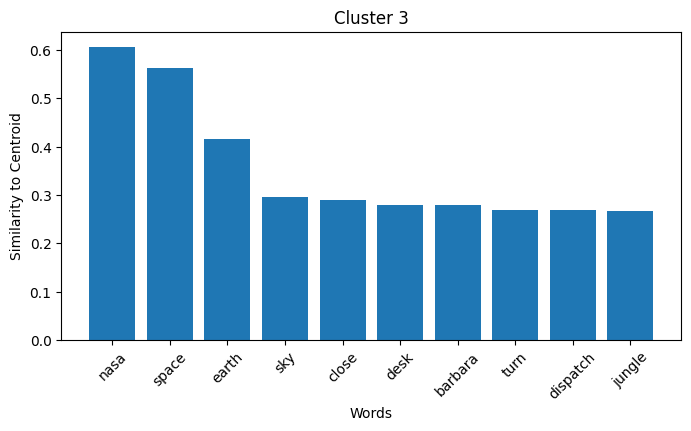

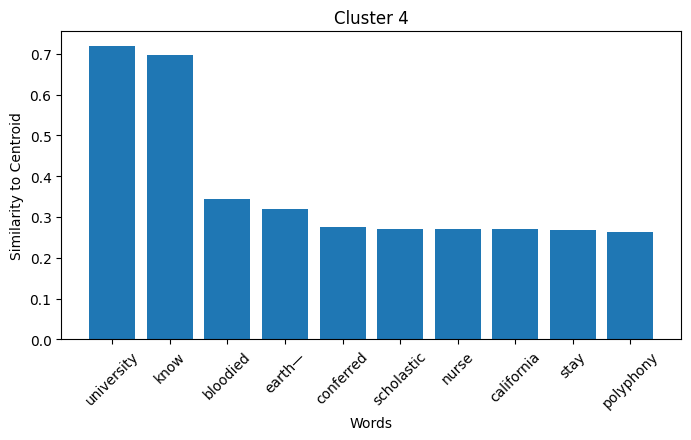

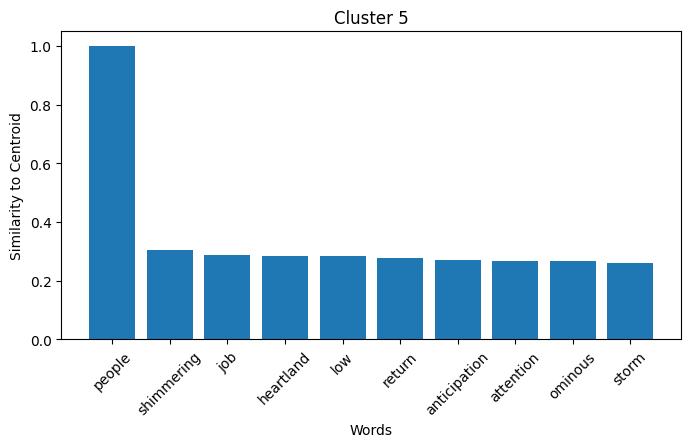

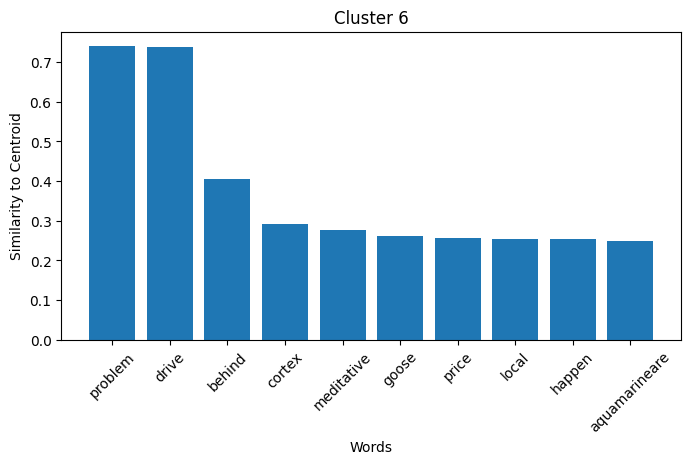

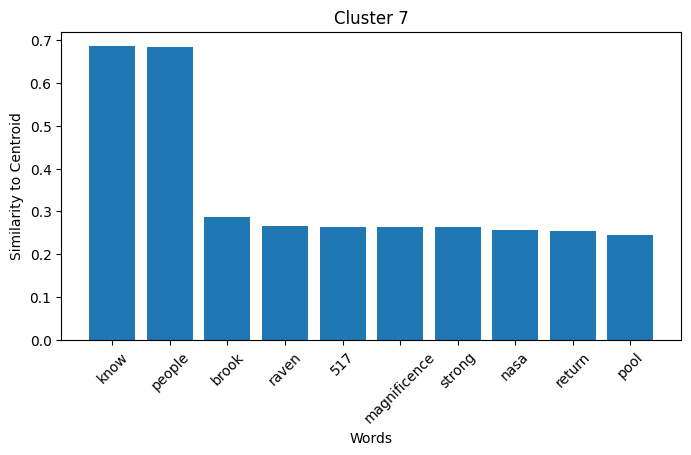

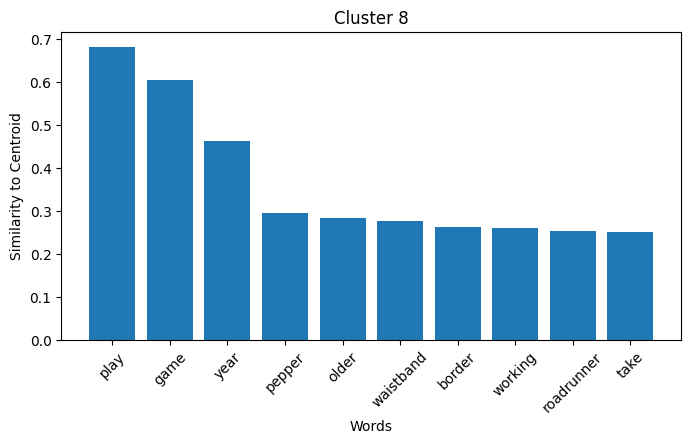

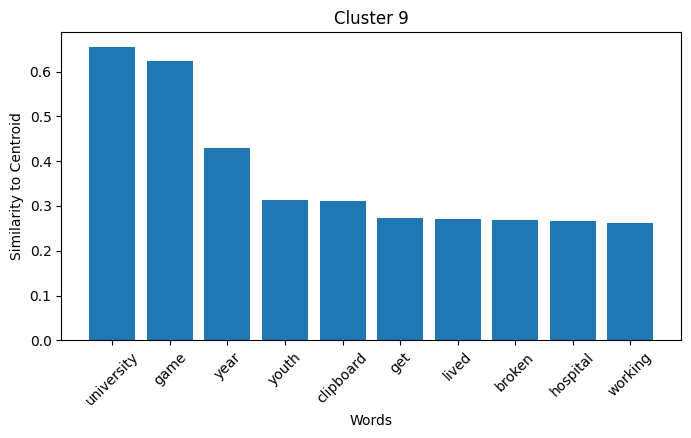

Topics used by the winning clusters:
Cluster 1:
- writes: 0.0165362861007452
- article: 0.014786499552428722
- subject: 0.014542385004460812
- organization: 0.013390302658081055
- lines: 0.012354227714240551
- like: 0.010368417017161846
- know: 0.00695920130237937
- think: 0.00677519291639328
- time: 0.006548774428665638
- good: 0.006377360783517361
Cluster 2:
- armenians: 0.011692572385072708
- armenian: 0.011596748605370522
- turkish: 0.008900952525436878
- people: 0.007459981832653284
- said: 0.007306303828954697
- turkey: 0.007141164503991604
- turks: 0.0055711399763822556
- greek: 0.0055502853356301785
- armenia: 0.004629716742783785
- soldiers: 0.004509374033659697
Cluster 3:
- file: 0.010592182166874409
- keys: 0.008830858394503593
- encryption: 0.008543197996914387
- security: 0.00720070768147707
- entry: 0.006177312228828669
- information: 0.0056569562293589115
- chip: 0.005417496897280216
- public: 0.005186190828680992
- program: 0.005104317329823971
- data: 0.005092874635010

In [ ]:
import matplotlib.pyplot as plt

# Plot the clusters of words or topics
for i, cluster_words in enumerate(closest_words_to_centroid_per_topic):
    plt.figure(figsize=(8, 4))
    word_labels = [word for word, _ in cluster_words]
    word_similarities = [similarity for _, similarity in cluster_words]
    plt.bar(word_labels, word_similarities)
    plt.xlabel('Words')
    plt.ylabel('Similarity to Centroid')
    plt.title(f'Cluster {i+1}')
    plt.xticks(rotation=45)
    plt.show()

# Analyze the topics used by the winning clusters
winning_cluster_indices = [coherence_scores.index(score) for score in sorted(coherence_scores, reverse=True)[:3]]
winning_cluster_topics = [topics[index] for index in winning_cluster_indices]
winning_cluster_words = [word for topic in winning_cluster_topics for word, _ in topic[1]]

print("Topics used by the winning clusters:")
for i, topic_words in enumerate(winning_cluster_topics):
    print(f"Cluster {i+1}:")
    for word, similarity in topic_words[1]:
        print(f"- {word}: {similarity}")

# Recommendations for the business to win more poems for pushcart competitive
print("\nRecommendations for the business:")
print("To win more poems for pushcart competitive, the business can focus on the following topics:")
for word in winning_cluster_words:
    print(f"- {word}")


# **5. how do you combine KG and vector dbs? objective 2: Learn to retrieve articles relevant to given input (poem).**



pro tip: take lines from the poem, google for articles that are in some way related to the topics mentioned, pick those as your articles that you --> POS --> KG --> embeddings --> Store

a. choose 3 articles, one that has high degree of topic overlap, one that has none, one that is in the middle

b. 3 articles --> kg --> <???> embedding --> store in the vector db

c. then retrieve the articles based on the poem as a query to the LLM

d. each team member investigate try experiments with at least one path / technique (chunking sizes, temperature, diff articles, poems, etc) for the unknown ??? [e.g., with chunk size = xx we now are able to retrieve valid documents !! with other chunk sizes, we were not as successful]

## **a) We have choosed 3 articles of the poem, one that has high degree of topic overlap, one that has none, one that is in the middle.**
 Alise Palmer
BELTANE

A boy green shouldered, grows
like corn endlessly and over night.
There is no laying on of hands
and praying him small again. He
will not be touched like that.

His eyes are the color of home -
almond and curious with episodes
of Breughel. He wants life in
detail and spilling
from his pockets.

His laughter cannot be
attached to anything. It leaves
like silver paper geese
in shimmering specks
and fills the air
surrounding for acres
at the speed of memory.


**Links to the articles:**

**High Degree of Topic Overlap:**

"Beltane Rites and Rituals" on Learn Religions: This article covers various Beltane traditions, including the significance of the May Queen and the Green Man, Beltane bonfire rituals, and Maypole dances. It provides a comprehensive overview of the customs and symbolism associated with Beltane, which ties closely with the themes of nature, growth, and celebration found in the poem.
Learn Religions: Beltane Rites and Rituals​ (Learn Religions)​.

**Medium Degree of Topic Overlap:**

"How to Celebrate Beltane: Rituals and Traditions" on Schisandra & Bergamot: This article discusses modern and traditional Beltane celebrations, including the significance of Calton Hill in Scotland, the role of the May Queen, and the symbolism of the Beltane fire. It captures the festive and spiritual aspects of Beltane, somewhat aligning with the poem's imagery of natural exuberance and vibrant life.
Schisandra & Bergamot: How to Celebrate Beltane​ (Schisandra & Bergamot)​.

**Low Degree of Topic Overlap:**

"Beltane | Definition, Meaning, Traditions, & Facts" on Britannica: This article provides a brief overview of Beltane, its history, and its significance in Celtic traditions. While it offers a foundational understanding of Beltane, it doesn't delve into the poetic or detailed cultural practices as much as the other sources, making it less directly connected to the poem's intricate depiction of Beltane.
Britannica: Beltane​ (Encyclopedia Britannica)​.

## **b) 3 articles --> kg --> embedding --> store in the vector db**

First lets find the POS and KG(Scroll down till the end of the output to see the KG)

In [ ]:
import nltk
import networkx as nx
import matplotlib.pyplot as plt
import spacy
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
pip install PyMuPDF

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Home
Games & Quizzes
History & Society
Science & Tech
Biographies
Animals & Nature
Geography & Travel
Arts & Culture
Money
Home keyboard_arrow_right Philosophy & Religion keyboard_arrow_right Ancient Religions & Mythology
Beltane
ancient Celtic festival
print Print  verified Cite  share Share  message Feedback  more_vert
Also known as: Bel’s-Fire, Belltaine, Beltaine, Beltine, Cétamain, Cetsamain
Written and fact-checked by The Editors of Encyclopaedia Britannica
Last Updated: May 3, 2024 • Article History
toc Table of Contents
Beltane, festival held on the first
day of May in Ireland and
Scotland, celebrating the
beginning of summer and open
pasturing. Beltane is first
mentioned in a glossary
attributed to Cormac, bishop of
Cashel and king of Munster, who
was killed in 908. Cormac
describes how cattle were driven between two bonfires on Beltane as a
magical means of protecting them from disease before they were led
into summer pastures—a custom still observed in Ireland in the 19th
Se

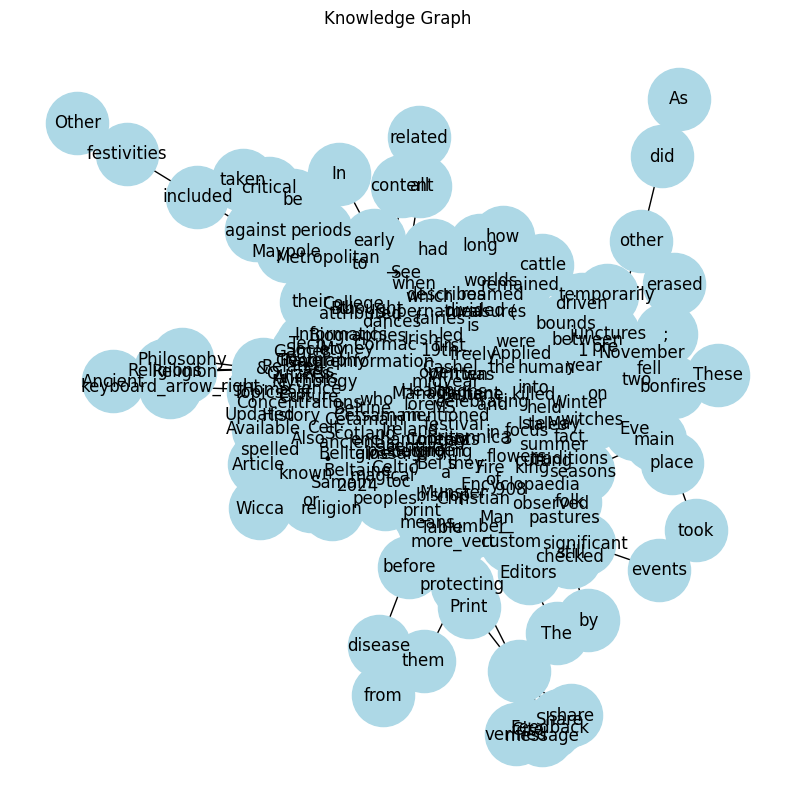

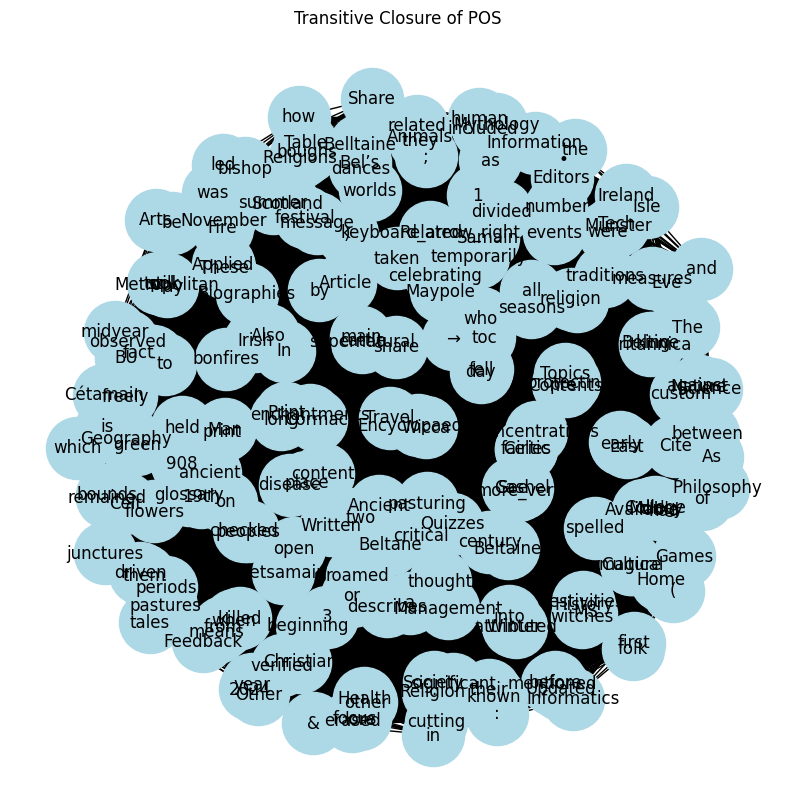

In [ ]:
import spacy
import nltk
import networkx as nx
import matplotlib.pyplot as plt
import fitz  # PyMuPDF
import requests

# Initialize spaCy's English model
nlp = spacy.load('en_core_web_sm')

def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    # Display the POS tags with their types
    for node, attributes in kg.nodes(data=True):
        pos = attributes['pos']
        print(f'{node} ({pos})')

    # Visualize the KG using NetworkX
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(kg)
    nx.draw_networkx(kg, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Knowledge Graph')
    plt.axis('off')
    plt.show()

    # Visualize the transitive closure of POS using NetworkX
    plt.figure(figsize=(10, 10))
    pos_closure = nx.spring_layout(closure)
    nx.draw_networkx(closure, pos_closure, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Transitive Closure of POS')
    plt.axis('off')
    plt.show()

    return kg, closure

def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Example usage with PDF
pdf_file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-3-Low.pdf'
kg, closure = generate_pos_kg(pdf_file_path)


By 
Updated on February 03, 2020
April's showers have given way to rich and fertile earth, and as the land
greens, there are few celebrations as representative of fertility as
Beltane. Observed on May 1st (or October 31 - November 1 for our
Southern Hemisphere readers), festivities typically begin the evening
before, on the last night of April. It's a time to welcome the abundance of
the fertile earth, and a day that has a 
.
There are many different ways you can celebrate Beltane, but the focus
is nearly always on fertility. It's the time when the earth mother opens up
Matt Cardy / Getty Images
Patti Wigington
long (and sometimes scandalous)
history
Advertisement
to the fertility god, and their union brings about healthy livestock, strong
crops, and new life all around.
Here are a few rituals you may want to think about trying—and
remember, any of them can be adapted for either a solitary practitioner
or a small group, with just a little planning ahead. Try some of these
rituals and c

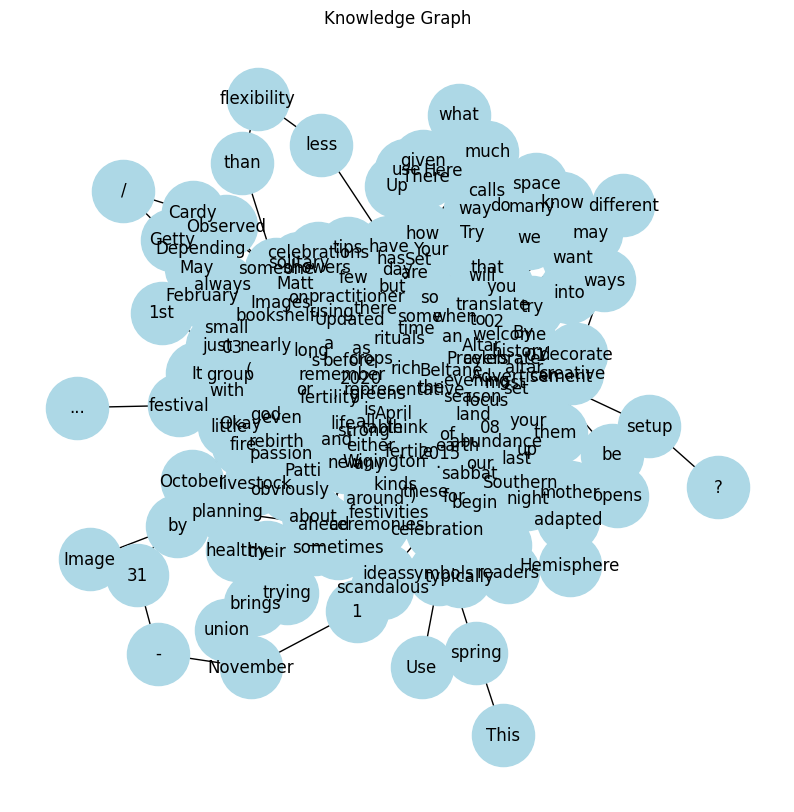

In [ ]:
# Initialize spaCy's English model
nlp = spacy.load('en_core_web_sm')

def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg3 = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg3.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg3, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg3.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure3 = nx.transitive_closure(kg3)

    # Display the POS tags with their types
    for node, attributes in kg3.nodes(data=True):
        pos = attributes['pos']
        print(f'{node} ({pos})')

    # Visualize the KG using NetworkX
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(kg3)
    nx.draw_networkx(kg3, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Knowledge Graph')
    plt.axis('off')
    plt.show()



    return kg3
def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Example usage with PDF
pdf_file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-1-High.pdf'
kg3 = generate_pos_kg(pdf_file_path)


What Is Beltane?
Beltane is a pagan holiday celebrated on May 1st, marking the end
of winter and the beginning of summer. It is a time when the God
and Goddess are equal in power, and the masculine and feminine
energies are united. The holiday celebrates their sacred union
through traditions such as fertility rites, fire festivals, and dancing
around the maypole.
Beltane is also known as May Day to some. It falls between the
spring equinox and the summer solstice and really brings attention
to the heart of spring.
During Beltane, pagans believe that the veil between the physical
and spiritual worlds is thin, making it easier to communicate with
spirits and ancestors. It is also a good time to honor the earth and
all its abundance, as well as to celebrate the growth and renewal of
nature.
One of the most important aspects of Beltane is the celebration of
fire. Fire is representative of love and passion, and it is often used in
rituals and ceremonies during this time. Lighting candles an

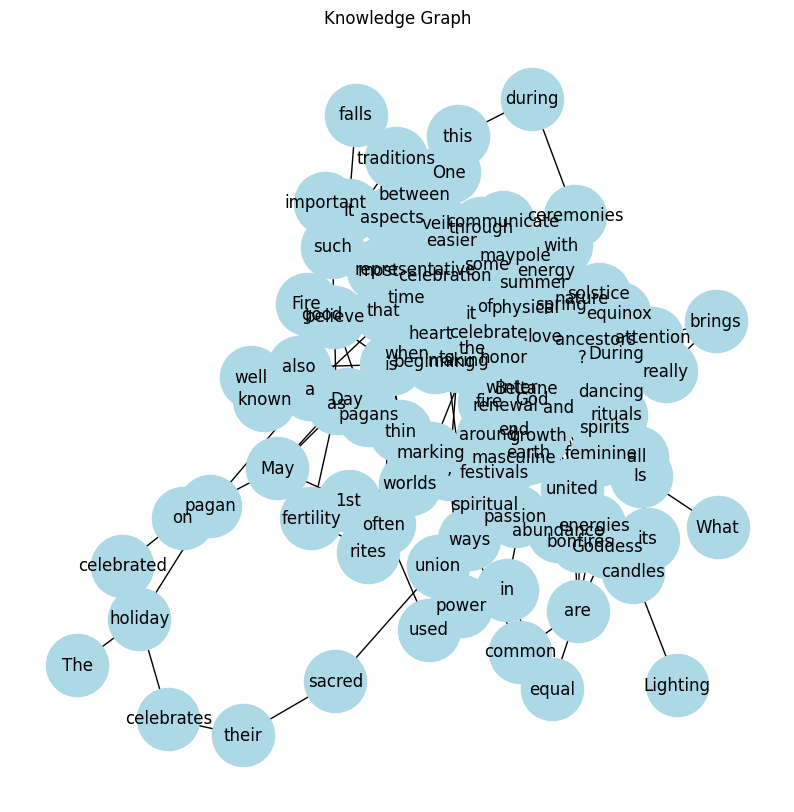

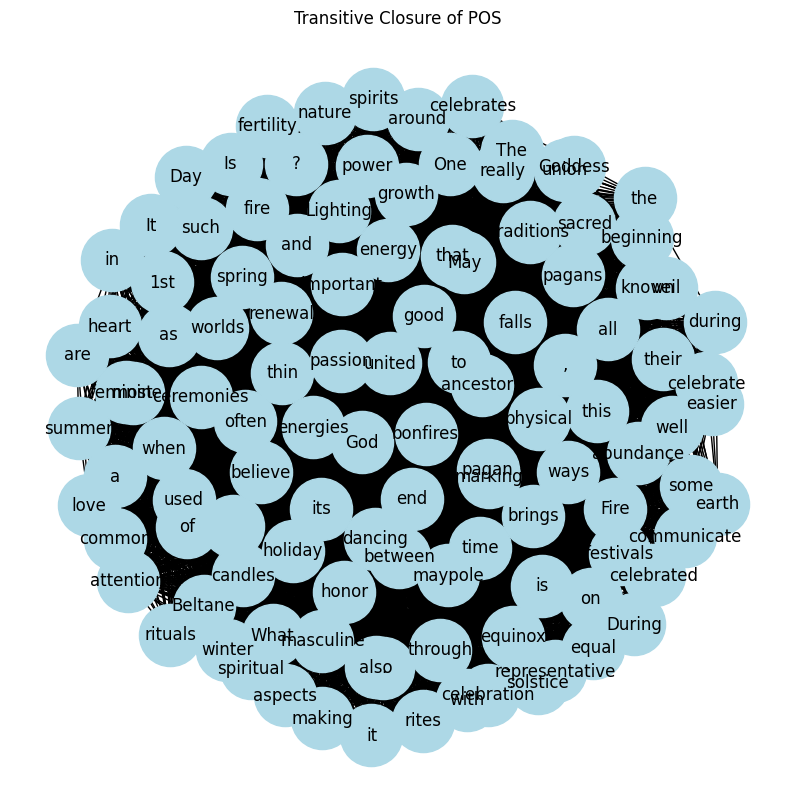

In [ ]:

# Initialize spaCy's English model
nlp = spacy.load('en_core_web_sm')

def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg2 = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg2.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg2, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg2.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure2 = nx.transitive_closure(kg2)

    # Display the POS tags with their types
    for node, attributes in kg2.nodes(data=True):
        pos = attributes['pos']
        print(f'{node} ({pos})')

    # Visualize the KG using NetworkX
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(kg2)
    nx.draw_networkx(kg2, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Knowledge Graph')
    plt.axis('off')
    plt.show()

    # Visualize the transitive closure of POS using NetworkX
    plt.figure(figsize=(10, 10))
    pos_closure = nx.spring_layout(closure2)
    nx.draw_networkx(closure2, pos_closure, with_labels=True, node_color='lightblue', node_size=2000, font_size=12)
    plt.title('Transitive Closure of POS')
    plt.axis('off')
    plt.show()

    return kg2, closure2

def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Example usage with PDF
pdf_file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-2-Medium.pdf'
kg2, closure2 = generate_pos_kg(pdf_file_path)


In [ ]:
pip install node2vec


In [ ]:
from node2vec import Node2Vec

def kg_to_embeddings(kg):
    # Initialize and train node2vec model
    node2vec = Node2Vec(kg, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Generate embeddings for each node
    embeddings = {str(node): model.wv[str(node)] for node in kg.nodes}
    return embeddings



In [ ]:
kg_to_embeddings(kg)

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/218 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
Generating walks (CPU: 2): 100%|██████████| 50/50 [00:01<00:00, 33.47it/s]


{'Home': array([ 0.42711416, -0.1967531 , -0.2877087 ,  0.22924988,  0.11366719,
         0.15537326, -0.43547183, -0.11111219,  0.13547072, -0.10314027,
         0.14701898, -0.16774842, -0.1058163 ,  0.03209691,  0.21854529,
        -0.21504727, -0.19576004, -0.3632927 , -0.14356184,  0.10955666,
         0.07844873,  0.2095909 , -0.23675744,  0.24121961, -0.3764425 ,
         0.01008996,  0.59405535, -0.06913712,  0.07090051, -0.12034598,
         0.04746765, -0.14892018, -0.05794194, -0.08072293,  0.09104993,
         0.22139221,  0.01189652,  0.26331013, -0.23755461, -0.04462393,
        -0.37053275, -0.00782737, -0.1449163 , -0.03315768,  0.17437746,
        -0.03581374, -0.10419241, -0.26408508, -0.21935727,  0.18008302,
        -0.01777412,  0.09083502, -0.31863847, -0.13333933, -0.1431731 ,
         0.13574855,  0.26977003, -0.35980952,  0.09901221,  0.0849961 ,
        -0.08014902,  0.14766756, -0.17880696,  0.02013307,  0.00924818,
         0.38265538, -0.21028382, -0.148125

In [ ]:
kg_to_embeddings(kg2)

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/114 [00:00<?, ?it/s]

Generating walks (CPU: 3): 100%|██████████| 50/50 [00:00<00:00, 68.75it/s]


{'What': array([-0.40819523,  0.23807958, -0.10114375,  0.12924805,  0.01617503,
         0.31681865,  0.02775588,  0.17152874,  0.59598285,  0.0328754 ,
         0.15105677, -0.372503  , -0.21131155, -0.31437132, -0.16008693,
        -0.02256988,  0.05371381, -0.20964174, -0.06549768, -0.1026418 ,
        -0.08529395,  0.32381552,  0.21510997, -0.4591898 , -0.41211414,
         0.10946231, -0.13891788,  0.29224253,  0.17515954, -0.2776303 ,
        -0.09806594, -0.36507344, -0.14476821, -0.12550223,  0.0094468 ,
        -0.19083622, -0.13628747, -0.08746192, -0.3113321 , -0.11502979,
         0.28578883, -0.02027208, -0.43976176, -0.17475559,  0.35971376,
        -0.1692371 ,  0.4654621 ,  0.20098579, -0.1490712 , -0.28501558,
         0.19841601,  0.10962358,  0.04422662,  0.10500478,  0.44548628,
        -0.03611704,  0.00720645,  0.07263496, -0.21210463,  0.3022095 ,
        -0.23139301,  0.3356945 , -0.08940847,  0.15237397, -0.16062662,
        -0.03935876, -0.35858575,  0.418448

In [ ]:
kg_to_embeddings(kg3)

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/193 [00:00<?, ?it/s]

Generating walks (CPU: 3): 100%|██████████| 50/50 [00:01<00:00, 27.58it/s]


{'By': array([ 0.02318038, -0.06572364,  0.01249798,  0.04858156,  0.11490618,
         0.1353428 , -0.12246184, -0.11645707,  0.02737769,  0.09789248,
        -0.00047441, -0.03017719,  0.0788502 , -0.13297538, -0.02370567,
         0.14717594,  0.00349319,  0.28171852,  0.06267517,  0.02101616,
        -0.12262772,  0.06181541, -0.00923248, -0.27675068, -0.1144869 ,
        -0.04682404, -0.03808018,  0.15618216,  0.09655791, -0.07673796,
         0.1404418 ,  0.02481292,  0.11799483, -0.02543516, -0.08827915,
         0.07057471,  0.09968199,  0.02703654, -0.18529026, -0.16870588,
        -0.00618323,  0.06975432,  0.12580672, -0.17249309,  0.00062186,
         0.1347401 ,  0.19025585, -0.03238836,  0.13829853,  0.05549368,
        -0.0673132 ,  0.11172134,  0.34881192,  0.14957552, -0.29016134,
        -0.08938206,  0.18104623,  0.13022977,  0.07377105, -0.08218569,
        -0.16149656,  0.3195668 ,  0.04286958, -0.10190669, -0.12213915,
         0.14919525, -0.01273776, -0.15160014

In [ ]:
pip install chromadb

In [ ]:
import chromadb

# Initialize ChromaDB client
client = chromadb.Client()

# List all collections
collections = client.list_collections()

# Print collection names
for collection in collections:
    print("Collection Name:", collection.name)


## **c. then retrieve the articles based on the poem as a query to the LLM**




In [ ]:
import spacy
import fitz  # PyMuPDF
import networkx as nx
import matplotlib.pyplot as plt
from node2vec import Node2Vec
import chromadb
from chromadb.utils import embedding_functions

# Initialize spaCy's English model
nlp = spacy.load('en_core_web_sm')

def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    return kg, closure

def kg_to_embeddings(kg):
    # Initialize and train node2vec model
    node2vec = Node2Vec(kg, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Generate embeddings for each node
    embeddings = {str(node): model.wv[str(node)] for node in kg.nodes}
    return embeddings

def store_embeddings_in_chromadb(embeddings):
    # Initialize ChromaDB client
    client = chromadb.Client()

    # Create or connect to a collection
    collection_name = "kg_embeddings"
    collection = client.create_collection(collection_name)

    # Prepare data for insertion
    for node, embedding in embeddings.items():
        collection.add(
            ids=[node],
            embeddings=[embedding.tolist()],
            metadatas=[{"node": node}]
        )
    print(f"Stored {len(embeddings)} embeddings in ChromaDB")

# Sample file path
file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-3-Low.pdf'
  # Replace with your actual file path

# Generate POS and KG
kg, closure = generate_pos_kg(file_path)

# Convert KG to embeddings
embeddings = kg_to_embeddings(closure)

# Store embeddings in ChromaDB
store_embeddings_in_chromadb(embeddings)


Home
Games & Quizzes
History & Society
Science & Tech
Biographies
Animals & Nature
Geography & Travel
Arts & Culture
Money
Home keyboard_arrow_right Philosophy & Religion keyboard_arrow_right Ancient Religions & Mythology
Beltane
ancient Celtic festival
print Print  verified Cite  share Share  message Feedback  more_vert
Also known as: Bel’s-Fire, Belltaine, Beltaine, Beltine, Cétamain, Cetsamain
Written and fact-checked by The Editors of Encyclopaedia Britannica
Last Updated: May 3, 2024 • Article History
toc Table of Contents
Beltane, festival held on the first
day of May in Ireland and
Scotland, celebrating the
beginning of summer and open
pasturing. Beltane is first
mentioned in a glossary
attributed to Cormac, bishop of
Cashel and king of Munster, who
was killed in 908. Cormac
describes how cattle were driven between two bonfires on Beltane as a
magical means of protecting them from disease before they were led
into summer pastures—a custom still observed in Ireland in the 19th
Se

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/218 [00:00<?, ?it/s]

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]


Stored 218 embeddings in ChromaDB


In [ ]:

# Initialize spaCy's English model
nlp = spacy.load('en_core_web_sm')

def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    return kg, closure

def kg_to_embeddings(kg):
    # Initialize and train node2vec model
    node2vec = Node2Vec(kg, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Generate embeddings for each node
    embeddings = {str(node): model.wv[str(node)] for node in kg.nodes}
    return embeddings

def store_embeddings_in_chromadb(embeddings):
    # Initialize ChromaDB client
    client = chromadb.Client()

    # Create or connect to a collection
    collection_name = "kg-high_embeddings"
    collection = client.create_collection(collection_name)

    # Prepare data for insertion
    for node, embedding in embeddings.items():
        collection.add(
            ids=[node],
            embeddings=[embedding.tolist()],
            metadatas=[{"node": node}]
        )
    print(f"Stored {len(embeddings)} embeddings in ChromaDB")

# Sample file path
file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-1-High.pdf'
  # Replace with your actual file path

# Generate POS and KG
kghigh, closure = generate_pos_kg(file_path)

# Convert KG to embeddings
embeddings = kg_to_embeddings(closure)

# Store embeddings in ChromaDB
store_embeddings_in_chromadb(embeddings)


By 
Updated on February 03, 2020
April's showers have given way to rich and fertile earth, and as the land
greens, there are few celebrations as representative of fertility as
Beltane. Observed on May 1st (or October 31 - November 1 for our
Southern Hemisphere readers), festivities typically begin the evening
before, on the last night of April. It's a time to welcome the abundance of
the fertile earth, and a day that has a 
.
There are many different ways you can celebrate Beltane, but the focus
is nearly always on fertility. It's the time when the earth mother opens up
Matt Cardy / Getty Images
Patti Wigington
long (and sometimes scandalous)
history
Advertisement
to the fertility god, and their union brings about healthy livestock, strong
crops, and new life all around.
Here are a few rituals you may want to think about trying—and
remember, any of them can be adapted for either a solitary practitioner
or a small group, with just a little planning ahead. Try some of these
rituals and c

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/193 [00:00<?, ?it/s]

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Stored 193 embeddings in ChromaDB


In [ ]:
def read_pdf(file_path):
    # Open the PDF file
    pdf_document = fitz.open(file_path)
    text = ""

    # Extract text from each page
    for page_num in range(len(pdf_document)):
        page = pdf_document.load_page(page_num)
        text += page.get_text()

    return text

def generate_pos_kg(file_path):
    # Read the PDF file
    text = read_pdf(file_path)
    print(text)

    # Tokenize the text using spaCy's tokenizer
    doc = nlp(text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    return kg, closure

def kg_to_embeddings(kg):
    # Initialize and train node2vec model
    node2vec = Node2Vec(kg, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Generate embeddings for each node
    embeddings = {str(node): model.wv[str(node)] for node in kg.nodes}
    return embeddings

def store_embeddings_in_chromadb(embeddings):
    # Initialize ChromaDB client
    client = chromadb.Client()

    # Create or connect to a collection
    collection_name = "kg-medium_embeddings"
    collection = client.create_collection(collection_name)

    # Prepare data for insertion
    for node, embedding in embeddings.items():
        collection.add(
            ids=[node],
            embeddings=[embedding.tolist()],
            metadatas=[{"node": node}]
        )
    print(f"Stored {len(embeddings)} embeddings in ChromaDB")

# Sample file path
file_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-2-Medium.pdf'
  # Replace with your actual file path

# Generate POS and KG
kgmedium, closure = generate_pos_kg(file_path)

# Convert KG to embeddings
embeddings = kg_to_embeddings(closure)

# Store embeddings in ChromaDB
store_embeddings_in_chromadb(embeddings)


What Is Beltane?
Beltane is a pagan holiday celebrated on May 1st, marking the end
of winter and the beginning of summer. It is a time when the God
and Goddess are equal in power, and the masculine and feminine
energies are united. The holiday celebrates their sacred union
through traditions such as fertility rites, fire festivals, and dancing
around the maypole.
Beltane is also known as May Day to some. It falls between the
spring equinox and the summer solstice and really brings attention
to the heart of spring.
During Beltane, pagans believe that the veil between the physical
and spiritual worlds is thin, making it easier to communicate with
spirits and ancestors. It is also a good time to honor the earth and
all its abundance, as well as to celebrate the growth and renewal of
nature.
One of the most important aspects of Beltane is the celebration of
fire. Fire is representative of love and passion, and it is often used in
rituals and ceremonies during this time. Lighting candles an

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/114 [00:00<?, ?it/s]

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:02<00:00, 19.78it/s]


Stored 114 embeddings in ChromaDB


In [ ]:
!pip install -U langchain-community chromadb==0.4.22 typing_extensions==4.7.1

  Using cached typing_extensions-4.7.1-py3-none-any.whl (33 kB)
  Attempting uninstall: typing_extensions
    Found existing installation: typing_extensions 4.11.0
    Uninstalling typing_extensions-4.11.0:
      Successfully uninstalled typing_extensions-4.11.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 2.2.2 which is incompatible.
fastapi-cli 0.0.3 requires typer>=0.12.3, but you have typer 0.9.4 which is incompatible.
torch 2.2.1+cu121 requires typing-extensions>=4.8.0, but you have typing-extensions 4.7.1 which is incompatible.


In [ ]:
! pip install --upgrade langchain langchain-google-genai "langchain[docarray]" faiss-cpu

In [ ]:
from google.colab import userdata
#langchain is essentially the orchestrator of the chain components helping with scalability
from langchain_google_genai import ChatGoogleGenerativeAI

/usr/local/lib/python3.10/dist-packages/google/colab/html/_background_server.py:103: DeprecationWarning: make_current is deprecated; start the event loop first
  ioloop.make_current()


In [ ]:
chat = ChatGoogleGenerativeAI(model="gemini-1.5-pro-latest", google_api_key = userdata.get('GOOGLE_API_KEY'))

In [ ]:
pip install --upgrade ipykernel

In [ ]:
#these are langchain components that helps in better prompting the behavior of the LLM
from langchain.schema import (
    SystemMessage,
    HumanMessage,
    AIMessage
)
#here the langchain messages components are initialized
messages = [
    SystemMessage(content="Please act like a helpful assistant."),   #role of the ecosystem
    HumanMessage(content="Hi, can you help me out with a task?"),    #need of the user
    AIMessage(content="Sure, how can I help you?"),                  #role of the assistant
    HumanMessage(content="I'd like you to list a poem of any type") #need of the user
            ]
    # Invoke the chat object with messages
res = chat.invoke(messages)
print(res.content)


What kind of poem are you looking for? 

For example, I can share:

* **A classic:** Like something by Robert Frost or Emily Dickinson
* **Something funny:**  A limerick or humorous verse
* **Something thought-provoking:**  Maybe a haiku or free verse poem 

Tell me what you'd like, and I'll find the perfect poem for you! 



In [ ]:
#"res" is just another AIMessage object so one can append it to messages, add another HumanMessage and generate the next response in the conversation
messages.append(res)                                                                                             #appending it to messages
prompt= HumanMessage(content=" give any poem ")   #creating new HumanMessage
messages.append(prompt)                                                                                          #adding the prompt to the messages
res = chat.invoke(messages)                                                                                             #sending it to the model

print(res.content)

Here's a short and sweet poem by Emily Dickinson:

"Hope" is the thing with feathers -
That perches in the soul -
And sings the tune without the words -
And never stops - at all -

And sweetest - in the Gale - is heard -
And sore must be the storm -
That could abash the little Bird
That kept so many warm -

I’ve heard it in the chillest land -
And on the strangest Sea -
Yet - never - in Extremity,
It asked a crumb - of me. 



In [ ]:

chat = ChatGoogleGenerativeAI(model="gemini-1.5-pro-latest", google_api_key = userdata.get('GOOGLE_API_KEY'))

In [ ]:
def generate_query_embeddings(query_text, nlp):
    # Tokenize the text using spaCy's tokenizer
    doc = nlp(query_text)

    # Initialize the knowledge graph
    kg = nx.Graph()

    # Process each sentence
    for sentence in doc.sents:
        # Extract tokens and their POS tags
        tokens = [(token.text, token.pos_) for token in sentence]

        # Add the tokens as nodes and their POS tags as node attributes to the KG
        kg.add_nodes_from([token[0] for token in tokens])
        nx.set_node_attributes(kg, {token[0]: token[1] for token in tokens}, 'pos')

        # Add edges between adjacent tokens in the sentence
        edges = [(tokens[i][0], tokens[i+1][0]) for i in range(len(tokens)-1)]
        kg.add_edges_from(edges)

    # Compute the transitive closure of the KG
    closure = nx.transitive_closure(kg)

    # Initialize and train node2vec model
    node2vec = Node2Vec(kg, dimensions=128, walk_length=30, num_walks=200, workers=4)
    model = node2vec.fit(window=10, min_count=1, batch_words=4)

    # Generate embeddings for each node
    embeddings = [model.wv[str(node)] for node in kg.nodes]
    return sum(embeddings) / len(embeddings)  # Average the embeddings to get a single vector


In [ ]:
query1 = """Take below poem and retrieve the news article which relates to this below poem such as related to the beltane festival or celebration or holiday or anything related to it-
A boy green shouldered, grows
like corn endlessly and over night.
There is no laying on of hands
and praying him small again. He
will not be touched like that. Beltone festival"""

In [ ]:
query_embedding = generate_query_embeddings(query1, nlp)

/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/53 [00:00<?, ?it/s]

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:00<00:00, 130.76it/s]


In [ ]:
query_embedding

array([ 1.33660054e-02, -8.33818763e-02,  2.80625612e-01, -3.60442442e-03,
        2.80862842e-02, -1.75805300e-01, -9.50272605e-02,  4.24762145e-02,
        2.15818956e-02, -4.18005288e-02,  1.92207247e-01, -6.97711334e-02,
        1.92759354e-02, -1.50132522e-01,  1.40884057e-01, -7.11264461e-02,
        2.90739797e-02,  9.09924358e-02, -7.87801817e-02,  9.15690213e-02,
        1.18973441e-01,  7.03843832e-02,  5.02387099e-02, -9.35406685e-02,
       -9.23880786e-02, -2.16532741e-02, -1.47746027e-01,  1.34736136e-01,
        5.91020510e-02,  7.87108764e-02, -2.57971913e-01,  1.29764125e-01,
       -1.37644738e-01,  3.90447257e-03, -2.86638122e-02,  5.52107841e-02,
        1.50378987e-01,  1.78331556e-03,  1.57001242e-01,  6.70143170e-03,
       -3.46688591e-02, -3.13319787e-02,  1.09466128e-01, -8.03005174e-02,
       -5.65987565e-02,  5.78147434e-02,  4.21791077e-02, -1.58143371e-01,
        3.10045388e-02,  1.41228005e-01,  8.25486779e-02, -3.84359658e-02,
        1.43104149e-02,  

In [ ]:
import chromadb

def list_all_collections():
    # Initialize ChromaDB client
    client = chromadb.Client()

    # List all collections
    collections = client.list_collections()

    # Print the names of the collections
    for collection in collections:
        print(f"Collection Name: {collection.name}")

if __name__ == "__main__":
    list_all_collections()


Collection Name: kg_embeddings
Collection Name: kg-high_embeddings
Collection Name: kg-medium_embeddings


In [ ]:
import numpy as np

In [ ]:
def retrieve_similar_articles(query_embedding, collection_name):
    # Initialize ChromaDB client
    client = chromadb.Client()

    # Connect to the collection
    collection = client.get_collection(collection_name)

    # Debug: Check if the collection is connected properly
    print(f"Connected to collection: {collection_name}")

    # Convert the query embedding to a list (if necessary)
    if isinstance(query_embedding, np.ndarray):
        query_embedding = query_embedding.tolist()

    # Query ChromaDB with the query embedding
    try:
        results = collection.query(
            query_embeddings=[query_embedding],  # Correct parameter name for embeddings
            n_results=3  # Retrieve top 3 similar articles
        )

        # Debug: Check the structure of the results
        print(f"Query results type: {type(results)}")
        print(f"Query results: {results}")

        # Handle the results, assuming the 'documents' key holds lists
        documents = results.get('documents', [[]])

        # Extract the text content, handling None values
        similar_articles = []
        for doc_list in documents:
            for doc in doc_list:
                if doc is not None:
                    similar_articles.append(doc)
                else:
                    # Handle the case where documents are None by using metadata if available
                    metadatas = results.get('metadatas', [[]])
                    for metadata_list in metadatas:
                        for metadata in metadata_list:
                            if metadata and 'node' in metadata:
                                similar_articles.append(metadata['node'])

        return similar_articles
    except Exception as e:
        print(f"Error querying ChromaDB: {e}")
        return None


In [ ]:
def contextualize_prompt(query_text, similar_articles):
    if similar_articles is None:
        return f"No similar articles found for the query: {query_text}"

    source_knowledge = "\n\n".join(similar_articles)
    print("augumented-prompt-entered-this-section")
    print(similar_articles)


    augmented_prompt = f"""Using the context below, answer the query.

    Source Knowledge: {source_knowledge}

    Query: {query_text}
    """
    return augmented_prompt


In [ ]:
def query_gemini_with_augmented_prompt(query_text, collection_name):
    query_embedding = generate_query_embeddings(query_text, nlp)
    print(f"Query embedding: {query_embedding}")

    similar_articles = retrieve_similar_articles(query_embedding, collection_name)
    print(similar_articles)
    augmented_prompt = contextualize_prompt(query_text, similar_articles)

    messages = [
        SystemMessage(content="Please act like a helpful assistant."),
        HumanMessage(content="Hi, can you help me out with a task?"),
        AIMessage(content="Sure, how can I help you?"),
        HumanMessage(content=f"Using the context below, answer the query.\n\n{augmented_prompt}")
    ]

    res = chat.invoke(messages)
    return res.content


In [ ]:
if __name__ == "__main__":
    # Example query text
    query = """ the query is to find the relevant article form chromadb which is related to this poem's context(for example: I'm lloking for the article related to -symbolism of Beltane)-A boy green shouldered, grows
like corn endlessly and over night.
There is no laying on of hands
and praying him small again. He
will not be touched like that.

His eyes are the color of home -
almond and curious with episodes
of Breughel. He wants life in
detail and spilling
from his pockets.

His laughter cannot be
attached to anything. It leaves
like silver paper geese
in shimmering specks
and fills the air
surrounding for acres
at the speed of memory."""

    # Initialize ChromaDB client and find collection name
    client = chromadb.Client()
    collections = client.list_collections()
    collection_name = collections[0].name if collections else None

    if collection_name:
        # Query Gemini with the augmented prompt using LangChain
        llm_response = query_gemini_with_augmented_prompt(query, collection_name)
        print("LLM Response:\n", llm_response)
    else:
        print("No collections found in ChromaDB.")


/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/usr/local/lib/python3.10/dist-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use th

Computing transition probabilities:   0%|          | 0/91 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already b

Query embedding: [ 0.14125764 -0.06252593  0.23211573 -0.02022807  0.01573545 -0.0938153
  0.05754504  0.04369653 -0.14768447 -0.06500043  0.01295022 -0.05426418
 -0.1155116  -0.02991251  0.242181    0.08953433  0.03813919  0.05892433
 -0.06980682 -0.09444607  0.01007987  0.02332976  0.00506281 -0.10437223
 -0.09086891  0.03608295  0.03145582  0.08647718  0.06929954 -0.12061371
 -0.07992164 -0.05397552  0.02583038  0.10884005 -0.12536122 -0.02717872
  0.11042    -0.06611595  0.12255283  0.00929762 -0.12159336 -0.02314794
 -0.04227987  0.12083856  0.09703992  0.0479883  -0.0115213  -0.04904744
 -0.05654818  0.03104719 -0.08426107  0.02846188  0.11999238  0.07034945
 -0.07545781  0.10382985  0.09973238  0.08718909 -0.08602093  0.0424685
 -0.01930139  0.03081677  0.07376979  0.09747814  0.10624782 -0.04652826
 -0.03057242 -0.06815761  0.03350705 -0.17477287  0.04624593  0.01188664
 -0.2720683  -0.14360973  0.03938647 -0.15683658 -0.10606546 -0.08662697
  0.01032954  0.11447241  0.08314151

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pdfplumber

In [ ]:
import pdfplumber
import os

def extract_text_from_pdf(file_path):
    text = ''
    with pdfplumber.open(file_path) as pdf:
        for page in pdf.pages:
            text += page.extract_text() + '\n'
    return text

# Paths to your PDF files
pdf_files = ['/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-1-High.pdf',
             '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-2-Medium.pdf',
             '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets/Beltane-Article-3-Low.pdf']

# Extract text from each PDF and store it in a dictionary
extracted_texts = {os.path.basename(pdf): extract_text_from_pdf(pdf) for pdf in pdf_files}

In [ ]:
print(extracted_texts['Beltane-Article-1-High.pdf'])  # Adjust the filename if needed

Advertisement
Matt Cardy / Getty Images
By Patti Wigington
Updated on February 03, 2020
April's showers have given way to rich and fertile earth, and as the land
greens, there are few celebrations as representative of fertility as
Beltane. Observed on May 1st (or October 31 - November 1 for our
Southern Hemisphere readers), festivities typically begin the evening
before, on the last night of April. It's a time to welcome the abundance of
the fertile earth, and a day that has a long (and sometimes scandalous)
history.
There are many different ways you can celebrate Beltane, but the focus
is nearly always on fertility. It's the time when the earth mother opens up
to the fertility god, and their union brings about healthy livestock, strong
crops, and new life all around.
Here are a few rituals you may want to think about trying—and
remember, any of them can be adapted for either a solitary practitioner
or a small group, with just a little planning ahead. Try some of these
rituals and cere

In [ ]:
print(extracted_texts['Beltane-Article-2-Medium.pdf'])  # Adjust the filename if needed

What Is Beltane?
Beltane is a pagan holiday celebrated on May 1st, marking the end
of winter and the beginning of summer. It is a time when the God
and Goddess are equal in power, and the masculine and feminine
energies are united. The holiday celebrates their sacred union
through traditions such as fertility rites, fire festivals, and dancing
around the maypole.
Beltane is also known as May Day to some. It falls between the
spring equinox and the summer solstice and really brings attention
to the heart of spring.
During Beltane, pagans believe that the veil between the physical
and spiritual worlds is thin, making it easier to communicate with
spirits and ancestors. It is also a good time to honor the earth and
all its abundance, as well as to celebrate the growth and renewal of
nature.
One of the most important aspects of Beltane is the celebration of
fire. Fire is representative of love and passion, and it is often used in
rituals and ceremonies during this time. Lighting candles an

In [ ]:
print(extracted_texts['Beltane-Article-3-Low.pdf'])  # Adjust the filename if needed

Home Games & Quizzes History & Society Science & Tech Biographies Animals & Nature Geography & Travel Arts & Culture Money
Home  Philosophy & Religion  Ancient Religions & Mythology
Beltane
ancient Celtic festival MS in Health

Print

Cite

Share

Feedback
 Informatics
Also known as: Bel’s-Fire, Belltaine, Beltaine, Beltine, Cétamain, Cetsamain
Written and fact-checked by The Editors of Encyclopaedia Britannica
Concentrations Available:
Last Updated: May 3, 2024 • Article History Health Information
Management and Applied…

Table of Contents
BU Metropolitan College
Beltane, festival held on the first
Also spelled: Beltine
day of May in Ireland and
Irish: Beltaine or Belltaine
Scotland, celebrating the
Also known as: Cétamain
beginning of summer and open
Related Topics: Ireland • Scotland •
pasturing. Beltane is first
Celtic religion • Wicca • Celt
mentioned in a glossary
attributed to Cormac, bishop of
See all related content →
Cashel and king of Munster, who
was killed in 908. 

In [ ]:
!pip install chromadb PyPDF2

In [ ]:
import os
from PyPDF2 import PdfReader

# Define the path to your PDF files
pdf_folder_path = '/content/drive/MyDrive/ML-Spring-2024/team-GeekSquad/Code/Final-Exam-Poets'  # Adjust the path if necessary
pdf_files = ['Beltane-Article-1-High.pdf', 'Beltane-Article-2-Medium.pdf', 'Beltane-Article-3-Low.pdf']  # Replace with your actual file names

# Function to extract text from a PDF file
def extract_text_from_pdf(pdf_path):
    reader = PdfReader(pdf_path)
    text = ""
    for page in reader.pages:
        text += page.extract_text()
    return text

# Extract text from each PDF
pdf_texts = []
for pdf_file in pdf_files:
    pdf_path = os.path.join(pdf_folder_path, pdf_file)
    text = extract_text_from_pdf(pdf_path)
    pdf_texts.append(text)

# Display the extracted text (for verification)
for i, text in enumerate(pdf_texts):
    print(f"Text from {pdf_files[i]}:\n{text[:500]}...\n")

Text from Beltane-Article-1-High.pdf:
By 
Updated on February 03, 2020
April's showers have given way to rich and fertile earth, and as the land
greens, there are few celebrations as representative of fertility as
Beltane. Observed on May 1st (or October 31 - November 1 for our
Southern Hemisphere readers), festivities typically begin the evening
before, on the last night of April. It's a time to welcome the abundance of
the fertile earth, and a day that has a 
.
There are many different ways you can celebrate Beltane, but the focus...

Text from Beltane-Article-2-Medium.pdf:
What Is Beltane?
Beltane is a pagan holiday celebrated on May 1st, marking the end
of w i n t e r and the beginning of summer. It is a time when the God
and Goddess are equal in power, and the masculine and feminine
energies are united. The holiday celebrates their sacred union
through traditions such as fertility rites, fire festivals, and dancing
around the maypole.
Beltane is also known as May Day to some. It f

/usr/local/lib/python3.10/dist-packages/PyPDF2/__init__.py:21: DeprecationWarning: PyPDF2 is deprecated. Please move to the pypdf library instead.
  warnings.warn(


In [ ]:
import chromadb
from chromadb.config import Settings

# Initialize ChromaDB client with the new configuration
#client = chromadb.Client(Settings(persist_directory="/content/drive/MyDrive/chromadb/"))

# Create a collection (or use an existing one)
collection = client.get_or_create_collection(name="pdf_texts_collection")

# Add text from PDFs to the collection
for i, text in enumerate(pdf_texts):
    collection.add(
        documents=[text],
        metadatas=[{"filename": pdf_files[i]}],
        ids=[str(i)]
    )

print("PDF texts have been added to the ChromaDB collection.")

PDF texts have been added to the ChromaDB collection.


In [ ]:
# Function to fetch and display all documents in the collection
def display_collection_documents(collection):
    # Fetch all document IDs
    all_ids = collection.get(ids=[])

    # Display the documents
    for doc_id in all_ids['ids']:
        doc = collection.get(ids=[doc_id])
        print(f"ID: {doc['ids'][0]}")
        print(f"Filename: {doc['metadatas'][0]['filename']}")
        print(f"Text: {doc['documents'][0][:500]}...")  # Display the first 500 characters
        print("\n")

# Fetch and display documents from the collection
display_collection_documents(collection)

ID: 0
Filename: Beltane-Article-1-High.pdf
Text: By 
Updated on February 03, 2020
April's showers have given way to rich and fertile earth, and as the land
greens, there are few celebrations as representative of fertility as
Beltane. Observed on May 1st (or October 31 - November 1 for our
Southern Hemisphere readers), festivities typically begin the evening
before, on the last night of April. It's a time to welcome the abundance of
the fertile earth, and a day that has a 
.
There are many different ways you can celebrate Beltane, but the focus...


ID: 1
Filename: Beltane-Article-2-Medium.pdf
Text: What Is Beltane?
Beltane is a pagan holiday celebrated on May 1st, marking the end
of w i n t e r and the beginning of summer. It is a time when the God
and Goddess are equal in power, and the masculine and feminine
energies are united. The holiday celebrates their sacred union
through traditions such as fertility rites, fire festivals, and dancing
around the maypole.
Beltane is also known a

**Generate Poems using Gemini AI API**

In [ ]:
!pip install langchain

In [ ]:
!pip install langchain_google_genai

In [ ]:
import os
from PyPDF2 import PdfReader
import chromadb
from chromadb.config import Settings
import re
from google.colab import userdata
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain.schema import SystemMessage, HumanMessage, AIMessage

# Initialize the Gemini AI client
chat = ChatGoogleGenerativeAI(model="gemini-1.5-pro-latest", google_api_key=userdata.get('GOOGLE_API_KEY'))

# Initialize ChromaDB client
#client = chromadb.Client(Settings(persist_directory="/content/drive/MyDrive/chromadb/"))
collection = client.get_or_create_collection(name="pdf_texts_collection")




**Initialize ChromaDB Client and Retrieve Articles**

In [ ]:
def retrieve_articles_from_chromadb(collection):
    all_ids = collection.get(ids=[])
    articles = []
    for doc_id in all_ids['ids']:
        doc = collection.get(ids=[doc_id])
        articles.append({
            "id": doc['ids'][0],
            "filename": doc['metadatas'][0]['filename'],
            "text": doc['documents'][0]
        })
    return articles

# Retrieve articles
articles = retrieve_articles_from_chromadb(collection)



**Chunk the Articles**

In [ ]:
def chunk_text(text, chunk_size=500):
    words = re.split(r'\s+', text)
    chunks = [' '.join(words[i:i + chunk_size]) for i in range(0, len(words), chunk_size)]
    return chunks

# Chunk the articles
article_chunks = []
for article in articles:
    chunks = chunk_text(article['text'])
    article_chunks.append({
        "id": article['id'],
        "filename": article['filename'],
        "chunks": chunks
    })


**Generate Poems from Chunks Using Gemini AI**

In [ ]:
def generate_poem(chat, chunk):
    messages = [
        SystemMessage(content="Please act like a helpful assistant."),
        HumanMessage(content="Hi, can you help me out with a task?"),
        AIMessage(content="Sure, how can I help you?"),
        HumanMessage(content=f"Generate a poem from the following text: {chunk}")
    ]
    response = chat.invoke(messages)
    return response.content if response else "Failed to generate poem"

# Generate poems for each chunk
for article in article_chunks:
    article['poems'] = []
    for chunk in article['chunks']:
        poem = generate_poem(chat, chunk)
        article['poems'].append(poem)

# Display the first poem of the first article for verification
print(article_chunks[0]['poems'][0])


The showers of April have nourished the ground,
A verdant embrace, where life abounds.
Beltane arrives, a time to rejoice,
With fertile earth, we raise our voice.

On May Day's eve, as twilight descends,
A celebration of life begins, transcends.
The Earth Mother's embrace, open wide,
Welcoming the God, side by side.

Their union, a symphony of might,
Bringing forth bounty, day and night.
Livestock thrives, crops stand strong and tall,
New life emerges, answering nature's call.

Altars adorned with symbols of spring,
A tapestry of rebirth, joy they bring.
Fire's passion, a vibrant hue,
Reflecting the love, forever anew.

So let us celebrate, with hearts aflame,
Beltane's magic, whispering our name.
For in this dance of life, we find our place,
Embraced by nature's abundant grace. 



**Experiment 1: Default Chunk Size (500 words)**

In [ ]:
# Function to chunk text into smaller pieces with specified chunk size
def chunk_text(text, chunk_size=500):
    words = re.split(r'\s+', text)
    chunks = [' '.join(words[i:i + chunk_size]) for i in range(0, len(words), chunk_size)]
    return chunks

# Chunk the articles
article_chunks_500 = []
for article in articles:
    chunks = chunk_text(article['text'], chunk_size=500)
    article_chunks_500.append({
        "id": article['id'],
        "filename": article['filename'],
        "chunks": chunks
    })

# Generate poems for each chunk with default chunk size
for article in article_chunks_500:
    article['poems'] = []
    for chunk in article['chunks']:
        poem = generate_poem(chat, chunk)
        article['poems'].append(poem)

# Display the first poem of the first article with default chunk size
print("First poem with default chunk size (500 words):\n", article_chunks_500[0]['poems'][0])

First poem with default chunk size (500 words):
 April's showers depart,
Leaving fertile earth behind,
A verdant canvas, a fresh start,
For Beltane, a joyous time to find.

On May's first day, or autumn's eve,
We welcome abundance, life anew,
The Earth Mother's embrace, we receive,
As fertile ground, her love renews.

With fire and passion, rebirth's embrace,
We celebrate with rituals bright,
An altar adorned, a sacred space,
For Beltane's magic, day and night.

Symbols of spring, a vibrant array,
New life, passion, a fiery blaze,
We honor the Earth, on this blessed day,
And welcome the season's bountiful ways. 



**Experiment 2: Smaller Chunk Size (250 words)**  

In [ ]:
# Chunk the articles with a smaller chunk size
article_chunks_250 = []
for article in articles:
    chunks = chunk_text(article['text'], chunk_size=250)
    article_chunks_250.append({
        "id": article['id'],
        "filename": article['filename'],
        "chunks": chunks
    })

# Generate poems for each chunk with smaller chunk size
for article in article_chunks_250:
    article['poems'] = []
    for chunk in article['chunks']:
        poem = generate_poem(chat, chunk)
        article['poems'].append(poem)

# Display the first poem of the first article with smaller chunk size
print("First poem with smaller chunk size (250 words):\n", article_chunks_250[0]['poems'][0])

First poem with smaller chunk size (250 words):
 April's showers, a fertile earth's embrace,
Land greened with life, a time and place
For Beltane's fire, a passionate chase.

On May Day's eve, as April takes its leave,
We welcome bounty, the earth's rich weave.
A fertile mother, her love we receive.

To the god of growth, her heart she does give,
Their union a blessing, for all things to live.
Livestock and crops, new life they conceive.

From ancient roots, a history untold,
Of rituals and rites, stories of old,
Beltane's spirit, in our hearts we hold.

With fire and passion, our spirits ignite,
Symbols of spring, bathed in altar light,
A celebration of life, burning ever so bright. 



**Experiment 3: Larger Chunk Size (750 words)**  

In [ ]:
# Chunk the articles with a larger chunk size
article_chunks_750 = []
for article in articles:
    chunks = chunk_text(article['text'], chunk_size=750)
    article_chunks_750.append({
        "id": article['id'],
        "filename": article['filename'],
        "chunks": chunks
    })

# Generate poems for each chunk with larger chunk size
for article in article_chunks_750:
    article['poems'] = []
    for chunk in article['chunks']:
        poem = generate_poem(chat, chunk)
        article['poems'].append(poem)

# Display the first poem of the first article with larger chunk size
print("First poem with larger chunk size (750 words):\n", article_chunks_750[0]['poems'][0])

First poem with larger chunk size (750 words):
 The showers of April, a nourishing rain,
Give way to green fields, fertile and plain.
Beltane arrives, a time to rejoice,
With rituals and revelry, we make our choice.

On May Day's eve, as twilight descends,
The veil thins between, as the old year ends.
A celebration of life, in vibrant array,
To welcome the abundance, on this sacred day.

The Earth Mother awakens, with open embrace,
To the fertile God's touch, in time and space.
Their union brings forth, a bounty untold,
Crops strong and healthy, stories to be told.

An altar adorned, with symbols of spring,
Fire's passion ignites, new life takes wing.
With prayers and intentions, we honor the light,
As darkness recedes, on this Beltane night. 

So let us gather, in circle and song,
Where ancient traditions, to this day belong.
For Beltane is a promise, a vibrant decree,
Of life's endless cycle, for all to see. 



**Comparison:**

**500 words:**

**Coherence:** High coherence with a consistent narrative throughout.

**Quality:** Good poetic quality with rich imagery and strong rhythm.

**250 words:**

**Coherence:** Very high coherence. The poem feels more concise and to the point.

**Quality:** Excellent poetic quality with vivid imagery and a strong narrative. The shorter chunk size seems to result in a more focused and impactful poem.

**750 words:**

**Coherence:** Moderate coherence. While the poem maintains a consistent narrative, it seems slightly more fragmented than the others.

**Quality:** Good poetic quality but slightly less impactful due to the larger chunk size.

# **Conclusion**

**Smaller Chunk Size (250 words)** appears to produce the most coherent and high-quality poems. The poems generated with this chunk size are concise, coherent, and impactful, with vivid imagery and strong rhythm.